<a href="https://colab.research.google.com/github/lrrong2020/A/blob/main/FYP_Pro_T4_overfit_finish_02dropout.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Mount Google Drive

In [2]:
from google.colab import auth
!sudo echo -ne '\n' | sudo add-apt-repository ppa:alessandro-strada/ppa >/dev/null 2>&1 # note: >/dev/null 2>&1 is used to supress printing
!sudo apt update >/dev/null 2>&1
!sudo apt install google-drive-ocamlfuse >/dev/null 2>&1
!google-drive-ocamlfuse
!sudo apt-get install w3m >/dev/null 2>&1 # to act as web browser
!xdg-settings set default-web-browser w3m.desktop >/dev/null 2>&1 # to set default browser
%cd /content
!mkdir gdrive
%cd gdrive
!mkdir "MyDrive"
!google-drive-ocamlfuse "/content/gdrive/MyDrive"

/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: lynx: not found
/usr/bin/xdg-open: 882: w3m: not found
xdg-open: no method available for opening 'https://accounts.google.com/o/oauth2/auth?client_id=564921029129.apps.googleusercontent.com&redirect_uri=https%3A%2F%2Fgd-ocaml-auth.appspot.com%2Foauth2callback&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&response_type=code&access_type=offline&approval_prompt=force&state=em7BEq8TorQISm89Z3ho8eNv-dsinLENHufmIKl72mY'
/bin/sh: 1: firefox: not found
/bin/sh: 1: google-chrome: not found
/bin/sh: 1: chromium-browser: not found
/usr/bin/open: 882: www-browser: not found
/usr/bin/open: 882: links2: not found
/usr/bin/open: 882: elinks: not found
/usr/bin/open: 882: links: not found
/usr/bin/open: 882: lynx: not found
/usr/bin/open: 882: w3m: not found
xdg-open: no method available for opening '

Prep

In [ ]:
!cp /content/gdrive/MyDrive/Kaggle/unzip/data.zip /content

!unzip -nq /content/data.zip

!rm /content/data.zip

%cd /content

#GitHub

In [ ]:
import pandas as pd #For reading csv files.
import numpy as np
import os
import matplotlib.pyplot as plt #For plotting.
import PIL.Image as Image #For working with image files.

#Importing torch
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset,DataLoader #For working with data.
from torchvision import models,transforms #For pretrained models,image transformations.
from torch.optim.lr_scheduler import StepLR

#manual seed for reproductivity and potential performance improvement
torch.manual_seed(3407)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') #Use GPU if it's available or else use CPU.
print(device) #Prints the device we're using.

cuda


In [ ]:
!cp /content/gdrive/MyDrive/Kaggle/unzip/allLabels.csv /content

In [ ]:

path = "/content/"

#label csv
all_df = pd.read_csv(f"{path}allLabels.csv")

from sklearn.model_selection import train_test_split
# subset for hyperparameters tuning

part = 0.20
train_df, drop_df = train_test_split(all_df, test_size=part, random_state=42)
test_sample_size = round(7000 * (1 - part) )  #roughtly 1/3
train_df, test_df = train_test_split(train_df, test_size=test_sample_size, random_state=42)

# Assuming train_df is your original training DataFrame
# test_sample_size = 7000 # roughtly 1/3
# train_df, test_df = train_test_split(all_df, test_size=test_sample_size, random_state=42)

# Now split the remaining training data into training and validation sets
train_df, valid_df = train_test_split(train_df, test_size=0.1, random_state=42)

print(f'No.of.training_samples: {len(train_df)}')
print(f'No.of.testing_samples: {len(test_df)}')
print(f'No.of.val_samples: {len(valid_df)}')

No.of.training_samples: 5062
No.of.testing_samples: 1400
No.of.val_samples: 563


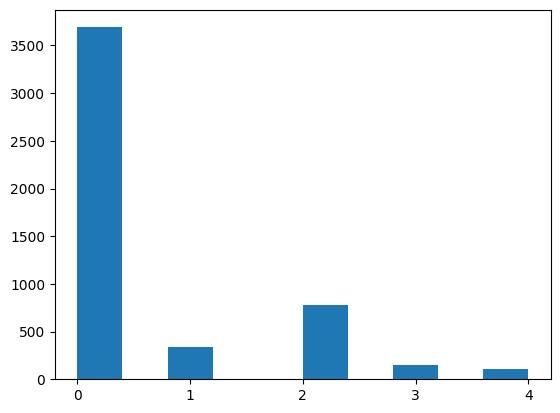

In [ ]:
#Histogram of label counts.
train_df.level.hist()
plt.xticks([0,1,2,3,4])
plt.grid(False)
plt.show()

In [ ]:
#As you can see,the data is imbalanced.
#So we've to calculate weights for each class,which can be used in calculating loss.

from sklearn.utils import class_weight #For calculating weights for each class.
class_weights = class_weight.compute_class_weight(class_weight='balanced',classes=np.array([0,1,2,3,4]),y=train_df['level'].values)
class_weights = torch.tensor(class_weights,dtype=torch.float).to(device)

print(class_weights) #Prints the calculated weights for the classes.

tensor([0.2743, 2.9776, 1.3030, 6.9342, 9.3741], device='cuda:0')


In [ ]:
#For getting a random image from our training set.
# num = int(np.random.randint(0,len(train_df)-1,(1,))) #Picks a random number.
# sample_image = (f'{path}train/{train_df["image"][num]}.jpeg')#Image file.
# sample_image = Image.open(sample_image)
# plt.imshow(sample_image)
# plt.axis('off')
# plt.title(f'Class: {train_df["level"][num]}') #Class of the random image.
# plt.show()

In [ ]:
class dataset(Dataset): # Inherits from the Dataset class.
    '''
    dataset class overloads the __init__, __len__, __getitem__ methods of the Dataset class.

    Attributes :
        df:  DataFrame object for the csv file.
        data_path: Location of the dataset.
        image_transform: Transformations to apply to the image.
        train: A boolean indicating whether it is a training_set or not.
    '''

    def __init__(self,df,data_path,image_transform=None,train=True): # Constructor.
        super(Dataset,self).__init__() #Calls the constructor of the Dataset class.
        self.df = df
        self.data_path = data_path
        self.image_transform = image_transform
        self.train = train

    def __len__(self):
        return len(self.df) #Returns the number of samples in the dataset.

    def __getitem__(self,index):
        image_id = self.df['image'][index]
        image = Image.open(f'{self.data_path}/{image_id}.jpeg') #Image.
        if self.image_transform :
            image = self.image_transform(image) #Applies transformation to the image.

        if self.train :
            label = self.df['level'][index] #Label.
            return image,label #If train == True, return image & label.

        else:
            return image #If train != True, return image.


In [ ]:
image_transform = transforms.Compose([transforms.Resize([512,512]),
                                      transforms.ToTensor(),
                                      transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))]) #Transformations to apply to the image.

train_df = train_df.reset_index(drop=True)
valid_df = valid_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

train_set = dataset(train_df,f'{path}train',image_transform=image_transform)
test_set = dataset(test_df,f'{path}train',image_transform=image_transform)
valid_set = dataset(valid_df,f'{path}train',image_transform=image_transform)

In [ ]:
train_dataloader = DataLoader(train_set,batch_size=16,shuffle=True, num_workers=4)
valid_dataloader = DataLoader(valid_set,batch_size=16,shuffle=False, num_workers=4)
test_dataloader = DataLoader(test_set, batch_size=16, shuffle=False, num_workers=4)

In [ ]:
from torchvision.models import resnet50,ResNet50_Weights

model = models.resnet50(weights=ResNet50_Weights.DEFAULT) #Downloads the resnet50 model which is pretrained on Imagenet dataset.
# Replace the Final layer of pretrained resnet50
model.fc = nn.Sequential(
    nn.Linear(2048, 5),
)

In [ ]:
model = model.to(device) #Moves the model to the device.

In [ ]:
def train(dataloader,model,loss_fn,optimizer):
    '''
    train function updates the weights of the model based on the
    loss using the optimizer in order to get a lower loss.

    Args :
         dataloader: Iterator for the batches in the data_set.
         model: Given an input produces an output by multiplying the input with the model weights.
         loss_fn: Calculates the discrepancy between the label & the model's predictions.
         optimizer: Updates the model weights.

    Returns :
         Average loss per batch which is calculated by dividing the losses for all the batches
         with the number of batches.
    '''

    model.train() #Sets the model for training.

    total = 0
    correct = 0
    running_loss = 0

    for batch,(x,y) in enumerate(dataloader): #Iterates through the batches.


        output = model(x.to(device)) #model's predictions.
        loss   = loss_fn(output,y.to(device)) #loss calculation.

        running_loss += loss.item()

        total        += y.size(0)
        predictions   = output.argmax(dim=1).cpu().detach() #Index for the highest score for all the samples in the batch.
        correct      += (predictions == y.cpu().detach()).sum().item() #No.of.cases where model's predictions are equal to the label.
        accuracy = 100*(correct/total)

        optimizer.zero_grad() #Gradient values are set to zero.
        loss.backward() #Calculates the gradients.
        optimizer.step() #Updates the model weights.

        #for memory
        torch.cuda.empty_cache()

        # Print some information every 100 batches
        if batch % 70 == 0:
            print(f'Batch {batch}/{len(dataloader)} processed, running loss: {running_loss:.6f}, correct predictions: {correct}, total: {total}')


    avg_loss = running_loss/len(dataloader) # Average loss for a single batch

    print(f'\nTraining Loss per batch = {avg_loss:.6f}',end='\t')
    print(f'Accuracy on Training set = {100*(correct/total):.6f}% [{correct}/{total}]') #Prints the Accuracy.

    torch.save(model, '/content/gdrive/MyDrive/Kaggle/unzip/DR_ResNet50_test.pt')
    return avg_loss, accuracy

In [ ]:
def validate(dataloader,model,loss_fn):
    '''
    validate function calculates the average loss per batch and the accuracy of the model's predictions.

    Args :
         dataloader: Iterator for the batches in the data_set.
         model: Given an input produces an output by multiplying the input with the model weights.
         loss_fn: Calculates the discrepancy between the label & the model's predictions.

    Returns :
         Average loss per batch which is calculated by dividing the losses for all the batches
         with the number of batches.
    '''

    model.eval() #Sets the model for evaluation.

    total = 0
    correct = 0
    running_loss = 0

    with torch.no_grad(): #No need to calculate the gradients.

        for x,y in dataloader:

            output        = model(x.to(device)) #model's output.
            loss          = loss_fn(output,y.to(device)).item() #loss calculation.
            running_loss += loss

            total        += y.size(0)
            predictions   = output.argmax(dim=1).cpu().detach()
            correct      += (predictions == y.cpu().detach()).sum().item()
            accuracy = 100*(correct/total)

    avg_loss = running_loss/len(dataloader) #Average loss per batch.

    print(f'\nValidation Loss per batch = {avg_loss:.6f}',end='\t')
    print(f'Accuracy on Validation set = {100*(correct/total):.6f}% [{correct}/{total}]') #Prints the Accuracy.

    return avg_loss, accuracy

In [ ]:
import matplotlib.pyplot as plt

def plot_learning_curve(train_losses, valid_losses, train_accuracies, valid_accuracies):
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, 'g', label='Training Loss')
    plt.plot(epochs, valid_losses, 'b', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, 'g', label='Training Accuracy')
    plt.plot(epochs, valid_accuracies, 'b', label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()


In [ ]:
def optimize(train_dataloader,valid_dataloader,model,loss_fn,optimizer,nb_epochs, patience):
    '''
    optimize function calls the train & validate functions for (nb_epochs) times.

    Args :
        train_dataloader: DataLoader for the train_set.
        valid_dataloader: DataLoader for the valid_set.
        model: Given an input produces an output by multiplying the input with the model weights.
        loss_fn: Calculates the discrepancy between the label & the model's predictions.
        optimizer: Updates the model weights.
        nb_epochs: Number of epochs.

    Returns :
        Tuple of lists containing losses for all the epochs.
    '''
    # Initialize the learning rate scheduler
    # scheduler = StepLR(optimizer, step_size=4, gamma=0.5)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3)


    #Lists to store losses for all the epochs.
    train_losses = []
    valid_losses = []
    train_accuracies = []
    valid_accuracies = []

    df = pd.DataFrame(columns=['epoch', 'train_loss', 'train_accuracy', 'valid_loss', 'valid_accuracy'])

    best_valid_loss = float('inf')
    no_improve_epoch = 0

    for epoch in range(nb_epochs):
        print(f'\nEpoch {epoch+1}/{nb_epochs}')
        print('-------------------------------')
        print("Epoch: %d, Learning Rate: %f " % (epoch, optimizer.param_groups[0]['lr']))
        train_loss, train_accuracy = train(train_dataloader,model,loss_fn,optimizer)
        valid_loss, valid_accuracy = validate(valid_dataloader,model,loss_fn)

        train_losses.append(train_loss)
        valid_losses.append(valid_loss)
        train_accuracies.append(train_accuracy)
        valid_accuracies.append(valid_accuracy)

        print(f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}')
        print(f'Valid Loss: {valid_loss:.4f}, Valid Accuracy: {valid_accuracy:.4f}')

        plot_learning_curve(train_losses, valid_losses, train_accuracies, valid_accuracies)


        # Check if the validation loss improved
        if valid_loss < best_valid_loss:
            best_valid_loss = valid_loss
            no_improve_epoch = 0

            # Save the model when validation loss improves
            torch.save(model.state_dict(), 'best_model.pt')
        else:
            no_improve_epoch += 1

        # If the validation loss did not improve for 'patience' epochs, stop training
        if no_improve_epoch >= patience:
            print(f'Early stopping at epoch {epoch+1}, the validation loss did not improve for the last {patience} epochs')

            # Save to CSV
            df.to_csv('training_validation_metrics.csv', index=False)
            break

        # Step the learning rate scheduler
        # scheduler.step()
        scheduler.step(valid_loss)

        df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)

    print('\nTraining has completed!')

    # Save to CSV
    df.to_csv('training_validation_metrics.csv', index=False)

    return train_losses,valid_losses


Epoch 1/500
-------------------------------
Epoch: 0, Learning Rate: 0.005000 
Batch 0/317 processed, running loss: 1.653151, correct predictions: 2, total: 16
Batch 70/317 processed, running loss: 113.220732, correct predictions: 323, total: 1136
Batch 140/317 processed, running loss: 221.902739, correct predictions: 929, total: 2256
Batch 210/317 processed, running loss: 331.097744, correct predictions: 1705, total: 3376
Batch 280/317 processed, running loss: 437.100568, correct predictions: 2390, total: 4496

Training Loss per batch = 1.547271	Accuracy on Training set = 53.417621% [2704/5062]

Validation Loss per batch = 1.444490	Accuracy on Validation set = 68.383659% [385/563]
Train Loss: 1.5473, Train Accuracy: 53.4176
Valid Loss: 1.4445, Valid Accuracy: 68.3837


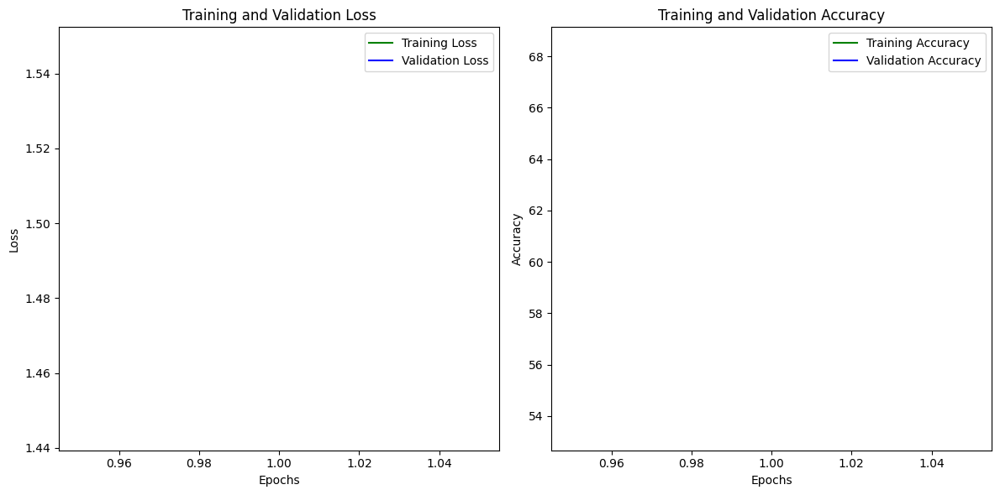


Epoch 2/500
-------------------------------
Epoch: 1, Learning Rate: 0.005000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 1.387188, correct predictions: 8, total: 16
Batch 70/317 processed, running loss: 100.642495, correct predictions: 737, total: 1136
Batch 140/317 processed, running loss: 196.706024, correct predictions: 1432, total: 2256
Batch 210/317 processed, running loss: 289.284251, correct predictions: 2113, total: 3376
Batch 280/317 processed, running loss: 379.950429, correct predictions: 2825, total: 4496

Training Loss per batch = 1.344968	Accuracy on Training set = 61.339392% [3105/5062]

Validation Loss per batch = 1.212469	Accuracy on Validation set = 44.582593% [251/563]
Train Loss: 1.3450, Train Accuracy: 61.3394
Valid Loss: 1.2125, Valid Accuracy: 44.5826


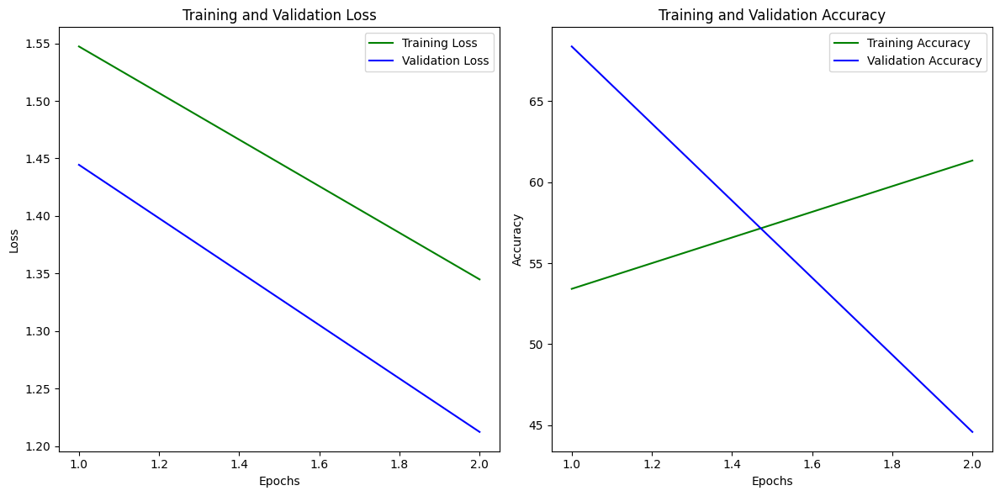


Epoch 3/500
-------------------------------
Epoch: 2, Learning Rate: 0.005000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 1.123457, correct predictions: 5, total: 16
Batch 70/317 processed, running loss: 81.398657, correct predictions: 740, total: 1136
Batch 140/317 processed, running loss: 163.360196, correct predictions: 1328, total: 2256
Batch 210/317 processed, running loss: 248.625707, correct predictions: 2006, total: 3376
Batch 280/317 processed, running loss: 332.163007, correct predictions: 2683, total: 4496

Training Loss per batch = 1.175846	Accuracy on Training set = 58.356381% [2954/5062]

Validation Loss per batch = 1.162449	Accuracy on Validation set = 71.047957% [400/563]
Train Loss: 1.1758, Train Accuracy: 58.3564
Valid Loss: 1.1624, Valid Accuracy: 71.0480


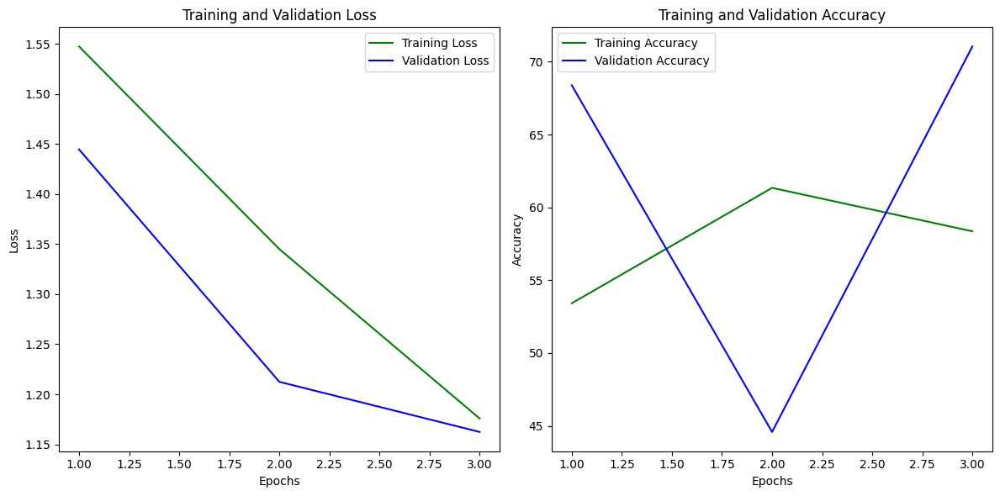


Epoch 4/500
-------------------------------
Epoch: 3, Learning Rate: 0.005000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 1.234680, correct predictions: 10, total: 16
Batch 70/317 processed, running loss: 78.144345, correct predictions: 721, total: 1136
Batch 140/317 processed, running loss: 158.345187, correct predictions: 1365, total: 2256
Batch 210/317 processed, running loss: 234.662581, correct predictions: 2042, total: 3376
Batch 280/317 processed, running loss: 309.391245, correct predictions: 2730, total: 4496

Training Loss per batch = 1.087737	Accuracy on Training set = 61.023311% [3089/5062]

Validation Loss per batch = 1.101487	Accuracy on Validation set = 75.666075% [426/563]
Train Loss: 1.0877, Train Accuracy: 61.0233
Valid Loss: 1.1015, Valid Accuracy: 75.6661


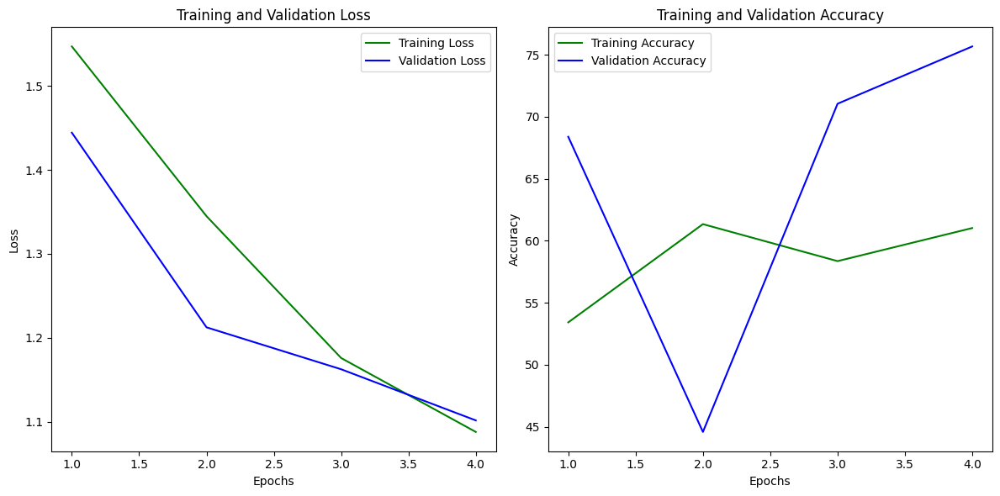


Epoch 5/500
-------------------------------
Epoch: 4, Learning Rate: 0.005000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 1.126843, correct predictions: 12, total: 16
Batch 70/317 processed, running loss: 67.008861, correct predictions: 781, total: 1136
Batch 140/317 processed, running loss: 135.367318, correct predictions: 1471, total: 2256
Batch 210/317 processed, running loss: 209.174965, correct predictions: 2158, total: 3376
Batch 280/317 processed, running loss: 281.222248, correct predictions: 2928, total: 4496

Training Loss per batch = 0.997365	Accuracy on Training set = 64.500198% [3265/5062]

Validation Loss per batch = 1.124517	Accuracy on Validation set = 60.390764% [340/563]
Train Loss: 0.9974, Train Accuracy: 64.5002
Valid Loss: 1.1245, Valid Accuracy: 60.3908


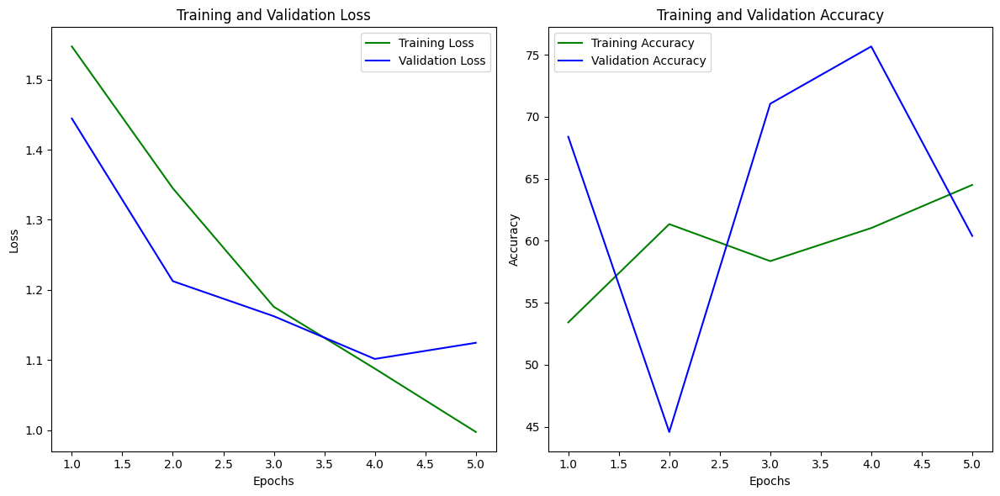


Epoch 6/500
-------------------------------
Epoch: 5, Learning Rate: 0.005000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.724150, correct predictions: 9, total: 16
Batch 70/317 processed, running loss: 67.520263, correct predictions: 677, total: 1136
Batch 140/317 processed, running loss: 130.404074, correct predictions: 1461, total: 2256
Batch 210/317 processed, running loss: 192.255798, correct predictions: 2219, total: 3376
Batch 280/317 processed, running loss: 255.373036, correct predictions: 2938, total: 4496

Training Loss per batch = 0.916826	Accuracy on Training set = 65.507704% [3316/5062]

Validation Loss per batch = 1.207898	Accuracy on Validation set = 72.824156% [410/563]
Train Loss: 0.9168, Train Accuracy: 65.5077
Valid Loss: 1.2079, Valid Accuracy: 72.8242


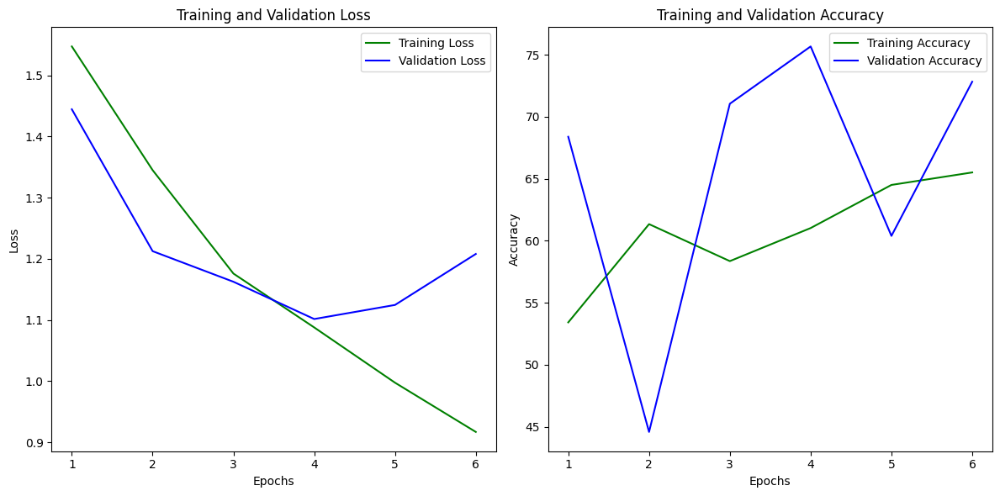


Epoch 7/500
-------------------------------
Epoch: 6, Learning Rate: 0.005000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.884710, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 57.394441, correct predictions: 765, total: 1136
Batch 140/317 processed, running loss: 115.939484, correct predictions: 1518, total: 2256
Batch 210/317 processed, running loss: 175.868747, correct predictions: 2275, total: 3376
Batch 280/317 processed, running loss: 232.845134, correct predictions: 3032, total: 4496

Training Loss per batch = 0.835318	Accuracy on Training set = 68.214145% [3453/5062]

Validation Loss per batch = 1.113225	Accuracy on Validation set = 70.692718% [398/563]
Train Loss: 0.8353, Train Accuracy: 68.2141
Valid Loss: 1.1132, Valid Accuracy: 70.6927


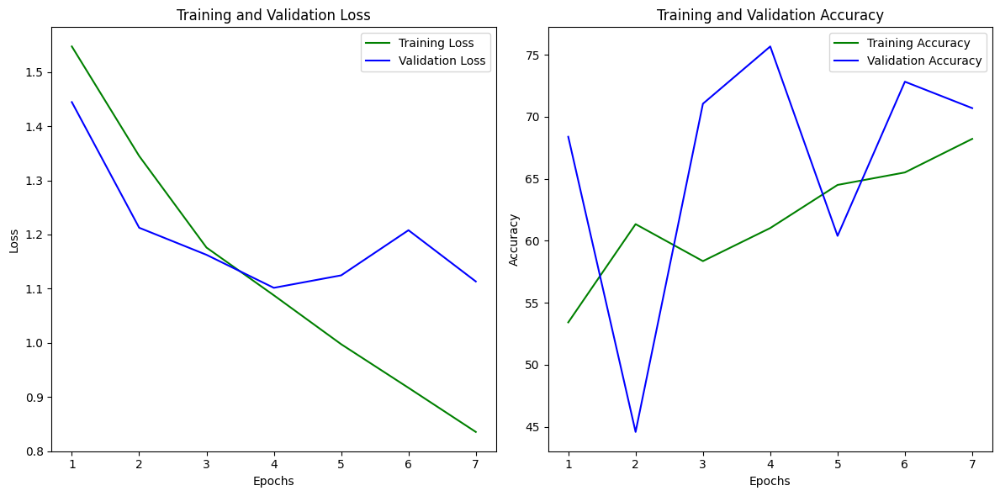


Epoch 8/500
-------------------------------
Epoch: 7, Learning Rate: 0.005000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.341581, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 51.144391, correct predictions: 814, total: 1136
Batch 140/317 processed, running loss: 102.485597, correct predictions: 1645, total: 2256
Batch 210/317 processed, running loss: 150.283166, correct predictions: 2386, total: 3376
Batch 280/317 processed, running loss: 204.801694, correct predictions: 3085, total: 4496

Training Loss per batch = 0.731384	Accuracy on Training set = 68.629000% [3474/5062]

Validation Loss per batch = 1.155136	Accuracy on Validation set = 73.001776% [411/563]
Train Loss: 0.7314, Train Accuracy: 68.6290
Valid Loss: 1.1551, Valid Accuracy: 73.0018


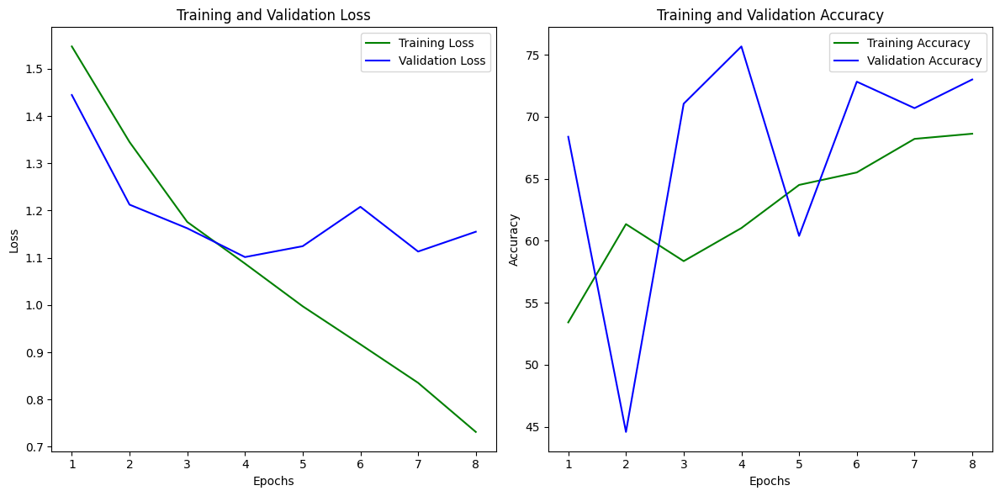


Epoch 9/500
-------------------------------
Epoch: 8, Learning Rate: 0.000500 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.426179, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 49.025777, correct predictions: 905, total: 1136
Batch 140/317 processed, running loss: 96.586746, correct predictions: 1745, total: 2256
Batch 210/317 processed, running loss: 136.334863, correct predictions: 2572, total: 3376
Batch 280/317 processed, running loss: 175.264103, correct predictions: 3419, total: 4496

Training Loss per batch = 0.617843	Accuracy on Training set = 76.254445% [3860/5062]

Validation Loss per batch = 1.068180	Accuracy on Validation set = 65.186501% [367/563]
Train Loss: 0.6178, Train Accuracy: 76.2544
Valid Loss: 1.0682, Valid Accuracy: 65.1865


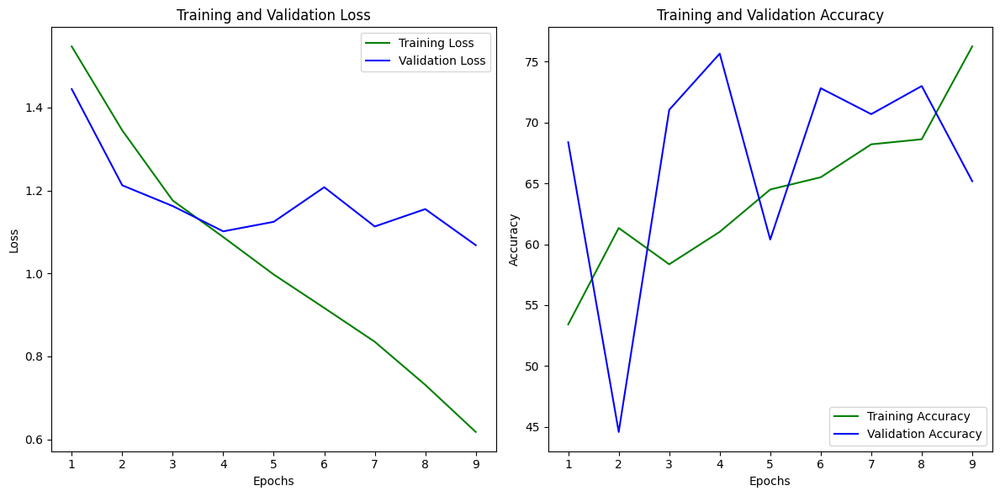


Epoch 10/500
-------------------------------
Epoch: 9, Learning Rate: 0.000500 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.501962, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 40.081352, correct predictions: 884, total: 1136
Batch 140/317 processed, running loss: 79.479791, correct predictions: 1747, total: 2256
Batch 210/317 processed, running loss: 118.956433, correct predictions: 2612, total: 3376
Batch 280/317 processed, running loss: 158.321158, correct predictions: 3462, total: 4496

Training Loss per batch = 0.558310	Accuracy on Training set = 77.419992% [3919/5062]

Validation Loss per batch = 1.048480	Accuracy on Validation set = 64.831261% [365/563]
Train Loss: 0.5583, Train Accuracy: 77.4200
Valid Loss: 1.0485, Valid Accuracy: 64.8313


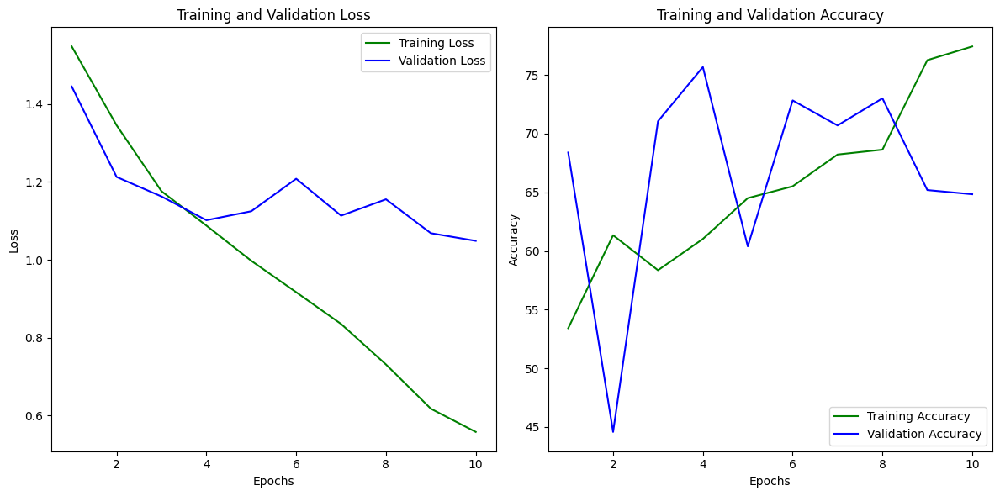


Epoch 11/500
-------------------------------
Epoch: 10, Learning Rate: 0.000500 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.444739, correct predictions: 12, total: 16
Batch 70/317 processed, running loss: 39.208081, correct predictions: 862, total: 1136
Batch 140/317 processed, running loss: 77.993275, correct predictions: 1748, total: 2256
Batch 210/317 processed, running loss: 116.060959, correct predictions: 2621, total: 3376
Batch 280/317 processed, running loss: 150.955018, correct predictions: 3490, total: 4496

Training Loss per batch = 0.537551	Accuracy on Training set = 77.854603% [3941/5062]

Validation Loss per batch = 1.086479	Accuracy on Validation set = 70.159858% [395/563]
Train Loss: 0.5376, Train Accuracy: 77.8546
Valid Loss: 1.0865, Valid Accuracy: 70.1599


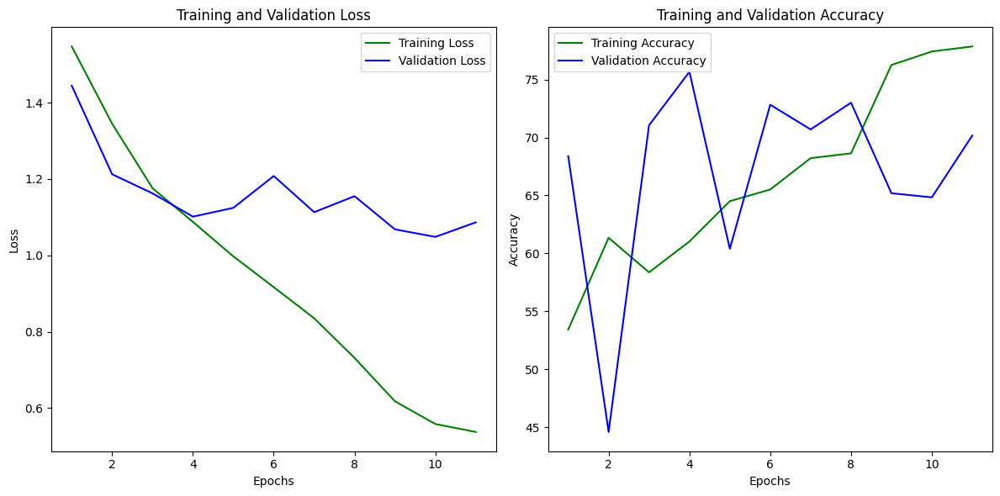


Epoch 12/500
-------------------------------
Epoch: 11, Learning Rate: 0.000500 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.234587, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 37.728848, correct predictions: 892, total: 1136
Batch 140/317 processed, running loss: 73.165323, correct predictions: 1782, total: 2256
Batch 210/317 processed, running loss: 109.422309, correct predictions: 2649, total: 3376
Batch 280/317 processed, running loss: 144.807538, correct predictions: 3541, total: 4496

Training Loss per batch = 0.507211	Accuracy on Training set = 78.783090% [3988/5062]

Validation Loss per batch = 1.041097	Accuracy on Validation set = 68.383659% [385/563]
Train Loss: 0.5072, Train Accuracy: 78.7831
Valid Loss: 1.0411, Valid Accuracy: 68.3837


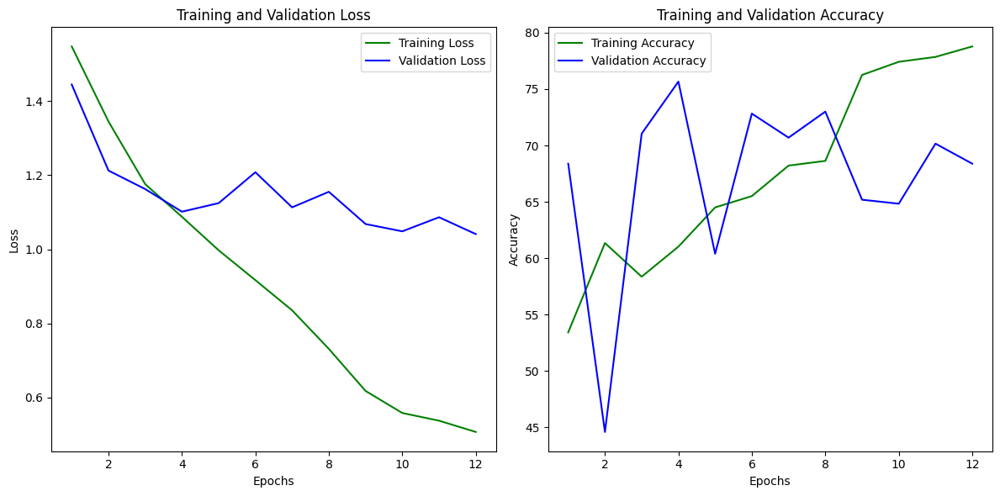


Epoch 13/500
-------------------------------
Epoch: 12, Learning Rate: 0.000500 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.292716, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 35.410708, correct predictions: 903, total: 1136
Batch 140/317 processed, running loss: 70.913915, correct predictions: 1776, total: 2256
Batch 210/317 processed, running loss: 104.333992, correct predictions: 2633, total: 3376
Batch 280/317 processed, running loss: 138.596333, correct predictions: 3527, total: 4496

Training Loss per batch = 0.495454	Accuracy on Training set = 78.486764% [3973/5062]

Validation Loss per batch = 1.050948	Accuracy on Validation set = 68.028419% [383/563]
Train Loss: 0.4955, Train Accuracy: 78.4868
Valid Loss: 1.0509, Valid Accuracy: 68.0284


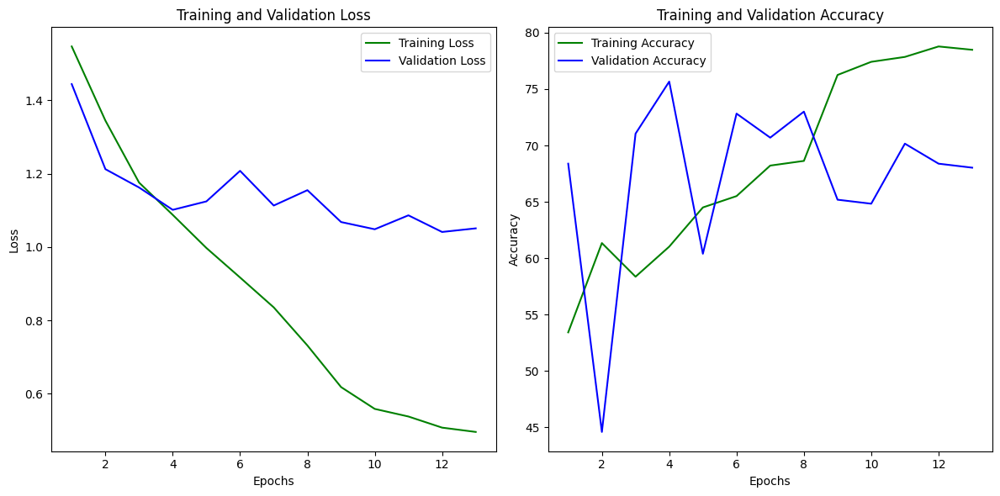


Epoch 14/500
-------------------------------
Epoch: 13, Learning Rate: 0.000500 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.612800, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 34.798600, correct predictions: 922, total: 1136
Batch 140/317 processed, running loss: 66.155021, correct predictions: 1823, total: 2256
Batch 210/317 processed, running loss: 99.359081, correct predictions: 2718, total: 3376
Batch 280/317 processed, running loss: 136.318946, correct predictions: 3589, total: 4496

Training Loss per batch = 0.485761	Accuracy on Training set = 79.948637% [4047/5062]

Validation Loss per batch = 1.086135	Accuracy on Validation set = 65.719361% [370/563]
Train Loss: 0.4858, Train Accuracy: 79.9486
Valid Loss: 1.0861, Valid Accuracy: 65.7194


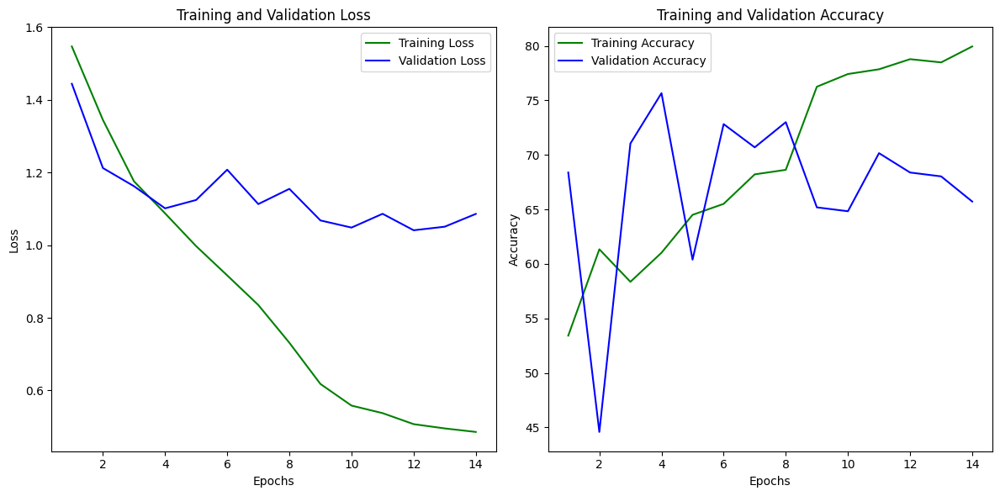


Epoch 15/500
-------------------------------
Epoch: 14, Learning Rate: 0.000500 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.239524, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 35.208493, correct predictions: 917, total: 1136
Batch 140/317 processed, running loss: 67.774168, correct predictions: 1813, total: 2256
Batch 210/317 processed, running loss: 100.269232, correct predictions: 2713, total: 3376
Batch 280/317 processed, running loss: 131.409624, correct predictions: 3628, total: 4496

Training Loss per batch = 0.464308	Accuracy on Training set = 80.798104% [4090/5062]

Validation Loss per batch = 1.086992	Accuracy on Validation set = 67.495560% [380/563]
Train Loss: 0.4643, Train Accuracy: 80.7981
Valid Loss: 1.0870, Valid Accuracy: 67.4956


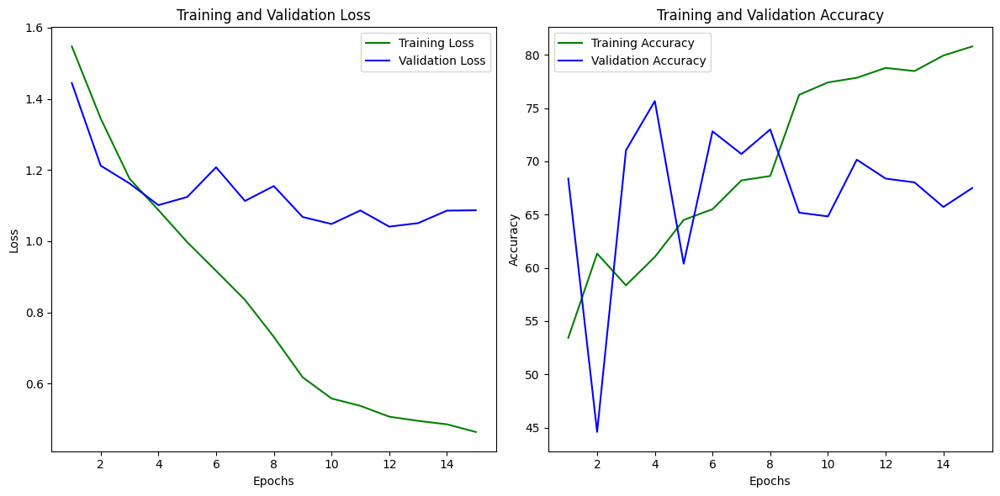


Epoch 16/500
-------------------------------
Epoch: 15, Learning Rate: 0.000500 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.425505, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 32.713137, correct predictions: 920, total: 1136
Batch 140/317 processed, running loss: 63.069778, correct predictions: 1827, total: 2256
Batch 210/317 processed, running loss: 94.047714, correct predictions: 2703, total: 3376
Batch 280/317 processed, running loss: 125.213262, correct predictions: 3591, total: 4496

Training Loss per batch = 0.442803	Accuracy on Training set = 80.185697% [4059/5062]

Validation Loss per batch = 1.100067	Accuracy on Validation set = 68.383659% [385/563]
Train Loss: 0.4428, Train Accuracy: 80.1857
Valid Loss: 1.1001, Valid Accuracy: 68.3837


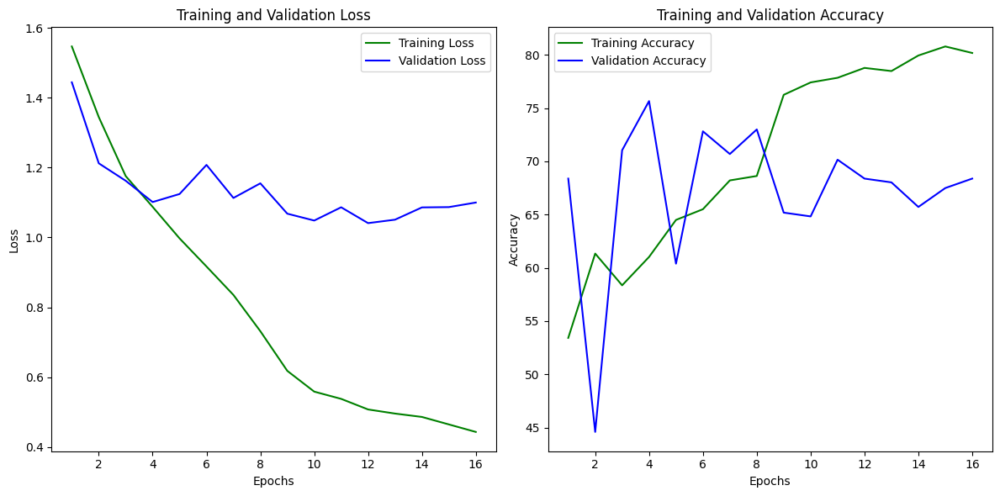


Epoch 17/500
-------------------------------
Epoch: 16, Learning Rate: 0.000050 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.722300, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 31.579886, correct predictions: 948, total: 1136
Batch 140/317 processed, running loss: 63.160918, correct predictions: 1877, total: 2256
Batch 210/317 processed, running loss: 95.006070, correct predictions: 2780, total: 3376
Batch 280/317 processed, running loss: 125.323699, correct predictions: 3685, total: 4496

Training Loss per batch = 0.443800	Accuracy on Training set = 82.082181% [4155/5062]

Validation Loss per batch = 1.097631	Accuracy on Validation set = 68.561279% [386/563]
Train Loss: 0.4438, Train Accuracy: 82.0822
Valid Loss: 1.0976, Valid Accuracy: 68.5613


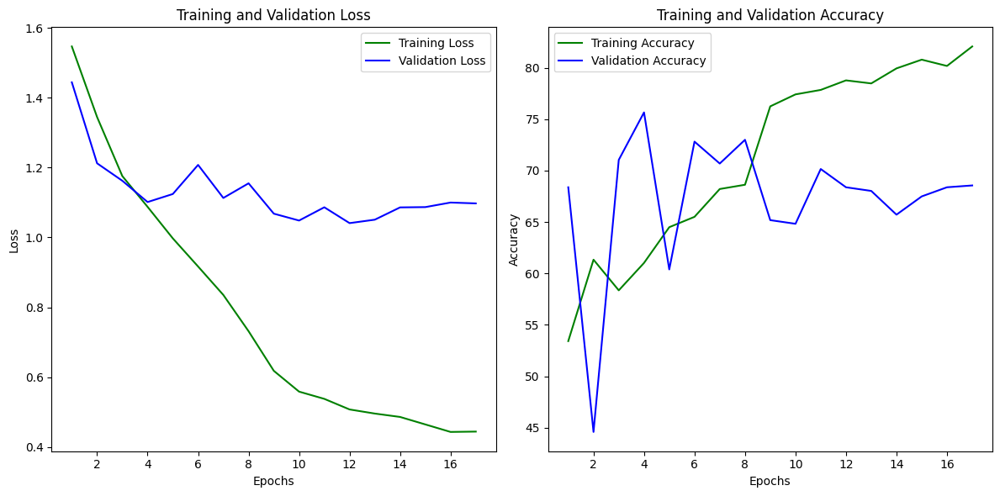


Epoch 18/500
-------------------------------
Epoch: 17, Learning Rate: 0.000050 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.740000, correct predictions: 10, total: 16
Batch 70/317 processed, running loss: 30.945271, correct predictions: 936, total: 1136
Batch 140/317 processed, running loss: 61.144057, correct predictions: 1871, total: 2256
Batch 210/317 processed, running loss: 90.229524, correct predictions: 2803, total: 3376
Batch 280/317 processed, running loss: 123.011382, correct predictions: 3700, total: 4496

Training Loss per batch = 0.434771	Accuracy on Training set = 82.516792% [4177/5062]

Validation Loss per batch = 1.074850	Accuracy on Validation set = 67.850799% [382/563]
Train Loss: 0.4348, Train Accuracy: 82.5168
Valid Loss: 1.0749, Valid Accuracy: 67.8508


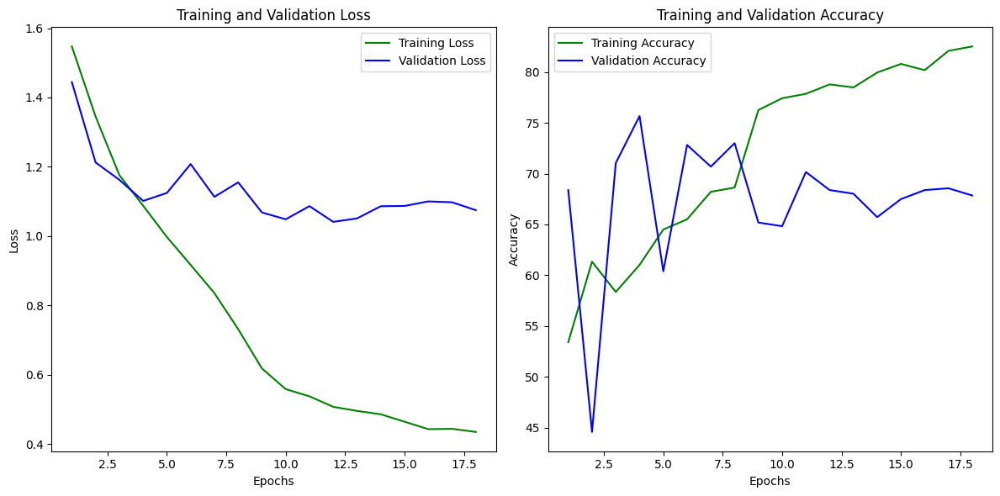


Epoch 19/500
-------------------------------
Epoch: 18, Learning Rate: 0.000050 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.198792, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 27.576538, correct predictions: 937, total: 1136
Batch 140/317 processed, running loss: 56.939252, correct predictions: 1859, total: 2256
Batch 210/317 processed, running loss: 89.153998, correct predictions: 2770, total: 3376
Batch 280/317 processed, running loss: 122.611513, correct predictions: 3702, total: 4496

Training Loss per batch = 0.436583	Accuracy on Training set = 82.358751% [4169/5062]

Validation Loss per batch = 1.108892	Accuracy on Validation set = 68.028419% [383/563]
Train Loss: 0.4366, Train Accuracy: 82.3588
Valid Loss: 1.1089, Valid Accuracy: 68.0284


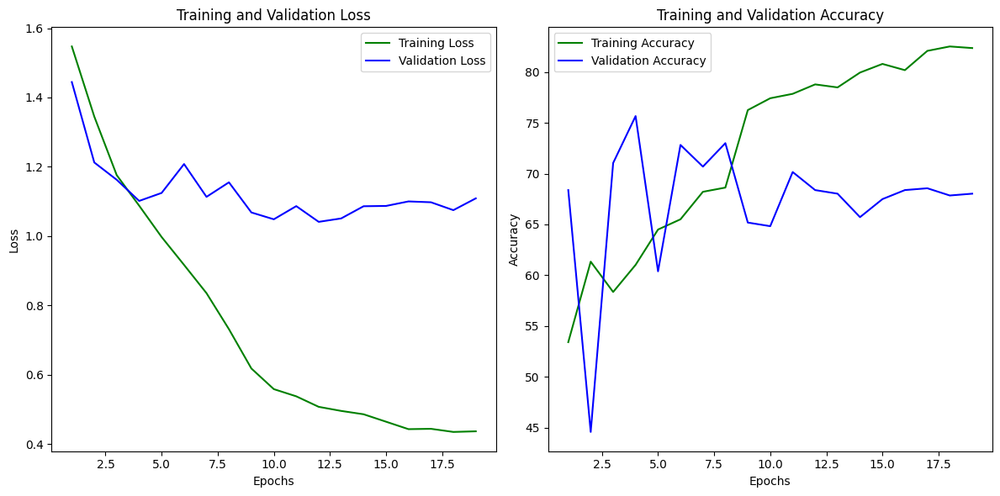


Epoch 20/500
-------------------------------
Epoch: 19, Learning Rate: 0.000050 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.363995, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 32.049403, correct predictions: 905, total: 1136
Batch 140/317 processed, running loss: 60.746204, correct predictions: 1821, total: 2256
Batch 210/317 processed, running loss: 91.039427, correct predictions: 2746, total: 3376
Batch 280/317 processed, running loss: 120.769229, correct predictions: 3662, total: 4496

Training Loss per batch = 0.428117	Accuracy on Training set = 81.548795% [4128/5062]

Validation Loss per batch = 1.078815	Accuracy on Validation set = 65.008881% [366/563]
Train Loss: 0.4281, Train Accuracy: 81.5488
Valid Loss: 1.0788, Valid Accuracy: 65.0089


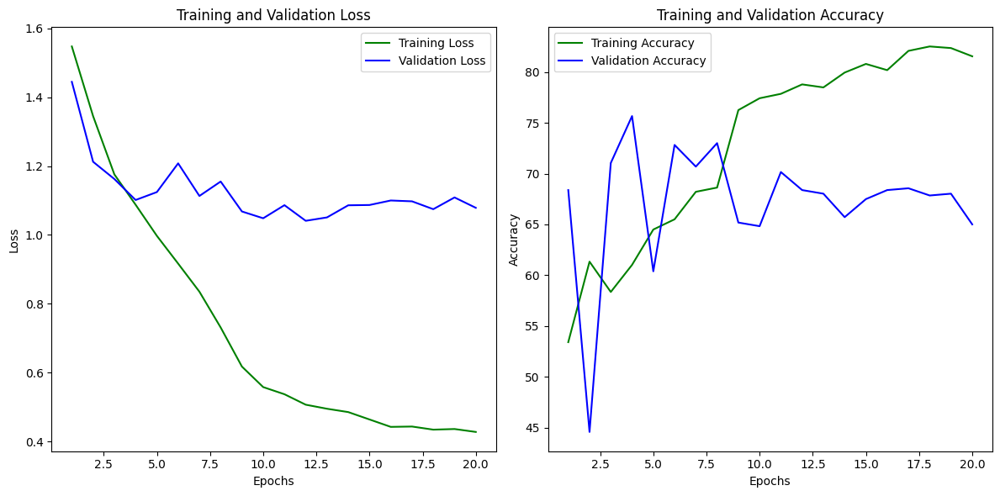


Epoch 21/500
-------------------------------
Epoch: 20, Learning Rate: 0.000005 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.483283, correct predictions: 12, total: 16
Batch 70/317 processed, running loss: 28.233188, correct predictions: 929, total: 1136
Batch 140/317 processed, running loss: 56.790433, correct predictions: 1860, total: 2256
Batch 210/317 processed, running loss: 91.254459, correct predictions: 2778, total: 3376
Batch 280/317 processed, running loss: 119.673293, correct predictions: 3708, total: 4496

Training Loss per batch = 0.428204	Accuracy on Training set = 82.418017% [4172/5062]

Validation Loss per batch = 1.102715	Accuracy on Validation set = 66.785080% [376/563]
Train Loss: 0.4282, Train Accuracy: 82.4180
Valid Loss: 1.1027, Valid Accuracy: 66.7851


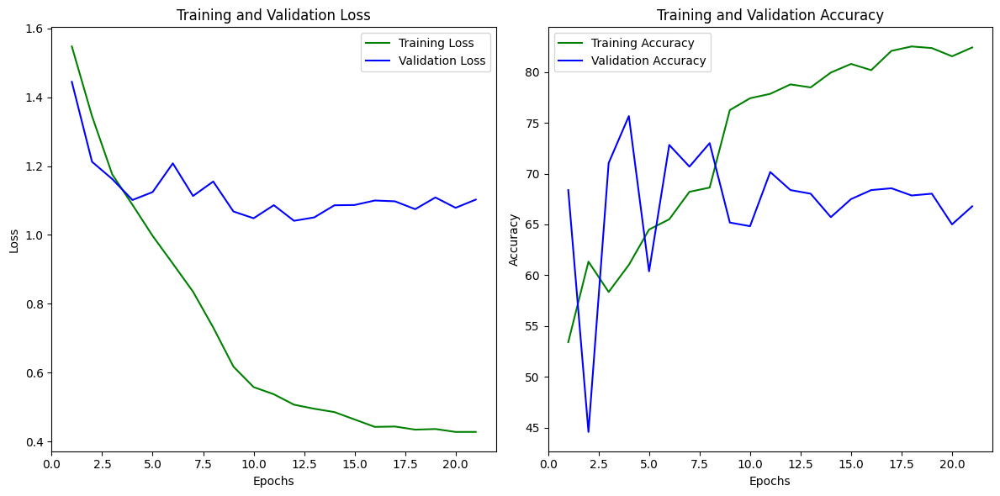


Epoch 22/500
-------------------------------
Epoch: 21, Learning Rate: 0.000005 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.516706, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 28.890742, correct predictions: 950, total: 1136
Batch 140/317 processed, running loss: 58.320151, correct predictions: 1879, total: 2256
Batch 210/317 processed, running loss: 87.604764, correct predictions: 2812, total: 3376
Batch 280/317 processed, running loss: 121.415602, correct predictions: 3703, total: 4496

Training Loss per batch = 0.431990	Accuracy on Training set = 82.358751% [4169/5062]

Validation Loss per batch = 1.086654	Accuracy on Validation set = 67.850799% [382/563]
Train Loss: 0.4320, Train Accuracy: 82.3588
Valid Loss: 1.0867, Valid Accuracy: 67.8508


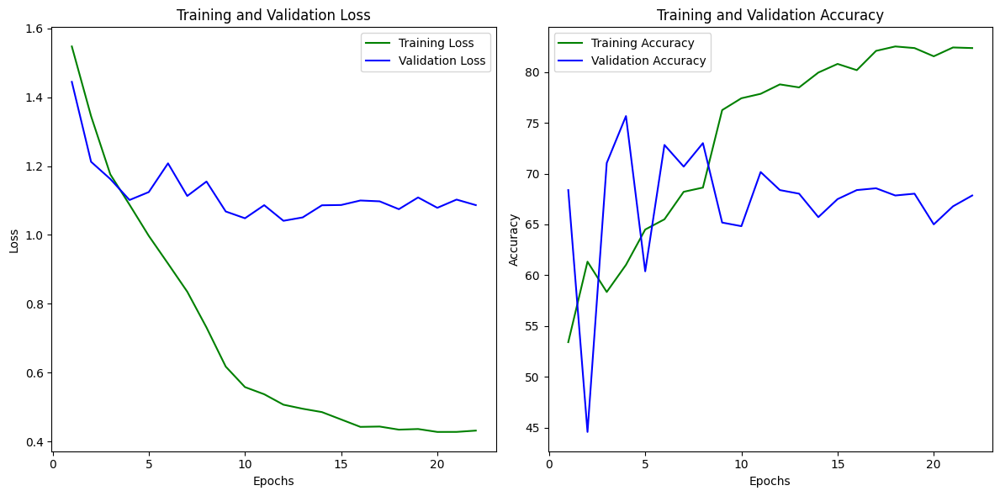


Epoch 23/500
-------------------------------
Epoch: 22, Learning Rate: 0.000005 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.225059, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 28.894031, correct predictions: 940, total: 1136
Batch 140/317 processed, running loss: 59.376698, correct predictions: 1855, total: 2256
Batch 210/317 processed, running loss: 91.217692, correct predictions: 2769, total: 3376
Batch 280/317 processed, running loss: 120.212812, correct predictions: 3687, total: 4496

Training Loss per batch = 0.430206	Accuracy on Training set = 81.864876% [4144/5062]

Validation Loss per batch = 1.073373	Accuracy on Validation set = 68.028419% [383/563]
Train Loss: 0.4302, Train Accuracy: 81.8649
Valid Loss: 1.0734, Valid Accuracy: 68.0284


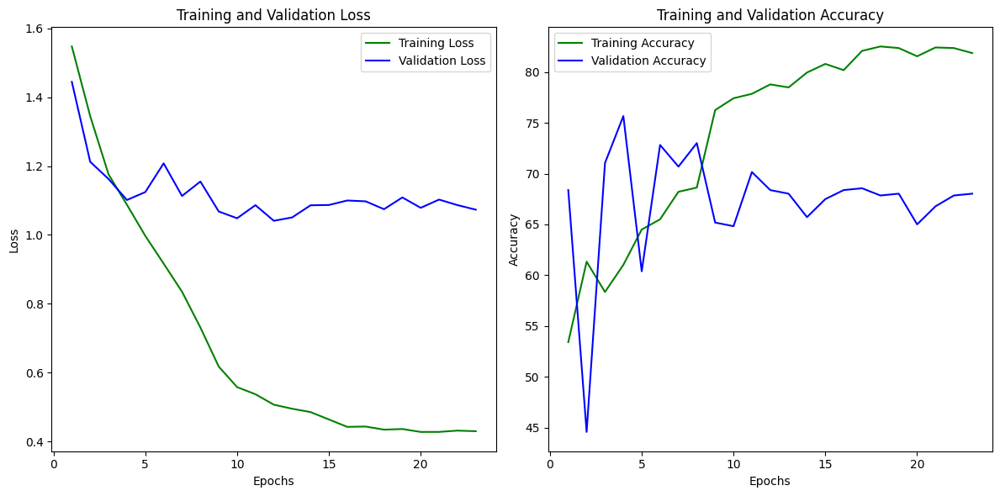


Epoch 24/500
-------------------------------
Epoch: 23, Learning Rate: 0.000005 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.655116, correct predictions: 12, total: 16
Batch 70/317 processed, running loss: 30.419314, correct predictions: 913, total: 1136
Batch 140/317 processed, running loss: 59.562753, correct predictions: 1857, total: 2256
Batch 210/317 processed, running loss: 88.730755, correct predictions: 2770, total: 3376
Batch 280/317 processed, running loss: 117.674237, correct predictions: 3699, total: 4496

Training Loss per batch = 0.417598	Accuracy on Training set = 82.457527% [4174/5062]

Validation Loss per batch = 1.099771	Accuracy on Validation set = 66.429840% [374/563]
Train Loss: 0.4176, Train Accuracy: 82.4575
Valid Loss: 1.0998, Valid Accuracy: 66.4298


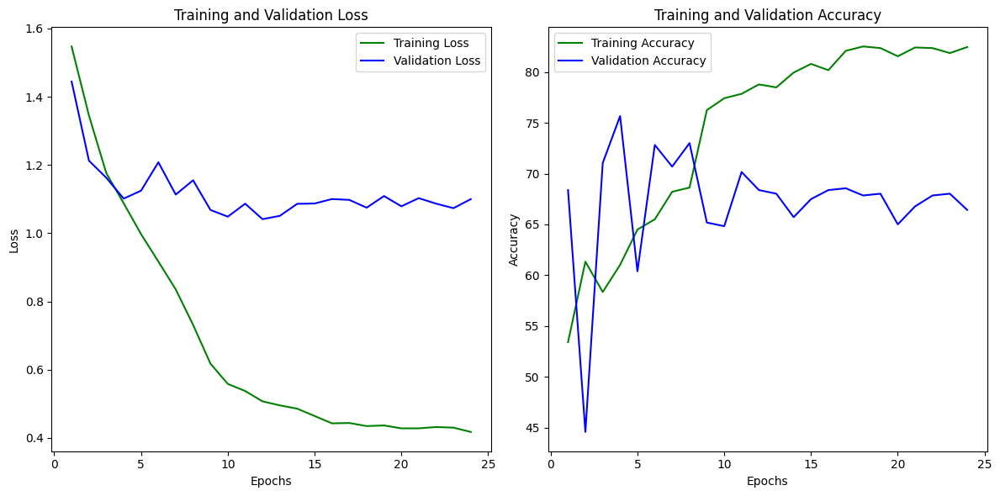


Epoch 25/500
-------------------------------
Epoch: 24, Learning Rate: 0.000001 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.519706, correct predictions: 12, total: 16
Batch 70/317 processed, running loss: 30.740324, correct predictions: 919, total: 1136
Batch 140/317 processed, running loss: 56.968440, correct predictions: 1848, total: 2256
Batch 210/317 processed, running loss: 85.477145, correct predictions: 2772, total: 3376
Batch 280/317 processed, running loss: 117.097961, correct predictions: 3700, total: 4496

Training Loss per batch = 0.419304	Accuracy on Training set = 82.299486% [4166/5062]

Validation Loss per batch = 1.065284	Accuracy on Validation set = 67.140320% [378/563]
Train Loss: 0.4193, Train Accuracy: 82.2995
Valid Loss: 1.0653, Valid Accuracy: 67.1403


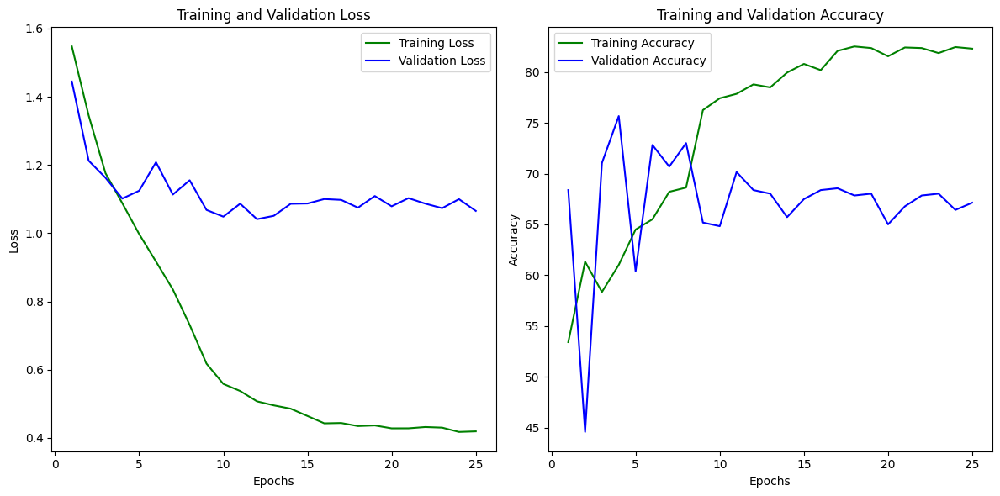


Epoch 26/500
-------------------------------
Epoch: 25, Learning Rate: 0.000001 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.208077, correct predictions: 16, total: 16
Batch 70/317 processed, running loss: 32.346499, correct predictions: 934, total: 1136
Batch 140/317 processed, running loss: 60.827348, correct predictions: 1837, total: 2256
Batch 210/317 processed, running loss: 88.153110, correct predictions: 2771, total: 3376
Batch 280/317 processed, running loss: 116.948209, correct predictions: 3694, total: 4496

Training Loss per batch = 0.417187	Accuracy on Training set = 82.101936% [4156/5062]

Validation Loss per batch = 1.068540	Accuracy on Validation set = 67.850799% [382/563]
Train Loss: 0.4172, Train Accuracy: 82.1019
Valid Loss: 1.0685, Valid Accuracy: 67.8508


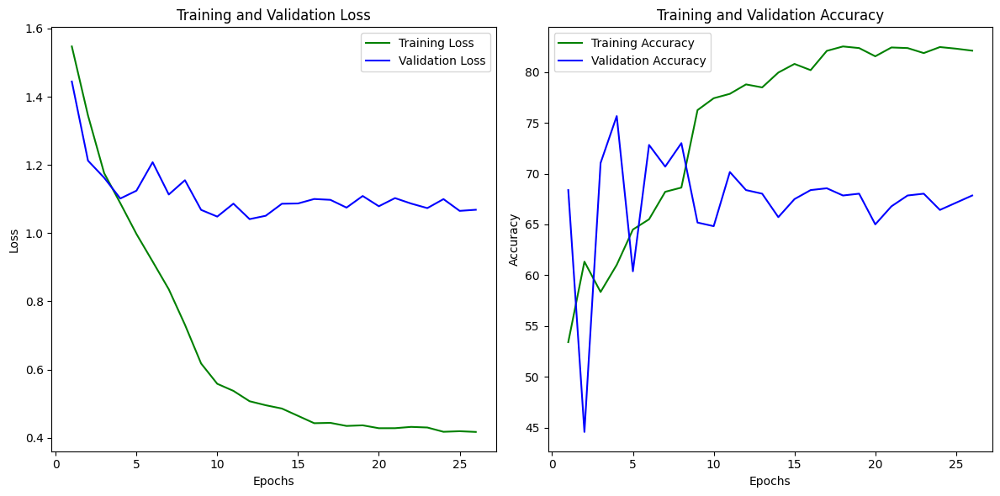


Epoch 27/500
-------------------------------
Epoch: 26, Learning Rate: 0.000001 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.302234, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 29.952439, correct predictions: 929, total: 1136
Batch 140/317 processed, running loss: 62.650350, correct predictions: 1837, total: 2256
Batch 210/317 processed, running loss: 91.431481, correct predictions: 2771, total: 3376
Batch 280/317 processed, running loss: 122.916216, correct predictions: 3683, total: 4496

Training Loss per batch = 0.428370	Accuracy on Training set = 82.022916% [4152/5062]

Validation Loss per batch = 1.095910	Accuracy on Validation set = 65.364121% [368/563]
Train Loss: 0.4284, Train Accuracy: 82.0229
Valid Loss: 1.0959, Valid Accuracy: 65.3641


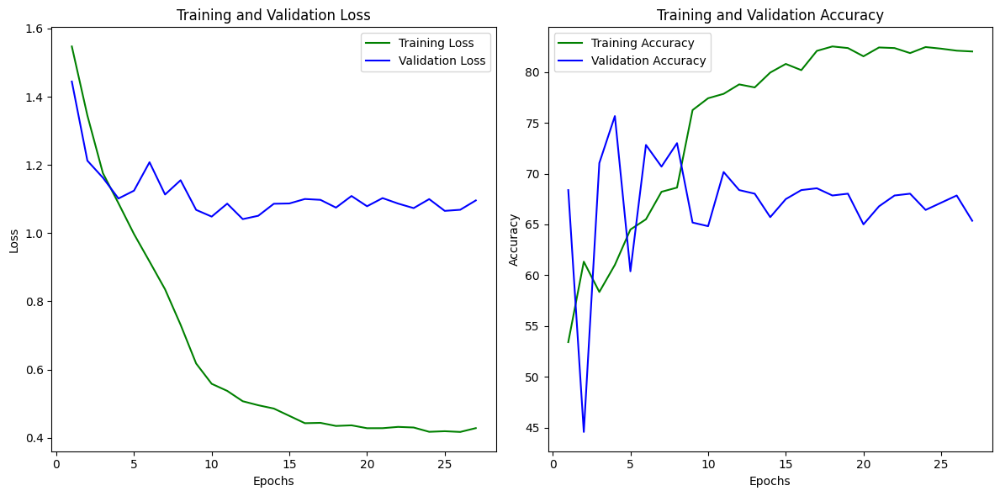


Epoch 28/500
-------------------------------
Epoch: 27, Learning Rate: 0.000001 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.454248, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 31.574618, correct predictions: 937, total: 1136
Batch 140/317 processed, running loss: 63.138557, correct predictions: 1835, total: 2256
Batch 210/317 processed, running loss: 95.594367, correct predictions: 2751, total: 3376
Batch 280/317 processed, running loss: 121.596661, correct predictions: 3708, total: 4496

Training Loss per batch = 0.435082	Accuracy on Training set = 82.220466% [4162/5062]

Validation Loss per batch = 1.061842	Accuracy on Validation set = 65.896980% [371/563]
Train Loss: 0.4351, Train Accuracy: 82.2205
Valid Loss: 1.0618, Valid Accuracy: 65.8970


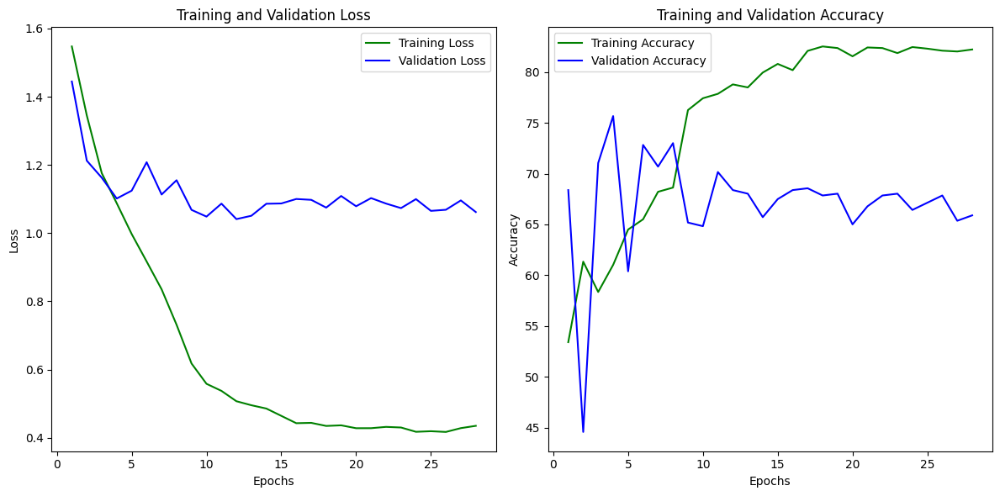


Epoch 29/500
-------------------------------
Epoch: 28, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.263864, correct predictions: 11, total: 16
Batch 70/317 processed, running loss: 29.764156, correct predictions: 941, total: 1136
Batch 140/317 processed, running loss: 61.879353, correct predictions: 1834, total: 2256
Batch 210/317 processed, running loss: 90.386315, correct predictions: 2748, total: 3376
Batch 280/317 processed, running loss: 120.534858, correct predictions: 3663, total: 4496

Training Loss per batch = 0.427767	Accuracy on Training set = 81.469775% [4124/5062]

Validation Loss per batch = 1.098296	Accuracy on Validation set = 67.673179% [381/563]
Train Loss: 0.4278, Train Accuracy: 81.4698
Valid Loss: 1.0983, Valid Accuracy: 67.6732


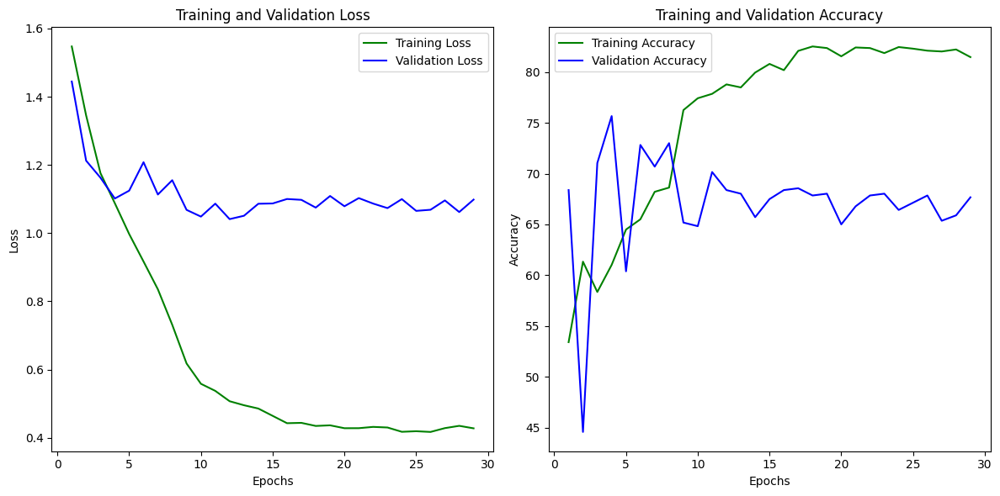


Epoch 30/500
-------------------------------
Epoch: 29, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.371415, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 31.055332, correct predictions: 919, total: 1136
Batch 140/317 processed, running loss: 59.436613, correct predictions: 1854, total: 2256
Batch 210/317 processed, running loss: 89.934987, correct predictions: 2767, total: 3376
Batch 280/317 processed, running loss: 119.966402, correct predictions: 3701, total: 4496

Training Loss per batch = 0.429189	Accuracy on Training set = 82.220466% [4162/5062]

Validation Loss per batch = 1.083232	Accuracy on Validation set = 64.120782% [361/563]
Train Loss: 0.4292, Train Accuracy: 82.2205
Valid Loss: 1.0832, Valid Accuracy: 64.1208


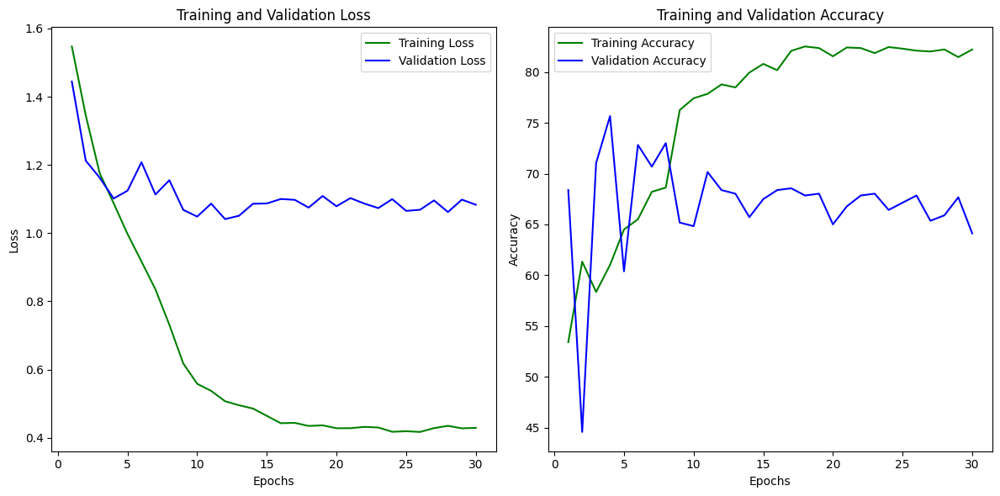


Epoch 31/500
-------------------------------
Epoch: 30, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.266856, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 29.203460, correct predictions: 930, total: 1136
Batch 140/317 processed, running loss: 60.092859, correct predictions: 1853, total: 2256
Batch 210/317 processed, running loss: 92.327219, correct predictions: 2758, total: 3376
Batch 280/317 processed, running loss: 124.584020, correct predictions: 3668, total: 4496

Training Loss per batch = 0.440874	Accuracy on Training set = 81.627815% [4132/5062]

Validation Loss per batch = 1.075160	Accuracy on Validation set = 66.962700% [377/563]
Train Loss: 0.4409, Train Accuracy: 81.6278
Valid Loss: 1.0752, Valid Accuracy: 66.9627


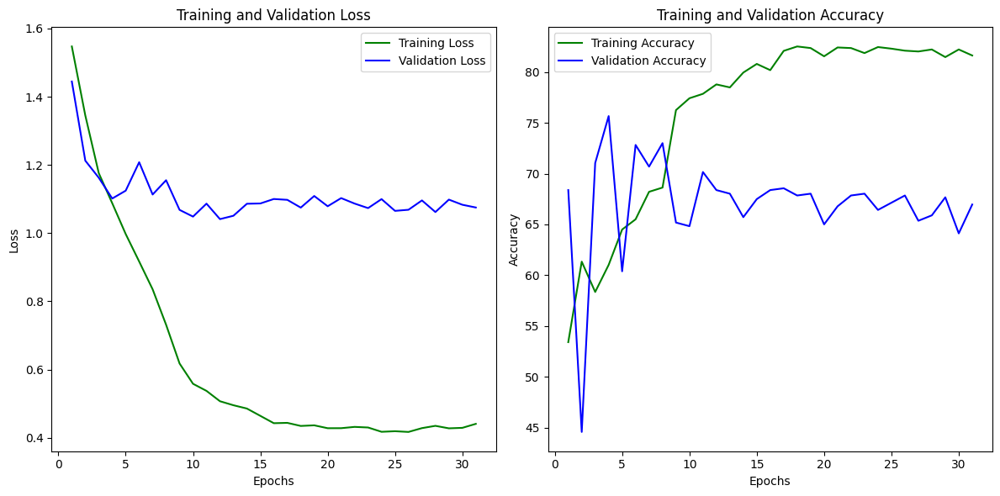


Epoch 32/500
-------------------------------
Epoch: 31, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.389241, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 29.518952, correct predictions: 930, total: 1136
Batch 140/317 processed, running loss: 60.389229, correct predictions: 1877, total: 2256
Batch 210/317 processed, running loss: 89.532475, correct predictions: 2785, total: 3376
Batch 280/317 processed, running loss: 121.577681, correct predictions: 3709, total: 4496

Training Loss per batch = 0.432576	Accuracy on Training set = 82.338996% [4168/5062]

Validation Loss per batch = 1.070694	Accuracy on Validation set = 67.495560% [380/563]
Train Loss: 0.4326, Train Accuracy: 82.3390
Valid Loss: 1.0707, Valid Accuracy: 67.4956


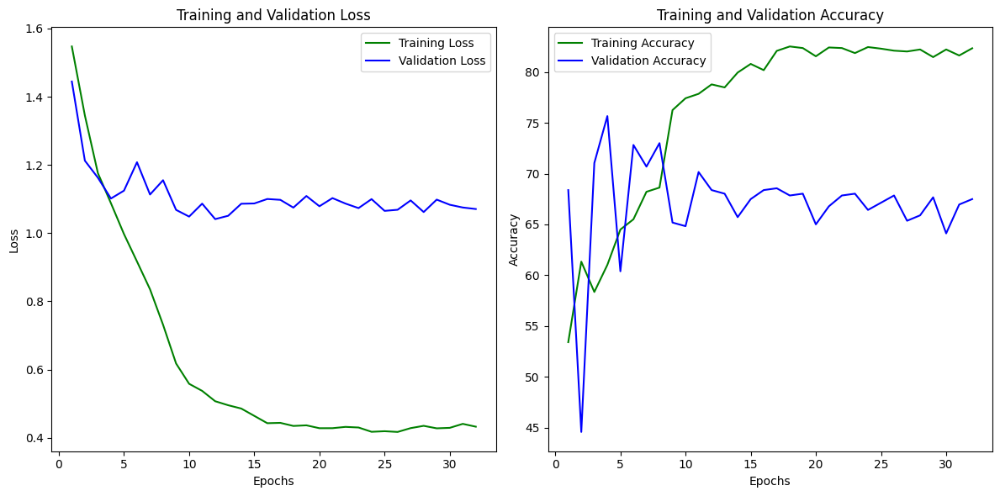


Epoch 33/500
-------------------------------
Epoch: 32, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.413892, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 30.846524, correct predictions: 937, total: 1136
Batch 140/317 processed, running loss: 61.405876, correct predictions: 1848, total: 2256
Batch 210/317 processed, running loss: 92.587636, correct predictions: 2771, total: 3376
Batch 280/317 processed, running loss: 123.316600, correct predictions: 3686, total: 4496

Training Loss per batch = 0.432238	Accuracy on Training set = 81.983406% [4150/5062]

Validation Loss per batch = 1.118892	Accuracy on Validation set = 68.383659% [385/563]
Train Loss: 0.4322, Train Accuracy: 81.9834
Valid Loss: 1.1189, Valid Accuracy: 68.3837


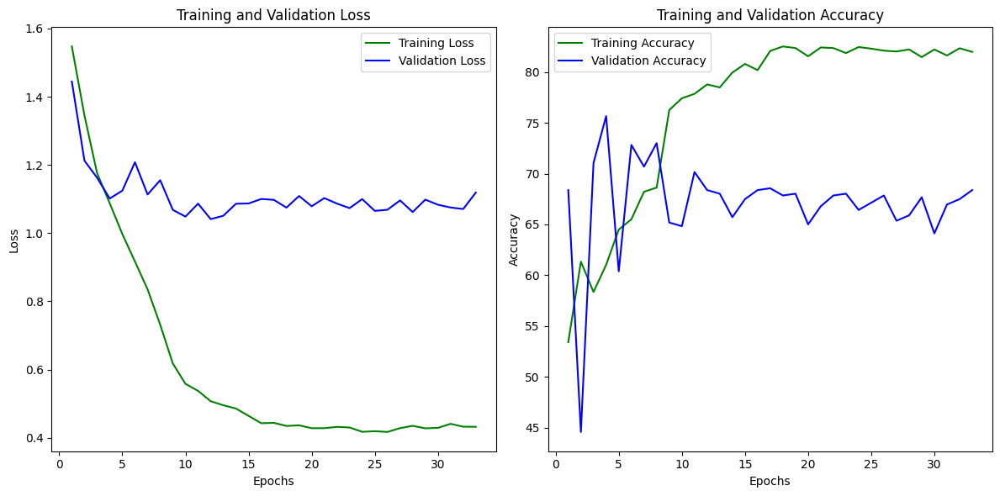


Epoch 34/500
-------------------------------
Epoch: 33, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.262105, correct predictions: 12, total: 16
Batch 70/317 processed, running loss: 31.525277, correct predictions: 924, total: 1136
Batch 140/317 processed, running loss: 65.002129, correct predictions: 1820, total: 2256
Batch 210/317 processed, running loss: 94.623438, correct predictions: 2731, total: 3376
Batch 280/317 processed, running loss: 124.474610, correct predictions: 3669, total: 4496

Training Loss per batch = 0.446617	Accuracy on Training set = 81.548795% [4128/5062]

Validation Loss per batch = 1.076167	Accuracy on Validation set = 68.028419% [383/563]
Train Loss: 0.4466, Train Accuracy: 81.5488
Valid Loss: 1.0762, Valid Accuracy: 68.0284


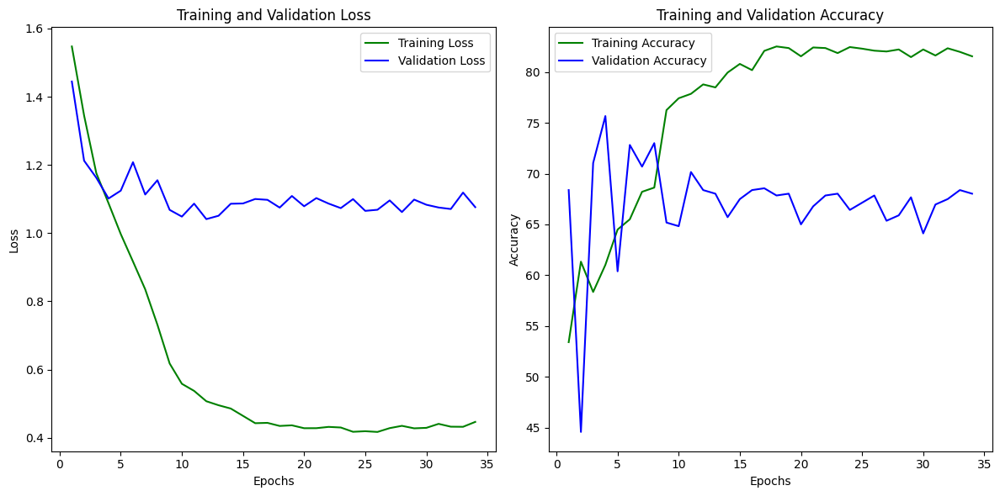


Epoch 35/500
-------------------------------
Epoch: 34, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.601424, correct predictions: 11, total: 16
Batch 70/317 processed, running loss: 32.091735, correct predictions: 929, total: 1136
Batch 140/317 processed, running loss: 60.007580, correct predictions: 1858, total: 2256
Batch 210/317 processed, running loss: 91.396027, correct predictions: 2769, total: 3376
Batch 280/317 processed, running loss: 124.152841, correct predictions: 3678, total: 4496

Training Loss per batch = 0.444964	Accuracy on Training set = 81.864876% [4144/5062]

Validation Loss per batch = 1.060896	Accuracy on Validation set = 68.561279% [386/563]
Train Loss: 0.4450, Train Accuracy: 81.8649
Valid Loss: 1.0609, Valid Accuracy: 68.5613


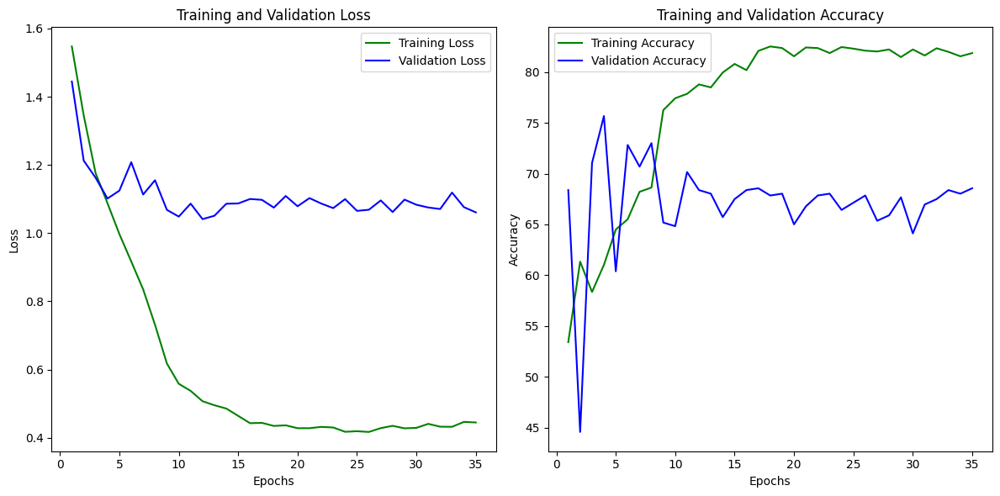


Epoch 36/500
-------------------------------
Epoch: 35, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.673590, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 31.826645, correct predictions: 936, total: 1136
Batch 140/317 processed, running loss: 59.722239, correct predictions: 1846, total: 2256
Batch 210/317 processed, running loss: 89.251741, correct predictions: 2774, total: 3376
Batch 280/317 processed, running loss: 119.319822, correct predictions: 3694, total: 4496

Training Loss per batch = 0.432817	Accuracy on Training set = 81.943896% [4148/5062]

Validation Loss per batch = 1.110922	Accuracy on Validation set = 66.074600% [372/563]
Train Loss: 0.4328, Train Accuracy: 81.9439
Valid Loss: 1.1109, Valid Accuracy: 66.0746


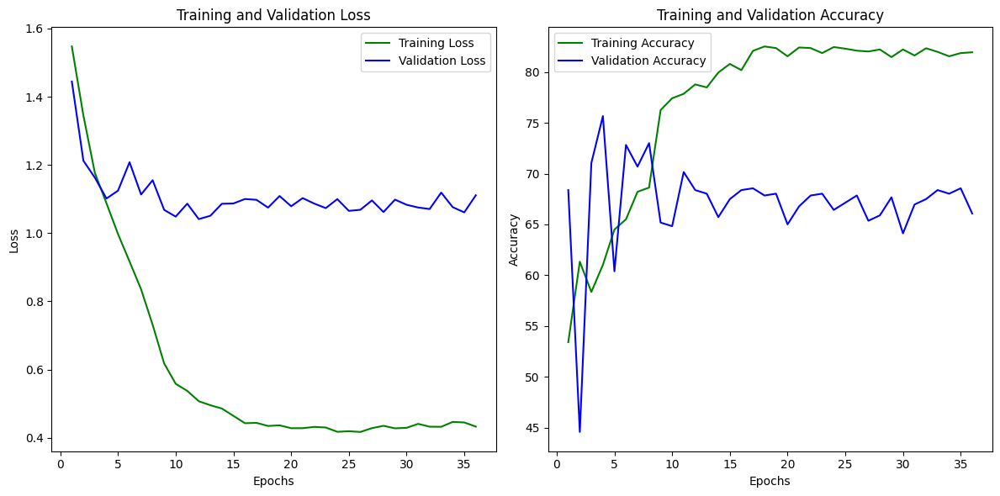


Epoch 37/500
-------------------------------
Epoch: 36, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.575876, correct predictions: 11, total: 16
Batch 70/317 processed, running loss: 32.539400, correct predictions: 922, total: 1136
Batch 140/317 processed, running loss: 63.903421, correct predictions: 1840, total: 2256
Batch 210/317 processed, running loss: 91.648394, correct predictions: 2760, total: 3376
Batch 280/317 processed, running loss: 123.126867, correct predictions: 3665, total: 4496

Training Loss per batch = 0.431034	Accuracy on Training set = 81.904386% [4146/5062]

Validation Loss per batch = 1.107989	Accuracy on Validation set = 67.673179% [381/563]
Train Loss: 0.4310, Train Accuracy: 81.9044
Valid Loss: 1.1080, Valid Accuracy: 67.6732


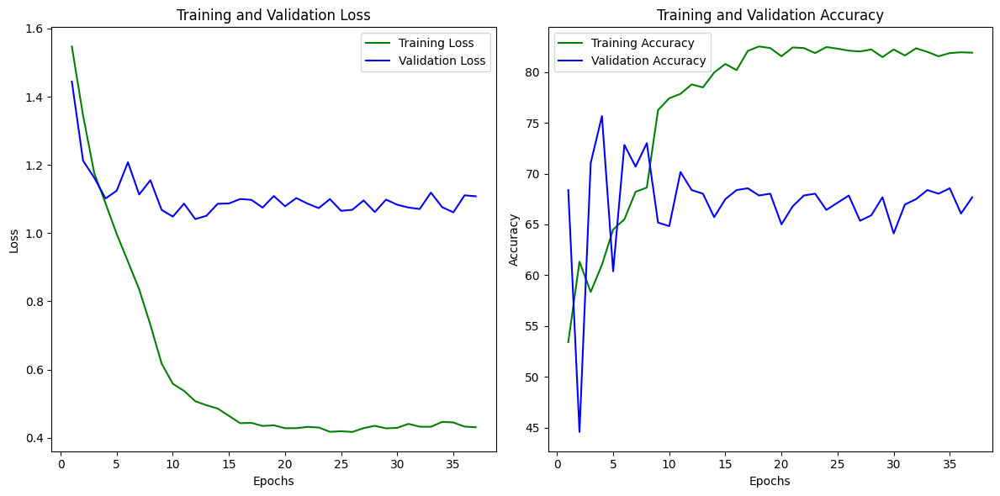


Epoch 38/500
-------------------------------
Epoch: 37, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.218898, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 32.003705, correct predictions: 946, total: 1136
Batch 140/317 processed, running loss: 62.822456, correct predictions: 1864, total: 2256
Batch 210/317 processed, running loss: 92.983955, correct predictions: 2783, total: 3376
Batch 280/317 processed, running loss: 125.102529, correct predictions: 3692, total: 4496

Training Loss per batch = 0.449685	Accuracy on Training set = 82.042671% [4153/5062]

Validation Loss per batch = 1.098404	Accuracy on Validation set = 66.429840% [374/563]
Train Loss: 0.4497, Train Accuracy: 82.0427
Valid Loss: 1.0984, Valid Accuracy: 66.4298


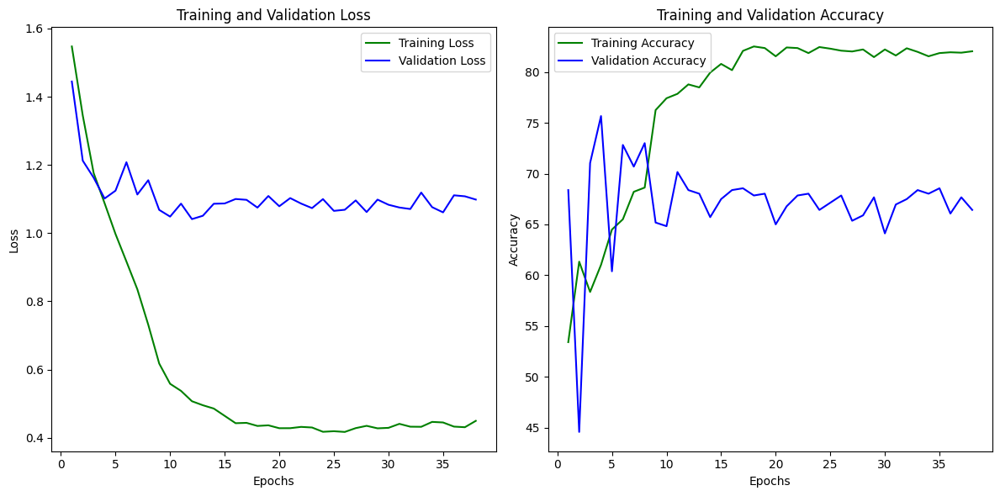


Epoch 39/500
-------------------------------
Epoch: 38, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.494865, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 29.440040, correct predictions: 932, total: 1136
Batch 140/317 processed, running loss: 62.879070, correct predictions: 1841, total: 2256
Batch 210/317 processed, running loss: 95.645110, correct predictions: 2756, total: 3376
Batch 280/317 processed, running loss: 123.788037, correct predictions: 3672, total: 4496

Training Loss per batch = 0.439129	Accuracy on Training set = 82.003161% [4151/5062]

Validation Loss per batch = 1.078289	Accuracy on Validation set = 66.962700% [377/563]
Train Loss: 0.4391, Train Accuracy: 82.0032
Valid Loss: 1.0783, Valid Accuracy: 66.9627


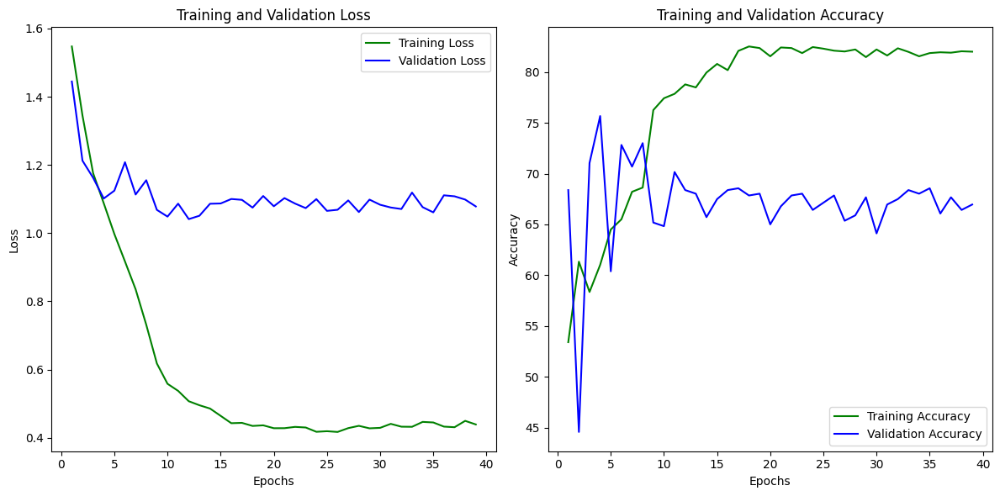


Epoch 40/500
-------------------------------
Epoch: 39, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.507380, correct predictions: 9, total: 16
Batch 70/317 processed, running loss: 31.711245, correct predictions: 908, total: 1136
Batch 140/317 processed, running loss: 60.047783, correct predictions: 1844, total: 2256
Batch 210/317 processed, running loss: 88.810481, correct predictions: 2750, total: 3376
Batch 280/317 processed, running loss: 121.157002, correct predictions: 3654, total: 4496

Training Loss per batch = 0.438051	Accuracy on Training set = 81.450020% [4123/5062]

Validation Loss per batch = 1.090077	Accuracy on Validation set = 66.962700% [377/563]
Train Loss: 0.4381, Train Accuracy: 81.4500
Valid Loss: 1.0901, Valid Accuracy: 66.9627


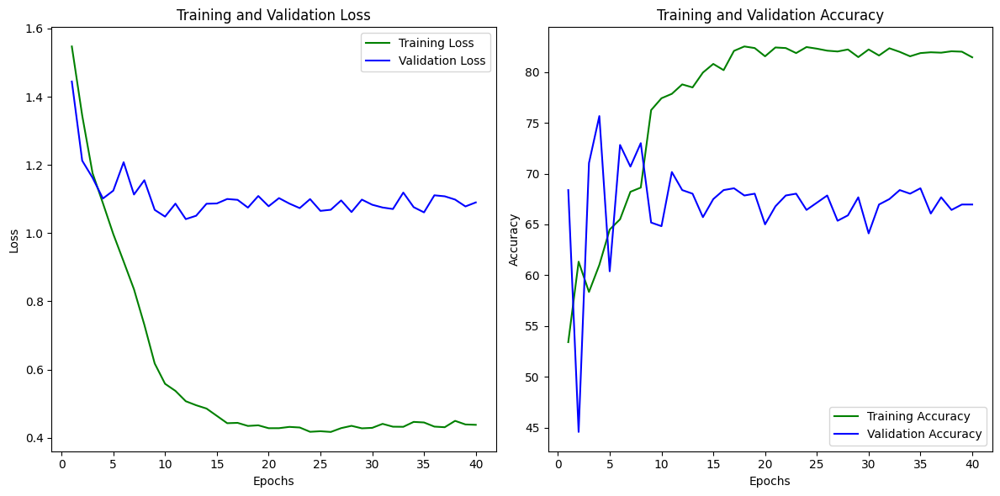


Epoch 41/500
-------------------------------
Epoch: 40, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.254814, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 30.685277, correct predictions: 955, total: 1136
Batch 140/317 processed, running loss: 62.886107, correct predictions: 1860, total: 2256
Batch 210/317 processed, running loss: 93.847661, correct predictions: 2766, total: 3376
Batch 280/317 processed, running loss: 124.404633, correct predictions: 3693, total: 4496

Training Loss per batch = 0.445282	Accuracy on Training set = 81.904386% [4146/5062]

Validation Loss per batch = 1.129560	Accuracy on Validation set = 69.094139% [389/563]
Train Loss: 0.4453, Train Accuracy: 81.9044
Valid Loss: 1.1296, Valid Accuracy: 69.0941


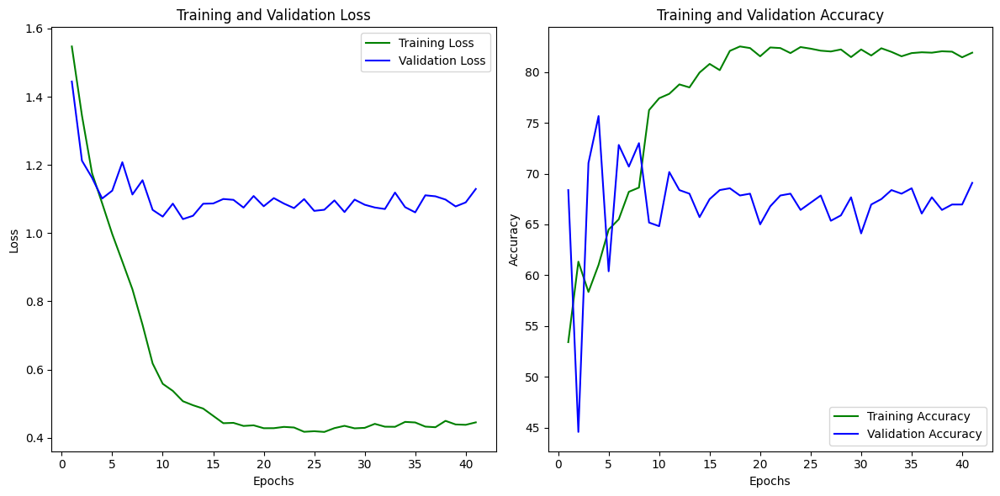


Epoch 42/500
-------------------------------
Epoch: 41, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.514697, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 29.820223, correct predictions: 925, total: 1136
Batch 140/317 processed, running loss: 58.337473, correct predictions: 1867, total: 2256
Batch 210/317 processed, running loss: 87.922851, correct predictions: 2781, total: 3376
Batch 280/317 processed, running loss: 116.309514, correct predictions: 3713, total: 4496

Training Loss per batch = 0.428024	Accuracy on Training set = 82.457527% [4174/5062]

Validation Loss per batch = 1.091444	Accuracy on Validation set = 66.429840% [374/563]
Train Loss: 0.4280, Train Accuracy: 82.4575
Valid Loss: 1.0914, Valid Accuracy: 66.4298


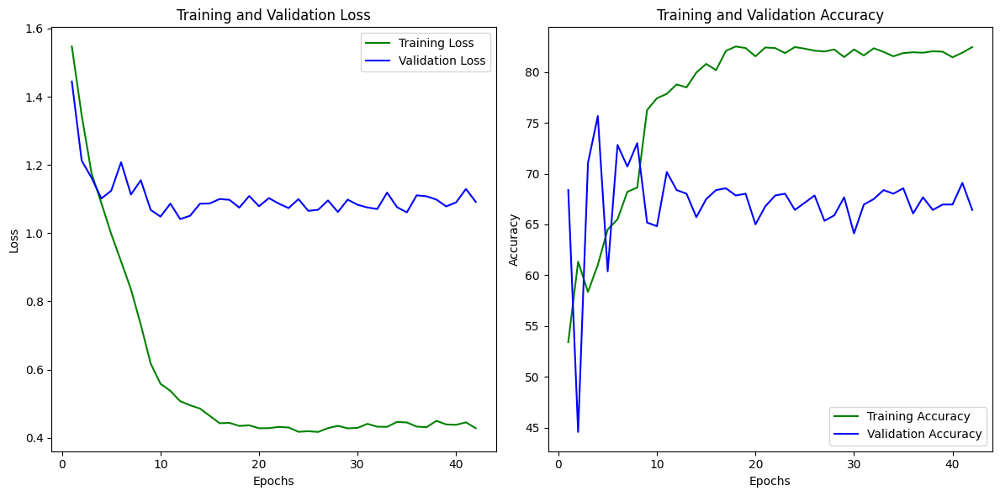


Epoch 43/500
-------------------------------
Epoch: 42, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.424368, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 31.100087, correct predictions: 939, total: 1136
Batch 140/317 processed, running loss: 57.562252, correct predictions: 1879, total: 2256
Batch 210/317 processed, running loss: 86.898565, correct predictions: 2809, total: 3376
Batch 280/317 processed, running loss: 118.568172, correct predictions: 3727, total: 4496

Training Loss per batch = 0.424779	Accuracy on Training set = 82.832872% [4193/5062]

Validation Loss per batch = 1.079774	Accuracy on Validation set = 68.383659% [385/563]
Train Loss: 0.4248, Train Accuracy: 82.8329
Valid Loss: 1.0798, Valid Accuracy: 68.3837


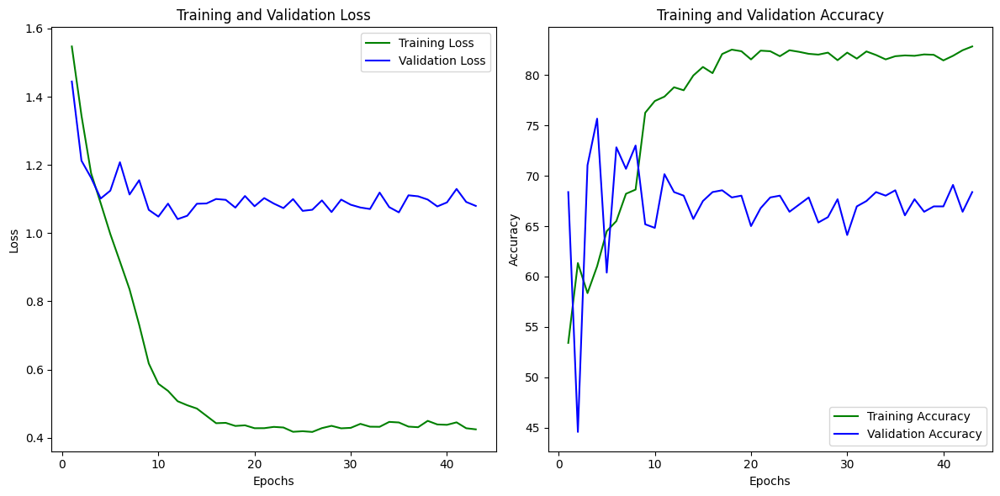


Epoch 44/500
-------------------------------
Epoch: 43, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.258576, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 30.344909, correct predictions: 922, total: 1136
Batch 140/317 processed, running loss: 60.581817, correct predictions: 1848, total: 2256
Batch 210/317 processed, running loss: 89.295102, correct predictions: 2775, total: 3376
Batch 280/317 processed, running loss: 120.011501, correct predictions: 3706, total: 4496

Training Loss per batch = 0.428661	Accuracy on Training set = 82.635322% [4183/5062]

Validation Loss per batch = 1.076756	Accuracy on Validation set = 66.074600% [372/563]
Train Loss: 0.4287, Train Accuracy: 82.6353
Valid Loss: 1.0768, Valid Accuracy: 66.0746


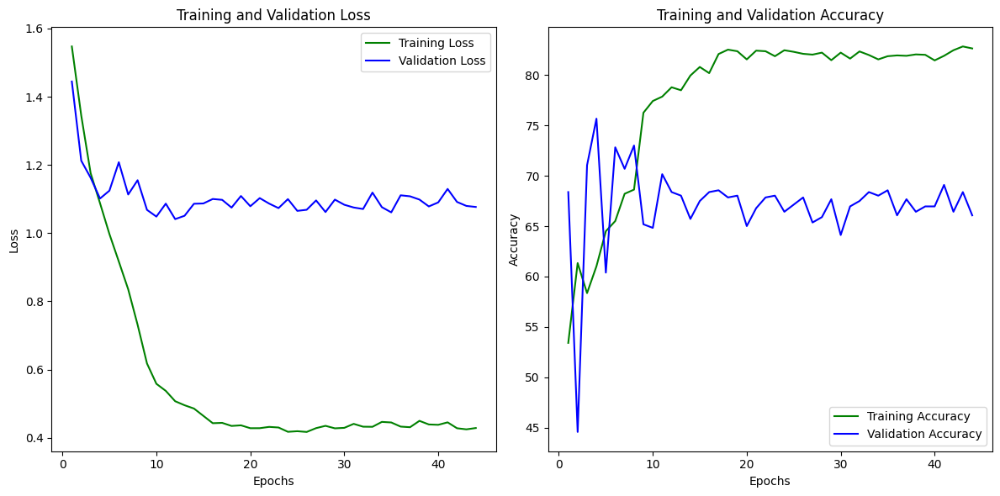


Epoch 45/500
-------------------------------
Epoch: 44, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.194818, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 29.280917, correct predictions: 941, total: 1136
Batch 140/317 processed, running loss: 58.563849, correct predictions: 1875, total: 2256
Batch 210/317 processed, running loss: 89.358338, correct predictions: 2806, total: 3376
Batch 280/317 processed, running loss: 120.641556, correct predictions: 3701, total: 4496

Training Loss per batch = 0.426654	Accuracy on Training set = 82.497037% [4176/5062]

Validation Loss per batch = 1.085816	Accuracy on Validation set = 67.495560% [380/563]
Train Loss: 0.4267, Train Accuracy: 82.4970
Valid Loss: 1.0858, Valid Accuracy: 67.4956


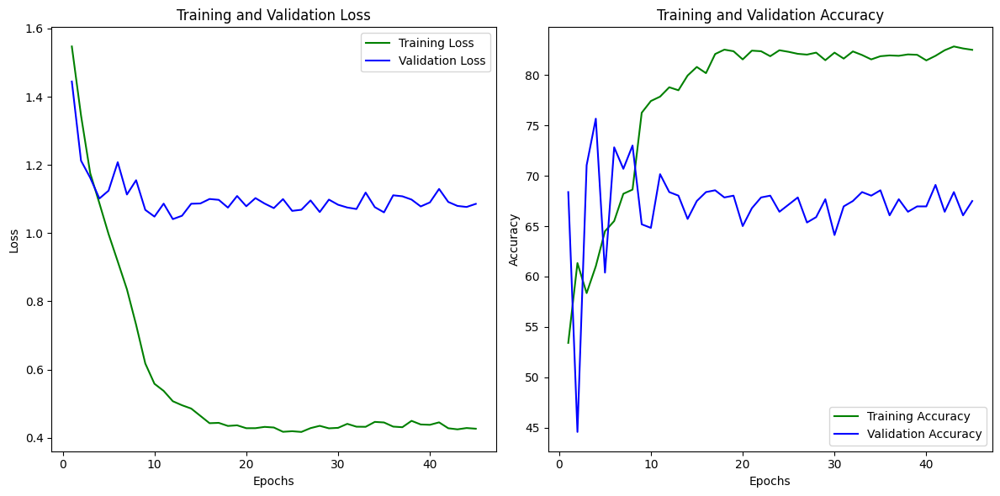


Epoch 46/500
-------------------------------
Epoch: 45, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.664176, correct predictions: 11, total: 16
Batch 70/317 processed, running loss: 29.601958, correct predictions: 926, total: 1136
Batch 140/317 processed, running loss: 58.620805, correct predictions: 1863, total: 2256
Batch 210/317 processed, running loss: 87.623764, correct predictions: 2782, total: 3376
Batch 280/317 processed, running loss: 115.257794, correct predictions: 3695, total: 4496

Training Loss per batch = 0.414035	Accuracy on Training set = 82.180956% [4160/5062]

Validation Loss per batch = 1.109491	Accuracy on Validation set = 68.028419% [383/563]
Train Loss: 0.4140, Train Accuracy: 82.1810
Valid Loss: 1.1095, Valid Accuracy: 68.0284


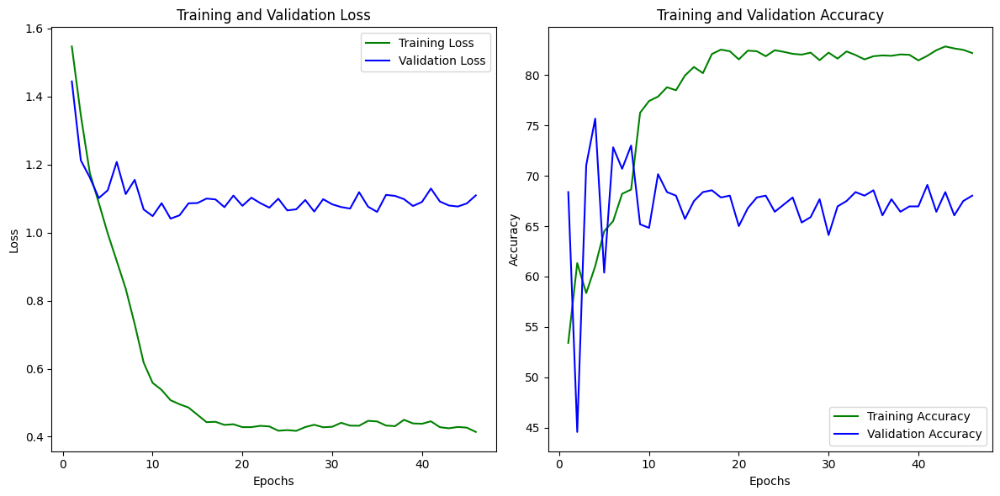


Epoch 47/500
-------------------------------
Epoch: 46, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.617532, correct predictions: 11, total: 16
Batch 70/317 processed, running loss: 30.193530, correct predictions: 934, total: 1136
Batch 140/317 processed, running loss: 62.366249, correct predictions: 1859, total: 2256
Batch 210/317 processed, running loss: 92.026050, correct predictions: 2792, total: 3376
Batch 280/317 processed, running loss: 121.505516, correct predictions: 3707, total: 4496

Training Loss per batch = 0.430286	Accuracy on Training set = 82.398262% [4171/5062]

Validation Loss per batch = 1.087490	Accuracy on Validation set = 66.074600% [372/563]
Train Loss: 0.4303, Train Accuracy: 82.3983
Valid Loss: 1.0875, Valid Accuracy: 66.0746


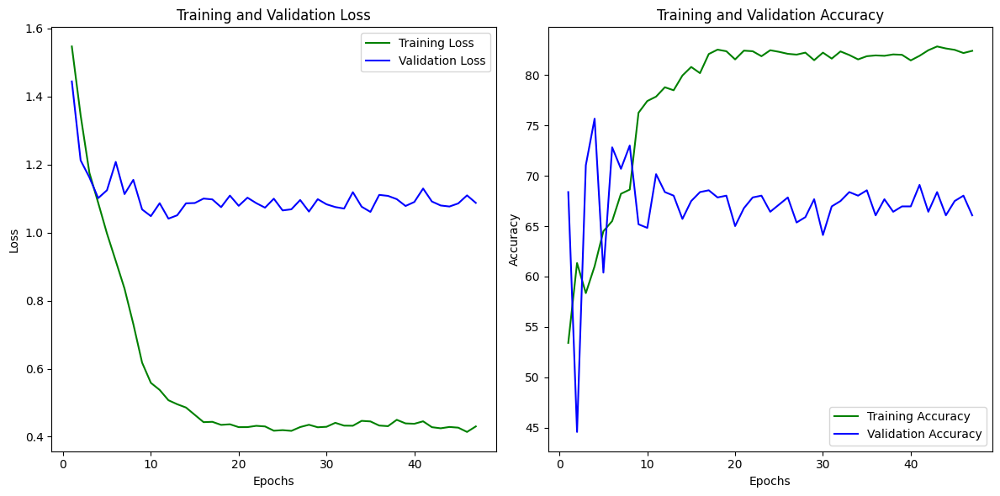


Epoch 48/500
-------------------------------
Epoch: 47, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.469922, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 28.965609, correct predictions: 939, total: 1136
Batch 140/317 processed, running loss: 60.205795, correct predictions: 1851, total: 2256
Batch 210/317 processed, running loss: 89.044195, correct predictions: 2779, total: 3376
Batch 280/317 processed, running loss: 121.582336, correct predictions: 3684, total: 4496

Training Loss per batch = 0.429308	Accuracy on Training set = 82.042671% [4153/5062]

Validation Loss per batch = 1.093434	Accuracy on Validation set = 66.074600% [372/563]
Train Loss: 0.4293, Train Accuracy: 82.0427
Valid Loss: 1.0934, Valid Accuracy: 66.0746


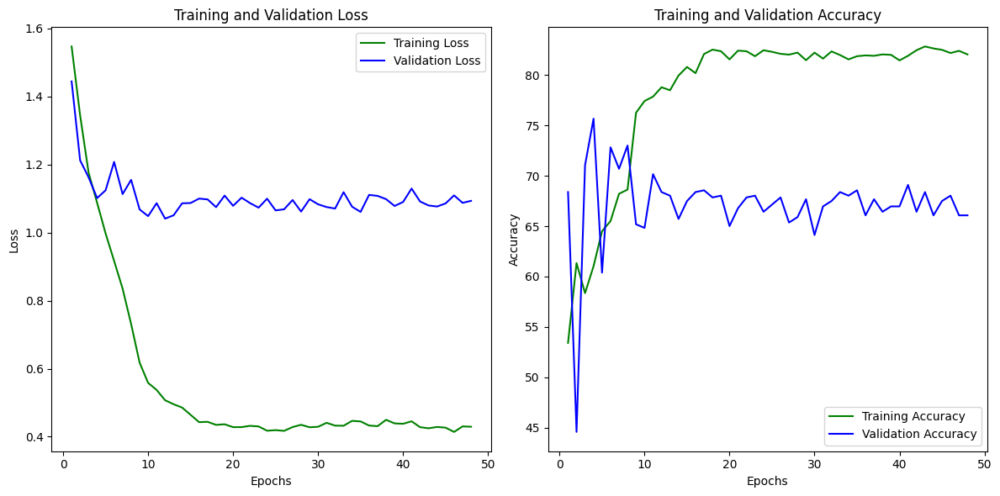


Epoch 49/500
-------------------------------
Epoch: 48, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.106665, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 30.593257, correct predictions: 925, total: 1136
Batch 140/317 processed, running loss: 60.380197, correct predictions: 1852, total: 2256
Batch 210/317 processed, running loss: 90.115413, correct predictions: 2768, total: 3376
Batch 280/317 processed, running loss: 119.952223, correct predictions: 3692, total: 4496

Training Loss per batch = 0.429039	Accuracy on Training set = 82.121691% [4157/5062]

Validation Loss per batch = 1.054418	Accuracy on Validation set = 67.140320% [378/563]
Train Loss: 0.4290, Train Accuracy: 82.1217
Valid Loss: 1.0544, Valid Accuracy: 67.1403


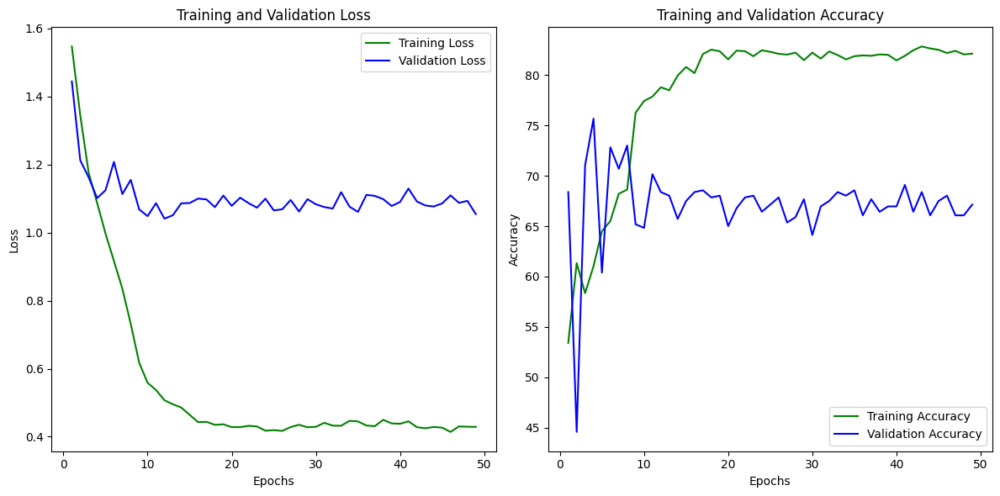


Epoch 50/500
-------------------------------
Epoch: 49, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.254044, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 31.226496, correct predictions: 913, total: 1136
Batch 140/317 processed, running loss: 60.148082, correct predictions: 1820, total: 2256
Batch 210/317 processed, running loss: 91.537680, correct predictions: 2734, total: 3376
Batch 280/317 processed, running loss: 119.195690, correct predictions: 3680, total: 4496

Training Loss per batch = 0.429731	Accuracy on Training set = 81.667325% [4134/5062]

Validation Loss per batch = 1.101099	Accuracy on Validation set = 64.476021% [363/563]
Train Loss: 0.4297, Train Accuracy: 81.6673
Valid Loss: 1.1011, Valid Accuracy: 64.4760


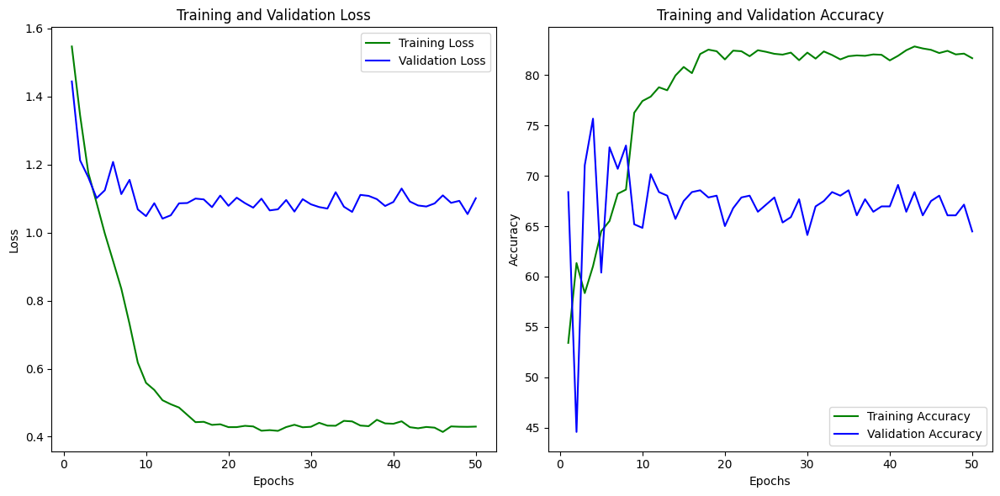


Epoch 51/500
-------------------------------
Epoch: 50, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.312493, correct predictions: 12, total: 16
Batch 70/317 processed, running loss: 31.339493, correct predictions: 929, total: 1136
Batch 140/317 processed, running loss: 61.245091, correct predictions: 1851, total: 2256
Batch 210/317 processed, running loss: 90.846034, correct predictions: 2776, total: 3376
Batch 280/317 processed, running loss: 123.084338, correct predictions: 3682, total: 4496

Training Loss per batch = 0.442438	Accuracy on Training set = 81.746345% [4138/5062]

Validation Loss per batch = 1.087935	Accuracy on Validation set = 67.140320% [378/563]
Train Loss: 0.4424, Train Accuracy: 81.7463
Valid Loss: 1.0879, Valid Accuracy: 67.1403


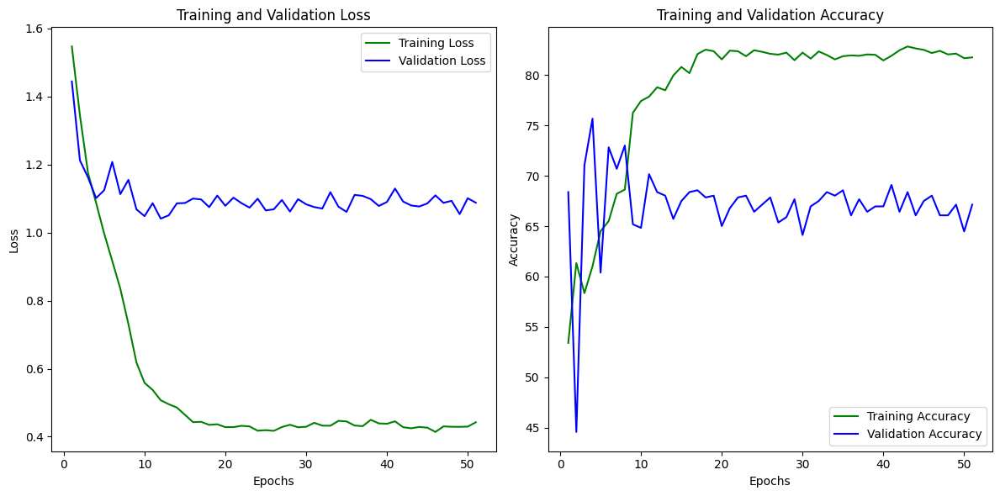


Epoch 52/500
-------------------------------
Epoch: 51, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.181969, correct predictions: 16, total: 16
Batch 70/317 processed, running loss: 29.670884, correct predictions: 928, total: 1136
Batch 140/317 processed, running loss: 59.216714, correct predictions: 1849, total: 2256
Batch 210/317 processed, running loss: 87.792859, correct predictions: 2767, total: 3376
Batch 280/317 processed, running loss: 118.216645, correct predictions: 3700, total: 4496

Training Loss per batch = 0.421917	Accuracy on Training set = 82.220466% [4162/5062]

Validation Loss per batch = 1.077767	Accuracy on Validation set = 68.383659% [385/563]
Train Loss: 0.4219, Train Accuracy: 82.2205
Valid Loss: 1.0778, Valid Accuracy: 68.3837


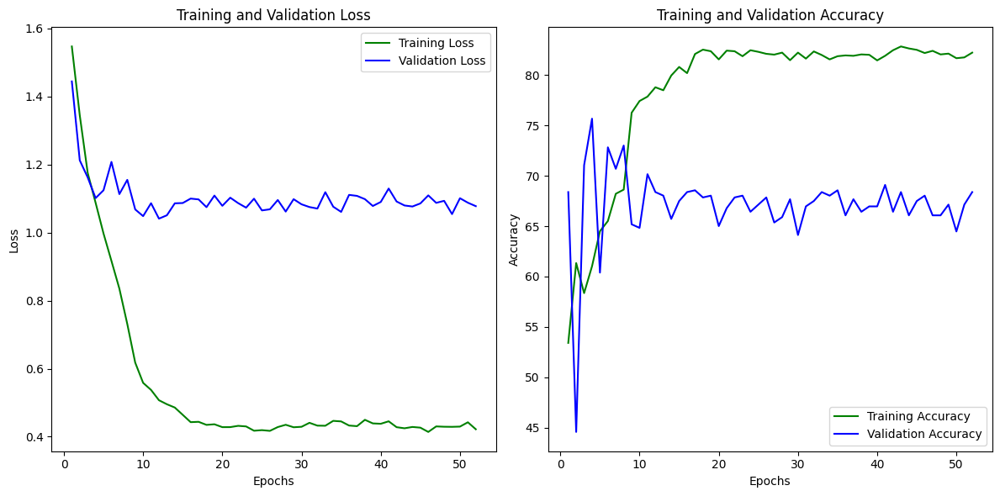


Epoch 53/500
-------------------------------
Epoch: 52, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.537912, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 29.318537, correct predictions: 943, total: 1136
Batch 140/317 processed, running loss: 59.480960, correct predictions: 1875, total: 2256
Batch 210/317 processed, running loss: 87.356782, correct predictions: 2811, total: 3376
Batch 280/317 processed, running loss: 118.122187, correct predictions: 3714, total: 4496

Training Loss per batch = 0.426879	Accuracy on Training set = 82.536547% [4178/5062]

Validation Loss per batch = 1.082746	Accuracy on Validation set = 68.206039% [384/563]
Train Loss: 0.4269, Train Accuracy: 82.5365
Valid Loss: 1.0827, Valid Accuracy: 68.2060


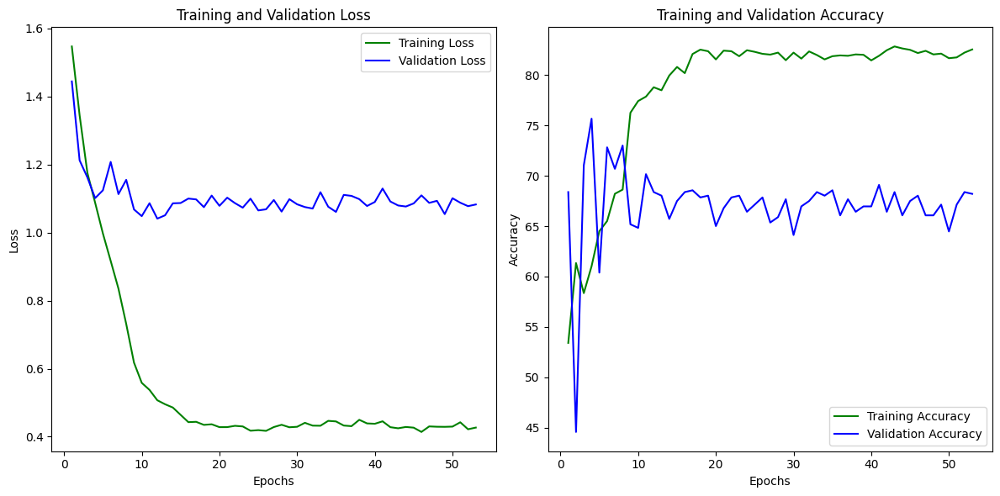


Epoch 54/500
-------------------------------
Epoch: 53, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.210307, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 30.934708, correct predictions: 954, total: 1136
Batch 140/317 processed, running loss: 61.657150, correct predictions: 1866, total: 2256
Batch 210/317 processed, running loss: 89.703822, correct predictions: 2785, total: 3376
Batch 280/317 processed, running loss: 120.447495, correct predictions: 3701, total: 4496

Training Loss per batch = 0.430237	Accuracy on Training set = 82.299486% [4166/5062]

Validation Loss per batch = 1.088559	Accuracy on Validation set = 67.140320% [378/563]
Train Loss: 0.4302, Train Accuracy: 82.2995
Valid Loss: 1.0886, Valid Accuracy: 67.1403


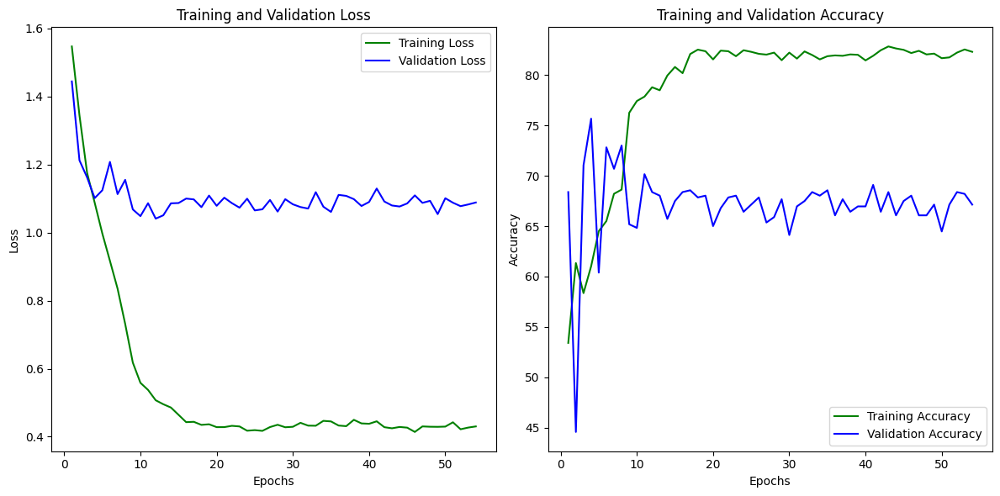


Epoch 55/500
-------------------------------
Epoch: 54, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.648238, correct predictions: 12, total: 16
Batch 70/317 processed, running loss: 30.172557, correct predictions: 927, total: 1136
Batch 140/317 processed, running loss: 58.801322, correct predictions: 1861, total: 2256
Batch 210/317 processed, running loss: 91.299298, correct predictions: 2768, total: 3376
Batch 280/317 processed, running loss: 119.983605, correct predictions: 3705, total: 4496

Training Loss per batch = 0.429063	Accuracy on Training set = 82.200711% [4161/5062]

Validation Loss per batch = 1.091028	Accuracy on Validation set = 68.738899% [387/563]
Train Loss: 0.4291, Train Accuracy: 82.2007
Valid Loss: 1.0910, Valid Accuracy: 68.7389


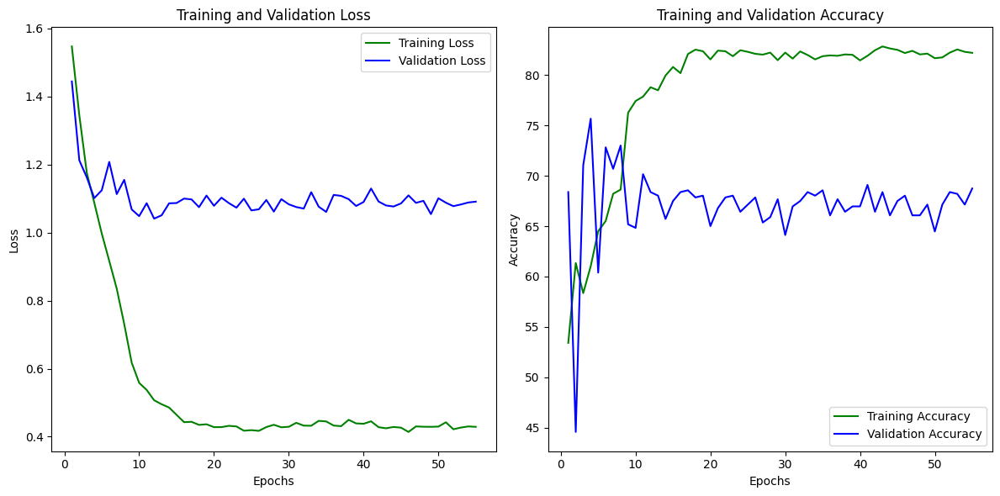


Epoch 56/500
-------------------------------
Epoch: 55, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.230649, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 29.489009, correct predictions: 943, total: 1136
Batch 140/317 processed, running loss: 60.573663, correct predictions: 1851, total: 2256
Batch 210/317 processed, running loss: 91.398739, correct predictions: 2774, total: 3376
Batch 280/317 processed, running loss: 124.354837, correct predictions: 3677, total: 4496

Training Loss per batch = 0.438890	Accuracy on Training set = 81.785855% [4140/5062]

Validation Loss per batch = 1.091984	Accuracy on Validation set = 66.962700% [377/563]
Train Loss: 0.4389, Train Accuracy: 81.7859
Valid Loss: 1.0920, Valid Accuracy: 66.9627


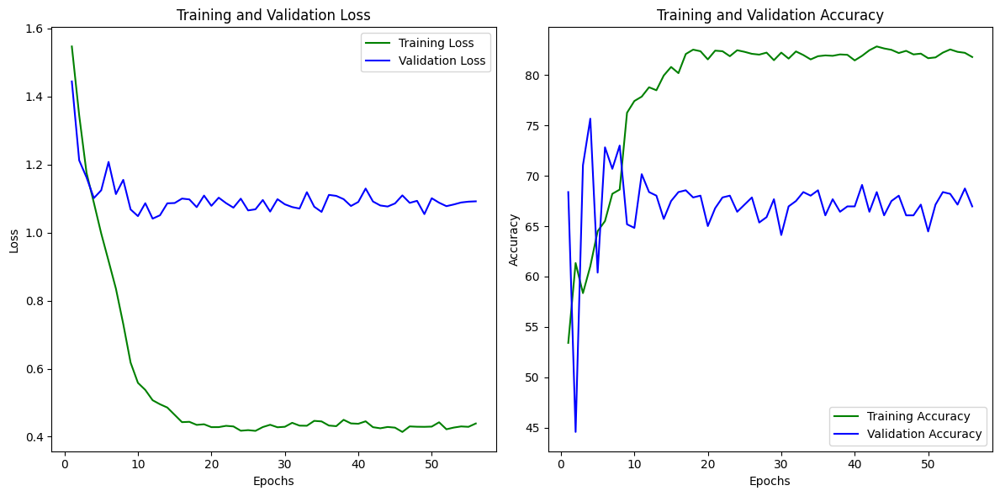


Epoch 57/500
-------------------------------
Epoch: 56, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.243173, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 30.441463, correct predictions: 908, total: 1136
Batch 140/317 processed, running loss: 60.543915, correct predictions: 1828, total: 2256
Batch 210/317 processed, running loss: 87.577023, correct predictions: 2772, total: 3376
Batch 280/317 processed, running loss: 120.020367, correct predictions: 3694, total: 4496

Training Loss per batch = 0.426812	Accuracy on Training set = 82.022916% [4152/5062]

Validation Loss per batch = 1.070335	Accuracy on Validation set = 68.383659% [385/563]
Train Loss: 0.4268, Train Accuracy: 82.0229
Valid Loss: 1.0703, Valid Accuracy: 68.3837


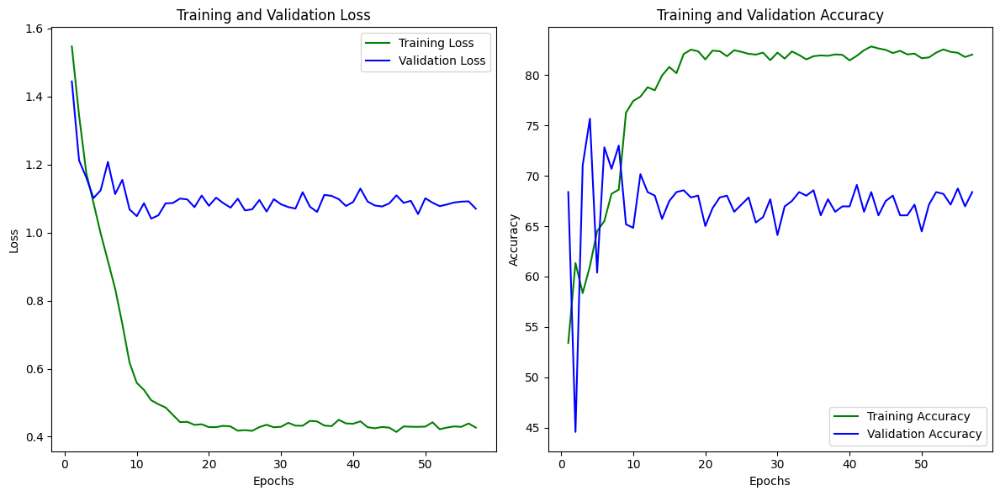


Epoch 58/500
-------------------------------
Epoch: 57, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.274329, correct predictions: 12, total: 16
Batch 70/317 processed, running loss: 29.358867, correct predictions: 949, total: 1136
Batch 140/317 processed, running loss: 62.149248, correct predictions: 1837, total: 2256
Batch 210/317 processed, running loss: 92.578968, correct predictions: 2748, total: 3376
Batch 280/317 processed, running loss: 122.194096, correct predictions: 3670, total: 4496

Training Loss per batch = 0.436861	Accuracy on Training set = 81.568550% [4129/5062]

Validation Loss per batch = 1.088436	Accuracy on Validation set = 68.383659% [385/563]
Train Loss: 0.4369, Train Accuracy: 81.5685
Valid Loss: 1.0884, Valid Accuracy: 68.3837


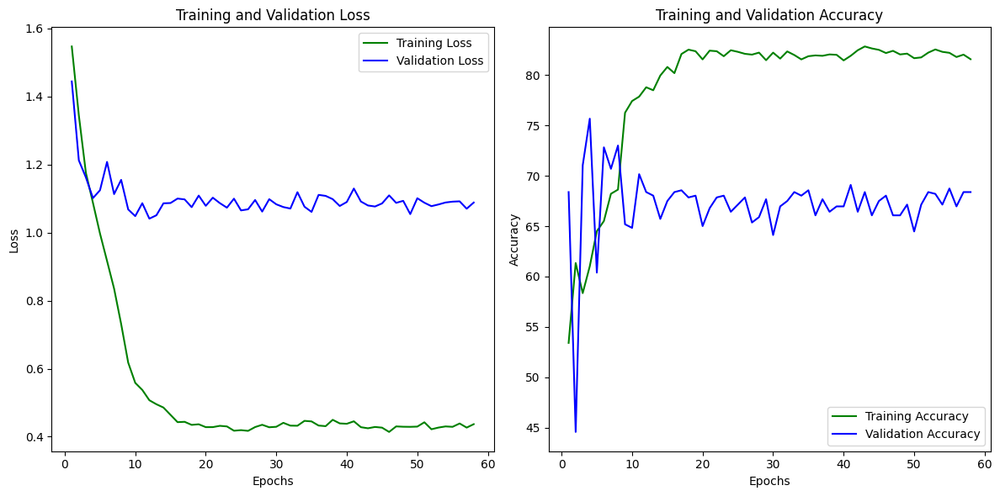


Epoch 59/500
-------------------------------
Epoch: 58, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.220313, correct predictions: 10, total: 16
Batch 70/317 processed, running loss: 30.064930, correct predictions: 926, total: 1136
Batch 140/317 processed, running loss: 61.094016, correct predictions: 1860, total: 2256
Batch 210/317 processed, running loss: 89.587863, correct predictions: 2783, total: 3376
Batch 280/317 processed, running loss: 120.823937, correct predictions: 3681, total: 4496

Training Loss per batch = 0.433550	Accuracy on Training set = 81.884631% [4145/5062]

Validation Loss per batch = 1.083236	Accuracy on Validation set = 66.429840% [374/563]
Train Loss: 0.4336, Train Accuracy: 81.8846
Valid Loss: 1.0832, Valid Accuracy: 66.4298


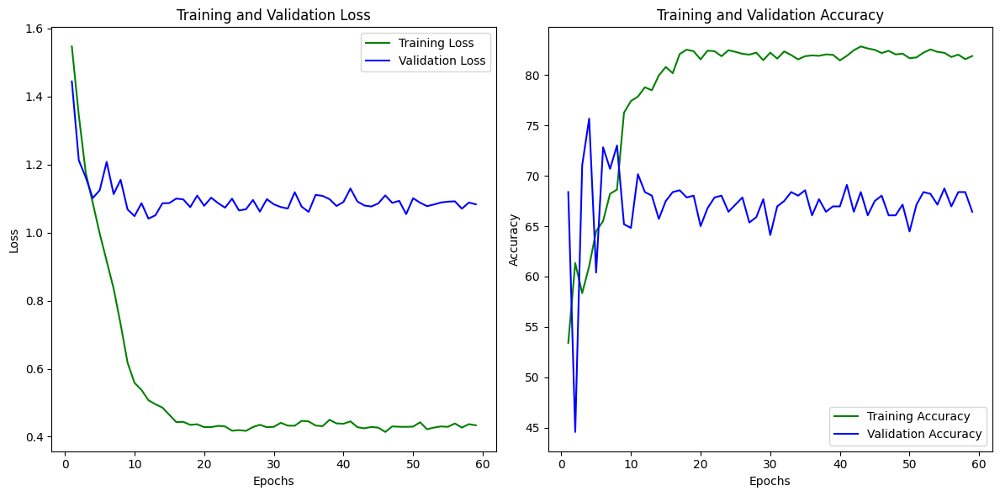


Epoch 60/500
-------------------------------
Epoch: 59, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.250223, correct predictions: 16, total: 16
Batch 70/317 processed, running loss: 30.915882, correct predictions: 949, total: 1136
Batch 140/317 processed, running loss: 61.871168, correct predictions: 1865, total: 2256
Batch 210/317 processed, running loss: 93.531350, correct predictions: 2766, total: 3376
Batch 280/317 processed, running loss: 125.205550, correct predictions: 3678, total: 4496

Training Loss per batch = 0.445739	Accuracy on Training set = 81.706835% [4136/5062]

Validation Loss per batch = 1.133375	Accuracy on Validation set = 67.317940% [379/563]
Train Loss: 0.4457, Train Accuracy: 81.7068
Valid Loss: 1.1334, Valid Accuracy: 67.3179


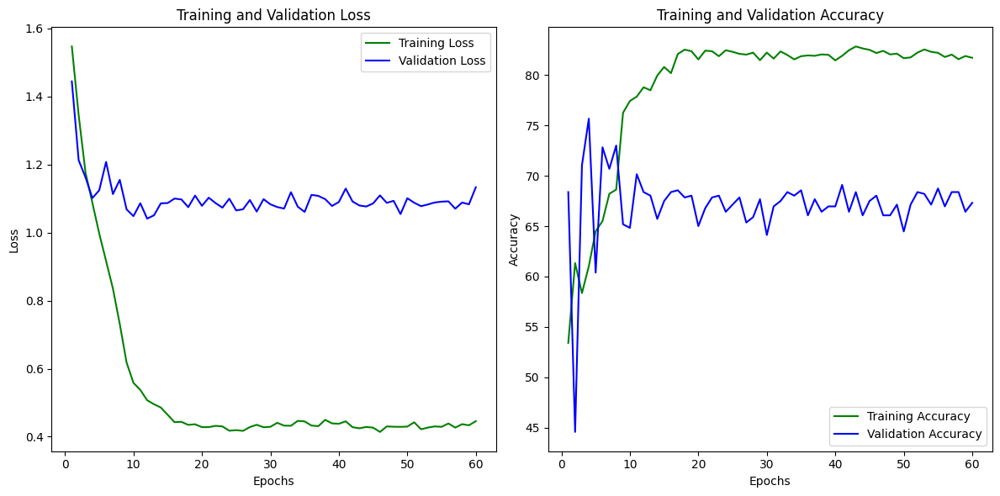


Epoch 61/500
-------------------------------
Epoch: 60, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.244128, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 29.103146, correct predictions: 925, total: 1136
Batch 140/317 processed, running loss: 61.999443, correct predictions: 1835, total: 2256
Batch 210/317 processed, running loss: 91.042602, correct predictions: 2759, total: 3376
Batch 280/317 processed, running loss: 119.052754, correct predictions: 3699, total: 4496

Training Loss per batch = 0.430260	Accuracy on Training set = 82.082181% [4155/5062]

Validation Loss per batch = 1.103697	Accuracy on Validation set = 66.962700% [377/563]
Train Loss: 0.4303, Train Accuracy: 82.0822
Valid Loss: 1.1037, Valid Accuracy: 66.9627


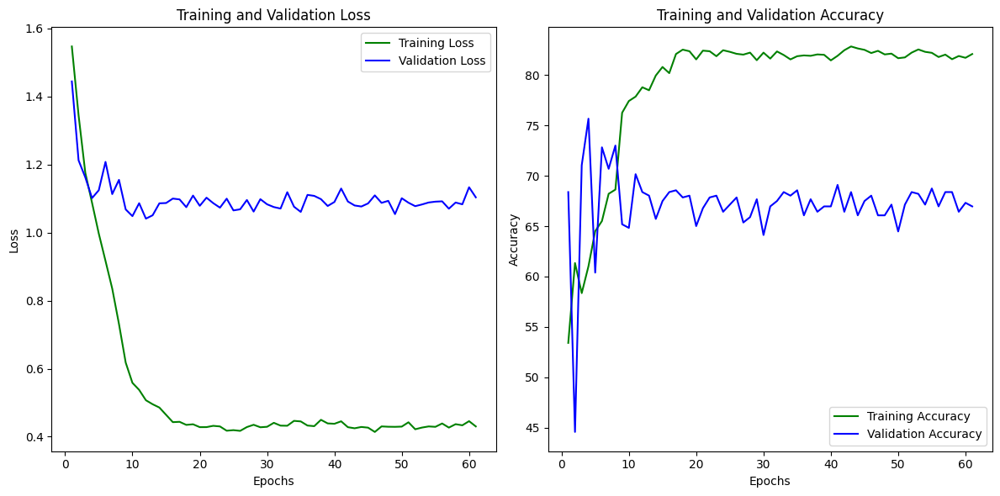


Epoch 62/500
-------------------------------
Epoch: 61, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.382554, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 30.363767, correct predictions: 919, total: 1136
Batch 140/317 processed, running loss: 61.424410, correct predictions: 1836, total: 2256
Batch 210/317 processed, running loss: 90.406921, correct predictions: 2760, total: 3376
Batch 280/317 processed, running loss: 119.041583, correct predictions: 3679, total: 4496

Training Loss per batch = 0.428544	Accuracy on Training set = 81.726590% [4137/5062]

Validation Loss per batch = 1.083828	Accuracy on Validation set = 66.962700% [377/563]
Train Loss: 0.4285, Train Accuracy: 81.7266
Valid Loss: 1.0838, Valid Accuracy: 66.9627


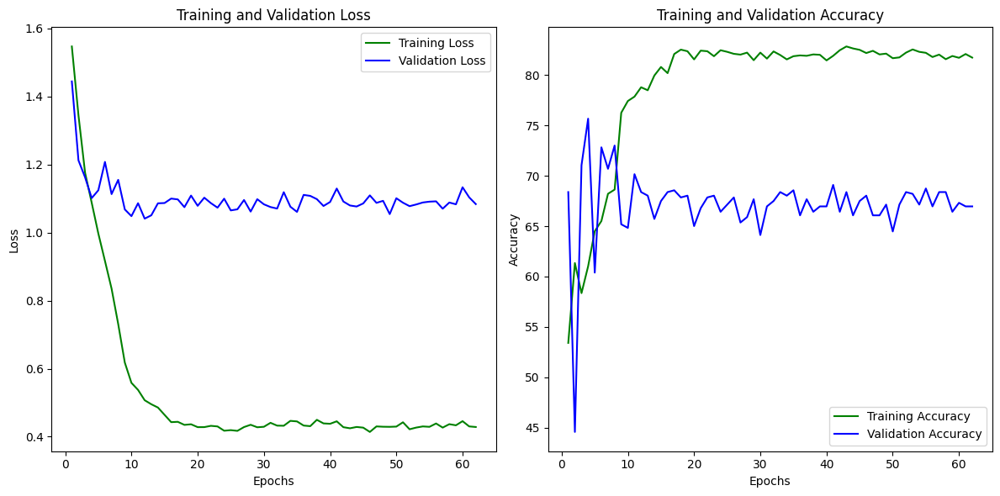


Epoch 63/500
-------------------------------
Epoch: 62, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.233212, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 32.711153, correct predictions: 937, total: 1136
Batch 140/317 processed, running loss: 62.501557, correct predictions: 1856, total: 2256
Batch 210/317 processed, running loss: 92.826902, correct predictions: 2785, total: 3376
Batch 280/317 processed, running loss: 122.072112, correct predictions: 3723, total: 4496

Training Loss per batch = 0.441433	Accuracy on Training set = 82.734097% [4188/5062]

Validation Loss per batch = 1.080826	Accuracy on Validation set = 65.008881% [366/563]
Train Loss: 0.4414, Train Accuracy: 82.7341
Valid Loss: 1.0808, Valid Accuracy: 65.0089


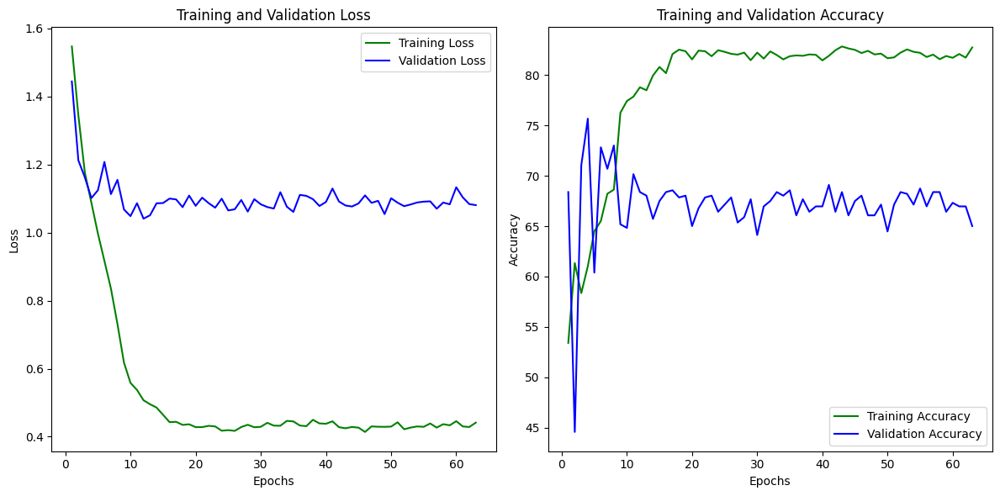


Epoch 64/500
-------------------------------
Epoch: 63, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.646154, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 30.007600, correct predictions: 925, total: 1136
Batch 140/317 processed, running loss: 61.778708, correct predictions: 1832, total: 2256
Batch 210/317 processed, running loss: 92.225121, correct predictions: 2748, total: 3376
Batch 280/317 processed, running loss: 121.677520, correct predictions: 3678, total: 4496

Training Loss per batch = 0.434414	Accuracy on Training set = 81.726590% [4137/5062]

Validation Loss per batch = 1.092703	Accuracy on Validation set = 67.140320% [378/563]
Train Loss: 0.4344, Train Accuracy: 81.7266
Valid Loss: 1.0927, Valid Accuracy: 67.1403


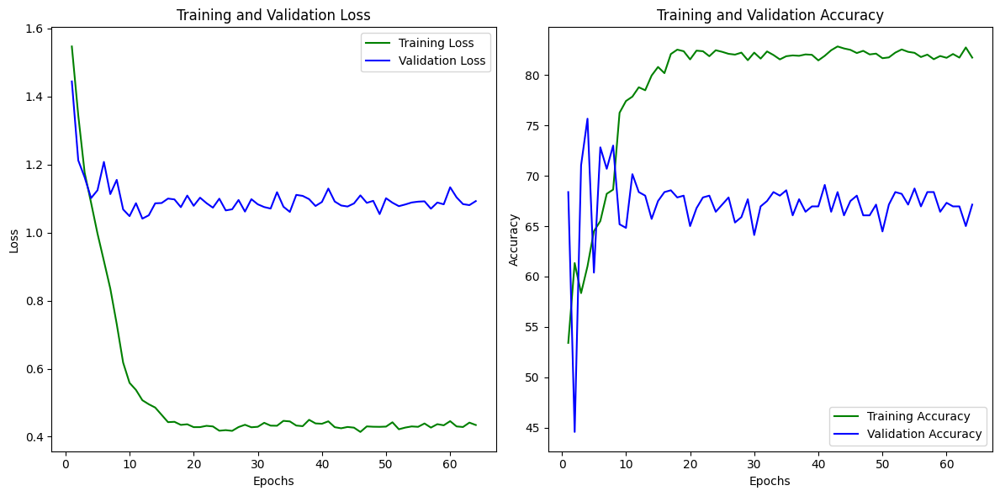


Epoch 65/500
-------------------------------
Epoch: 64, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.463095, correct predictions: 11, total: 16
Batch 70/317 processed, running loss: 29.899790, correct predictions: 938, total: 1136
Batch 140/317 processed, running loss: 61.147580, correct predictions: 1846, total: 2256
Batch 210/317 processed, running loss: 93.787034, correct predictions: 2749, total: 3376
Batch 280/317 processed, running loss: 123.068170, correct predictions: 3678, total: 4496

Training Loss per batch = 0.435090	Accuracy on Training set = 81.785855% [4140/5062]

Validation Loss per batch = 1.106504	Accuracy on Validation set = 67.140320% [378/563]
Train Loss: 0.4351, Train Accuracy: 81.7859
Valid Loss: 1.1065, Valid Accuracy: 67.1403


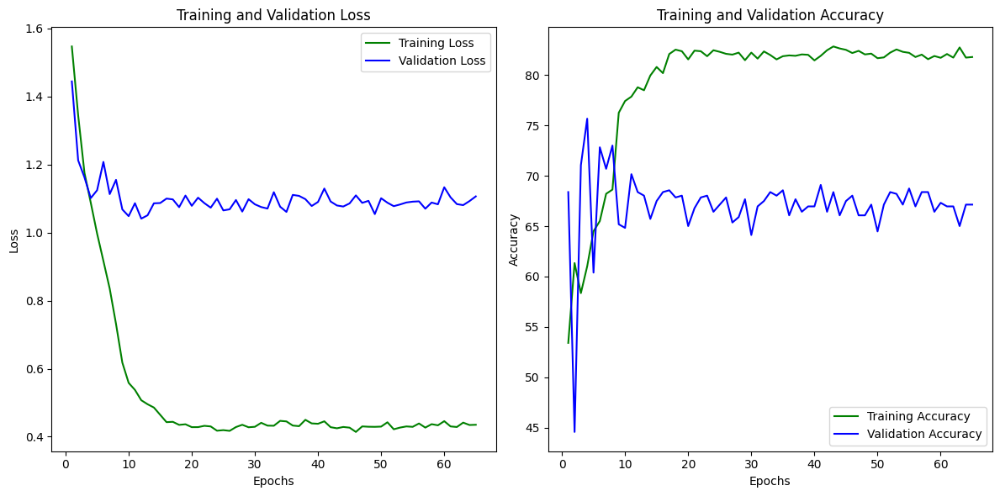


Epoch 66/500
-------------------------------
Epoch: 65, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.297120, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 31.752588, correct predictions: 944, total: 1136
Batch 140/317 processed, running loss: 63.362889, correct predictions: 1858, total: 2256
Batch 210/317 processed, running loss: 91.848549, correct predictions: 2773, total: 3376
Batch 280/317 processed, running loss: 119.559213, correct predictions: 3699, total: 4496

Training Loss per batch = 0.432747	Accuracy on Training set = 82.240221% [4163/5062]

Validation Loss per batch = 1.083074	Accuracy on Validation set = 66.252220% [373/563]
Train Loss: 0.4327, Train Accuracy: 82.2402
Valid Loss: 1.0831, Valid Accuracy: 66.2522


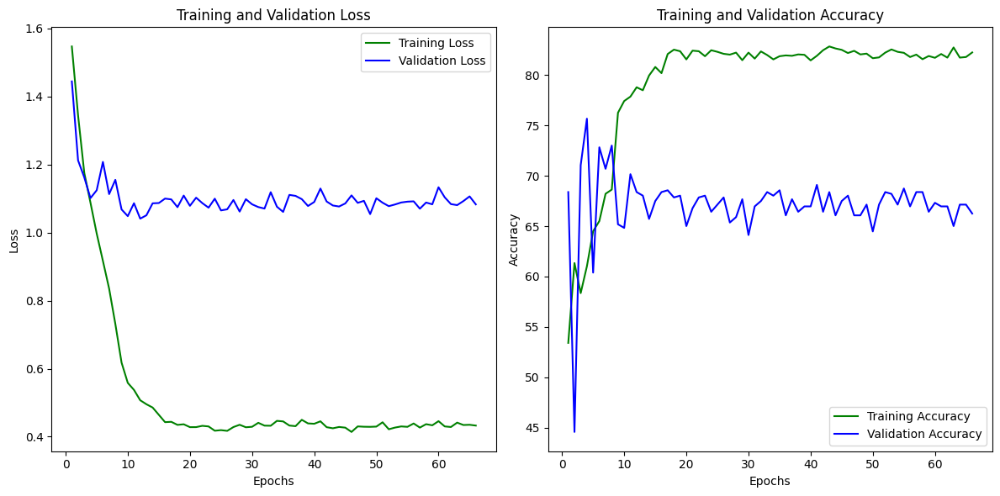


Epoch 67/500
-------------------------------
Epoch: 66, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.611232, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 29.269423, correct predictions: 950, total: 1136
Batch 140/317 processed, running loss: 58.186529, correct predictions: 1870, total: 2256
Batch 210/317 processed, running loss: 89.472447, correct predictions: 2789, total: 3376
Batch 280/317 processed, running loss: 118.320306, correct predictions: 3695, total: 4496

Training Loss per batch = 0.426340	Accuracy on Training set = 81.864876% [4144/5062]

Validation Loss per batch = 1.105155	Accuracy on Validation set = 69.094139% [389/563]
Train Loss: 0.4263, Train Accuracy: 81.8649
Valid Loss: 1.1052, Valid Accuracy: 69.0941


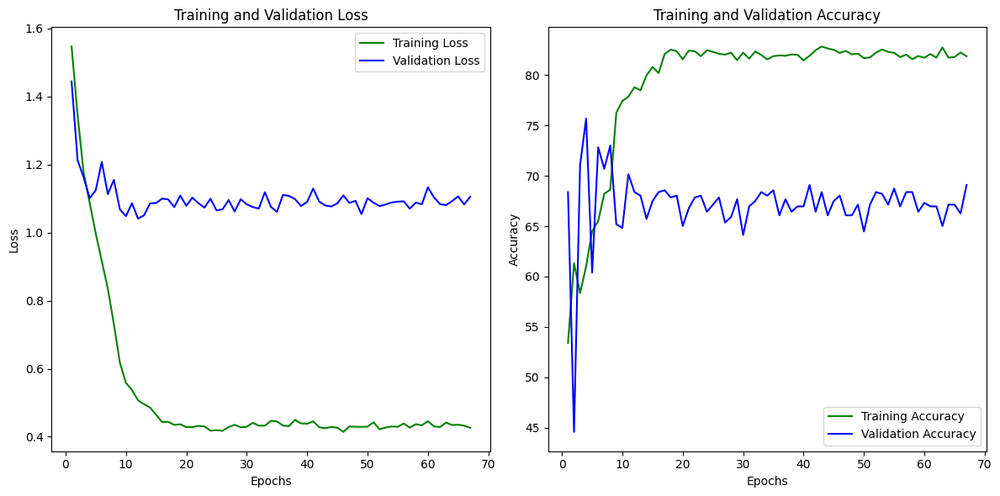


Epoch 68/500
-------------------------------
Epoch: 67, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.337816, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 30.037315, correct predictions: 952, total: 1136
Batch 140/317 processed, running loss: 60.629791, correct predictions: 1867, total: 2256
Batch 210/317 processed, running loss: 91.171428, correct predictions: 2765, total: 3376
Batch 280/317 processed, running loss: 120.081284, correct predictions: 3697, total: 4496

Training Loss per batch = 0.426981	Accuracy on Training set = 82.259976% [4164/5062]

Validation Loss per batch = 1.069832	Accuracy on Validation set = 66.607460% [375/563]
Train Loss: 0.4270, Train Accuracy: 82.2600
Valid Loss: 1.0698, Valid Accuracy: 66.6075


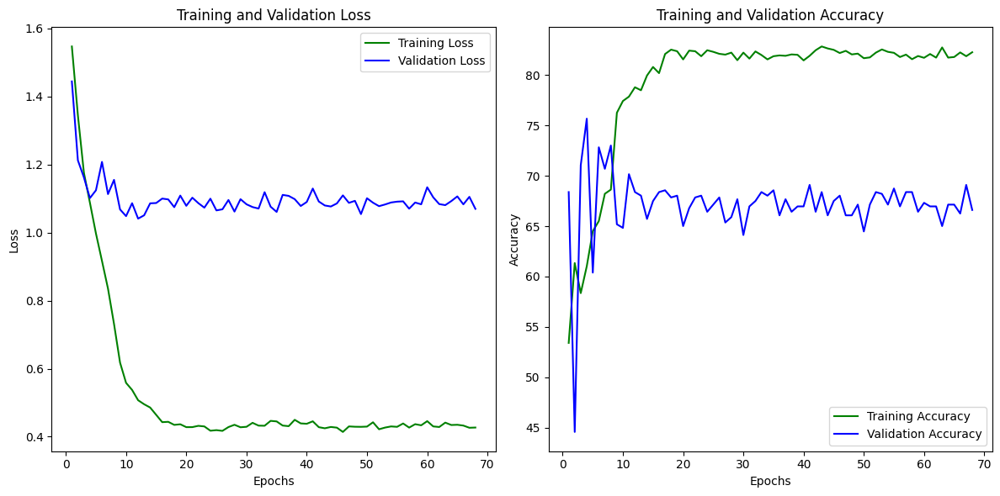


Epoch 69/500
-------------------------------
Epoch: 68, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.431548, correct predictions: 16, total: 16
Batch 70/317 processed, running loss: 28.415597, correct predictions: 951, total: 1136
Batch 140/317 processed, running loss: 59.251984, correct predictions: 1874, total: 2256
Batch 210/317 processed, running loss: 89.854084, correct predictions: 2783, total: 3376
Batch 280/317 processed, running loss: 120.909405, correct predictions: 3701, total: 4496

Training Loss per batch = 0.429268	Accuracy on Training set = 82.358751% [4169/5062]

Validation Loss per batch = 1.083273	Accuracy on Validation set = 68.383659% [385/563]
Train Loss: 0.4293, Train Accuracy: 82.3588
Valid Loss: 1.0833, Valid Accuracy: 68.3837


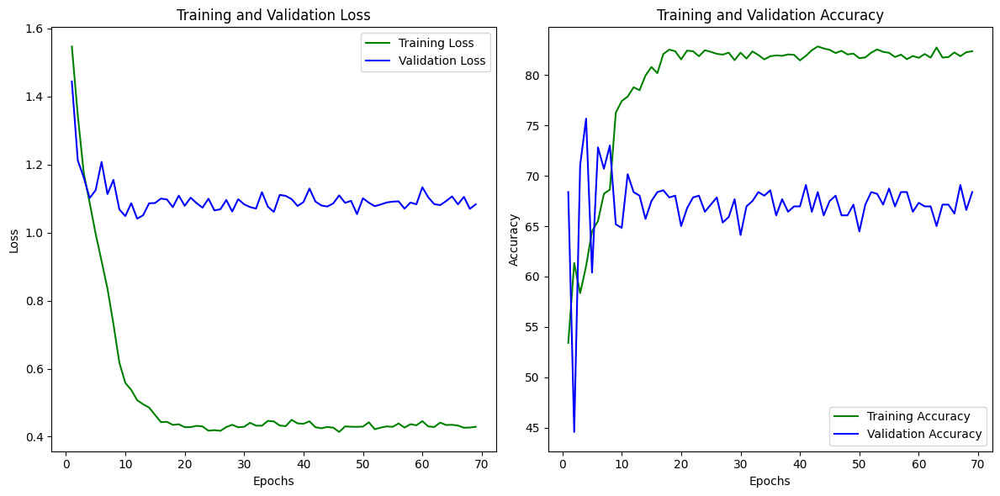


Epoch 70/500
-------------------------------
Epoch: 69, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.479908, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 28.848557, correct predictions: 925, total: 1136
Batch 140/317 processed, running loss: 60.463014, correct predictions: 1856, total: 2256
Batch 210/317 processed, running loss: 89.680913, correct predictions: 2796, total: 3376
Batch 280/317 processed, running loss: 120.679393, correct predictions: 3716, total: 4496

Training Loss per batch = 0.432589	Accuracy on Training set = 82.378507% [4170/5062]

Validation Loss per batch = 1.100729	Accuracy on Validation set = 66.962700% [377/563]
Train Loss: 0.4326, Train Accuracy: 82.3785
Valid Loss: 1.1007, Valid Accuracy: 66.9627


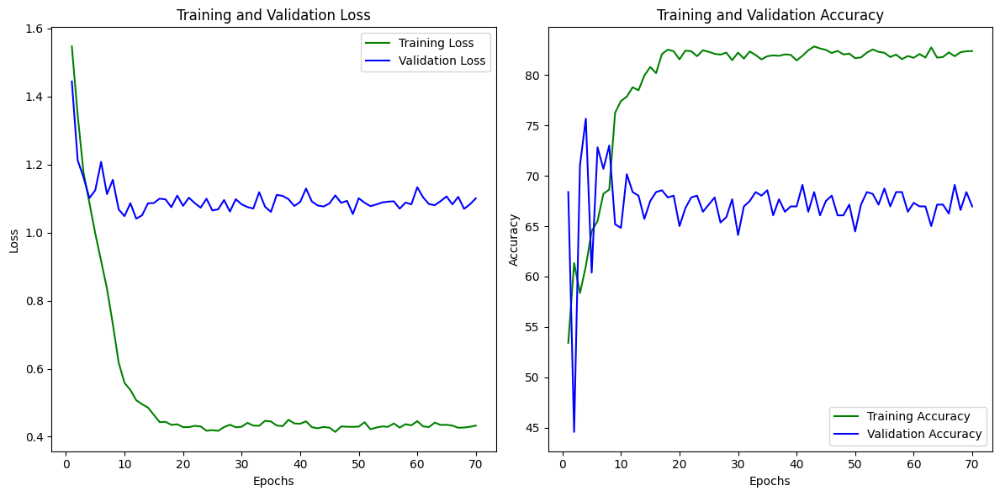


Epoch 71/500
-------------------------------
Epoch: 70, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.455095, correct predictions: 10, total: 16
Batch 70/317 processed, running loss: 30.737314, correct predictions: 931, total: 1136
Batch 140/317 processed, running loss: 61.086005, correct predictions: 1825, total: 2256
Batch 210/317 processed, running loss: 91.332332, correct predictions: 2748, total: 3376
Batch 280/317 processed, running loss: 120.426942, correct predictions: 3679, total: 4496

Training Loss per batch = 0.425122	Accuracy on Training set = 82.022916% [4152/5062]

Validation Loss per batch = 1.117185	Accuracy on Validation set = 67.317940% [379/563]
Train Loss: 0.4251, Train Accuracy: 82.0229
Valid Loss: 1.1172, Valid Accuracy: 67.3179


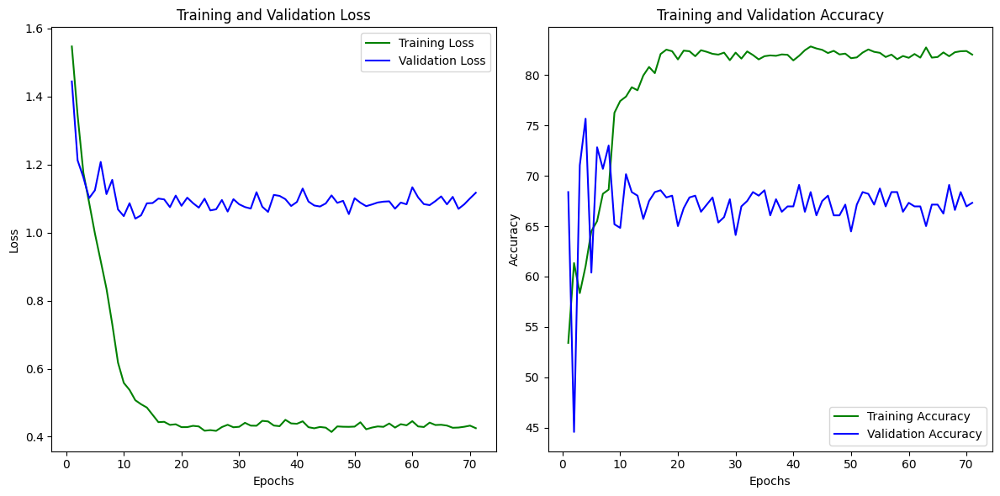


Epoch 72/500
-------------------------------
Epoch: 71, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.281465, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 30.350872, correct predictions: 935, total: 1136
Batch 140/317 processed, running loss: 58.033858, correct predictions: 1848, total: 2256
Batch 210/317 processed, running loss: 87.336593, correct predictions: 2779, total: 3376
Batch 280/317 processed, running loss: 118.171532, correct predictions: 3670, total: 4496

Training Loss per batch = 0.424495	Accuracy on Training set = 81.509285% [4126/5062]

Validation Loss per batch = 1.062453	Accuracy on Validation set = 64.476021% [363/563]
Train Loss: 0.4245, Train Accuracy: 81.5093
Valid Loss: 1.0625, Valid Accuracy: 64.4760


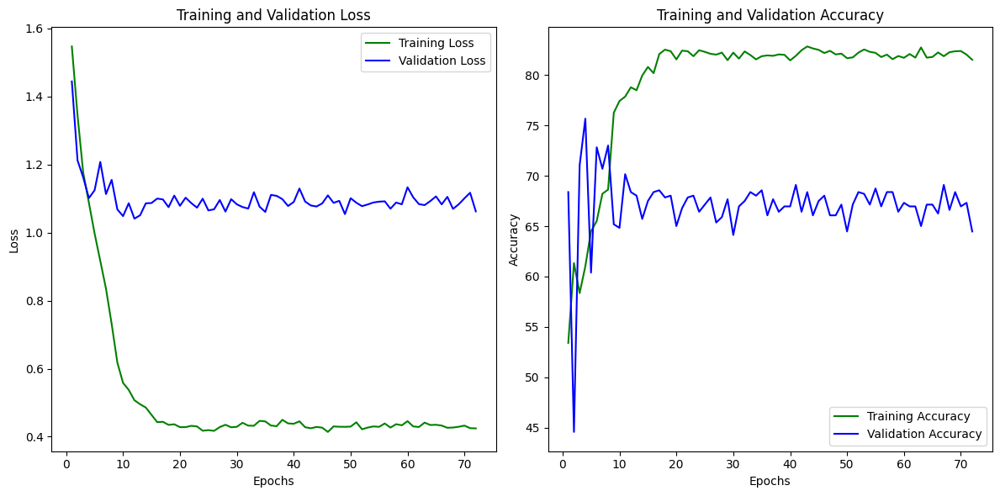


Epoch 73/500
-------------------------------
Epoch: 72, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.613380, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 30.951298, correct predictions: 927, total: 1136
Batch 140/317 processed, running loss: 63.896680, correct predictions: 1841, total: 2256
Batch 210/317 processed, running loss: 93.499481, correct predictions: 2751, total: 3376
Batch 280/317 processed, running loss: 124.316719, correct predictions: 3649, total: 4496

Training Loss per batch = 0.440974	Accuracy on Training set = 81.430265% [4122/5062]

Validation Loss per batch = 1.101935	Accuracy on Validation set = 67.140320% [378/563]
Train Loss: 0.4410, Train Accuracy: 81.4303
Valid Loss: 1.1019, Valid Accuracy: 67.1403


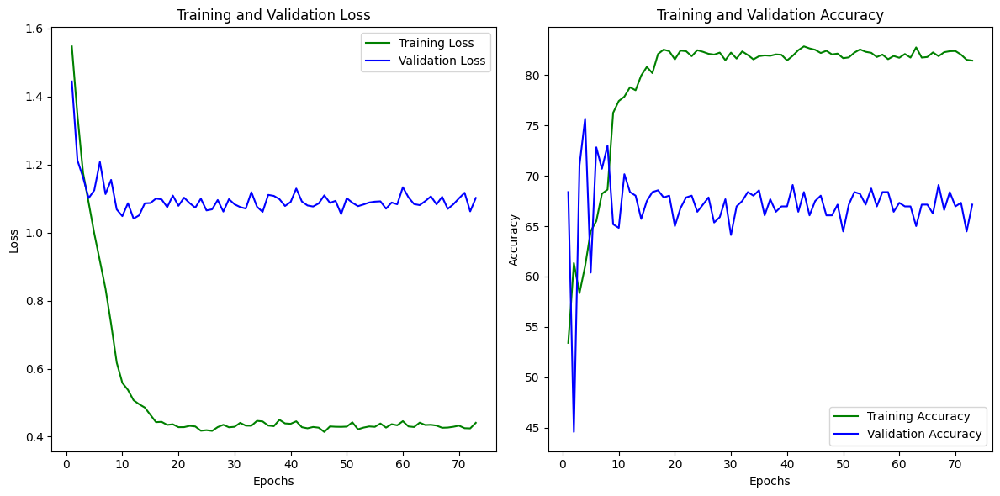


Epoch 74/500
-------------------------------
Epoch: 73, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.407114, correct predictions: 11, total: 16
Batch 70/317 processed, running loss: 30.579662, correct predictions: 929, total: 1136
Batch 140/317 processed, running loss: 61.457274, correct predictions: 1844, total: 2256
Batch 210/317 processed, running loss: 92.262613, correct predictions: 2751, total: 3376
Batch 280/317 processed, running loss: 120.729242, correct predictions: 3683, total: 4496

Training Loss per batch = 0.431547	Accuracy on Training set = 82.121691% [4157/5062]

Validation Loss per batch = 1.060253	Accuracy on Validation set = 66.252220% [373/563]
Train Loss: 0.4315, Train Accuracy: 82.1217
Valid Loss: 1.0603, Valid Accuracy: 66.2522


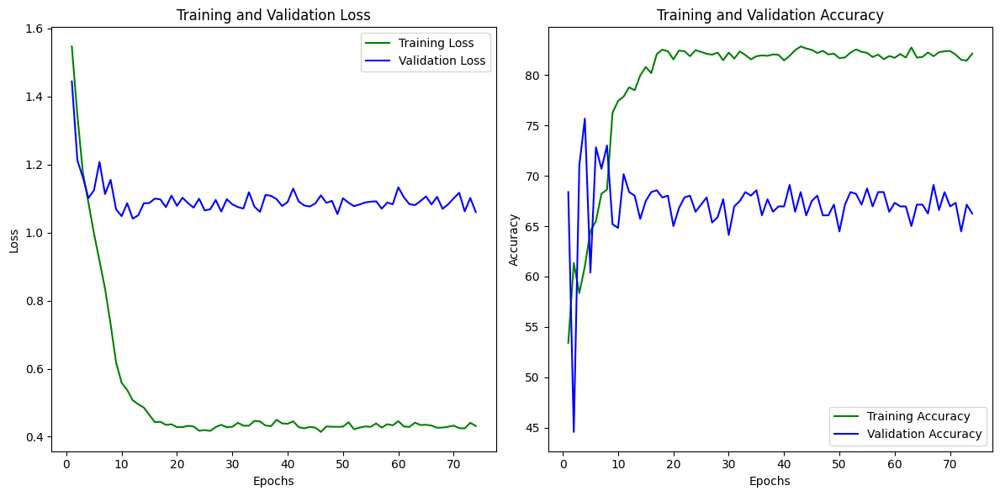


Epoch 75/500
-------------------------------
Epoch: 74, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.247241, correct predictions: 16, total: 16
Batch 70/317 processed, running loss: 32.978834, correct predictions: 922, total: 1136
Batch 140/317 processed, running loss: 63.995229, correct predictions: 1823, total: 2256
Batch 210/317 processed, running loss: 95.461931, correct predictions: 2732, total: 3376
Batch 280/317 processed, running loss: 125.573993, correct predictions: 3653, total: 4496

Training Loss per batch = 0.442689	Accuracy on Training set = 81.568550% [4129/5062]

Validation Loss per batch = 1.078785	Accuracy on Validation set = 69.094139% [389/563]
Train Loss: 0.4427, Train Accuracy: 81.5685
Valid Loss: 1.0788, Valid Accuracy: 69.0941


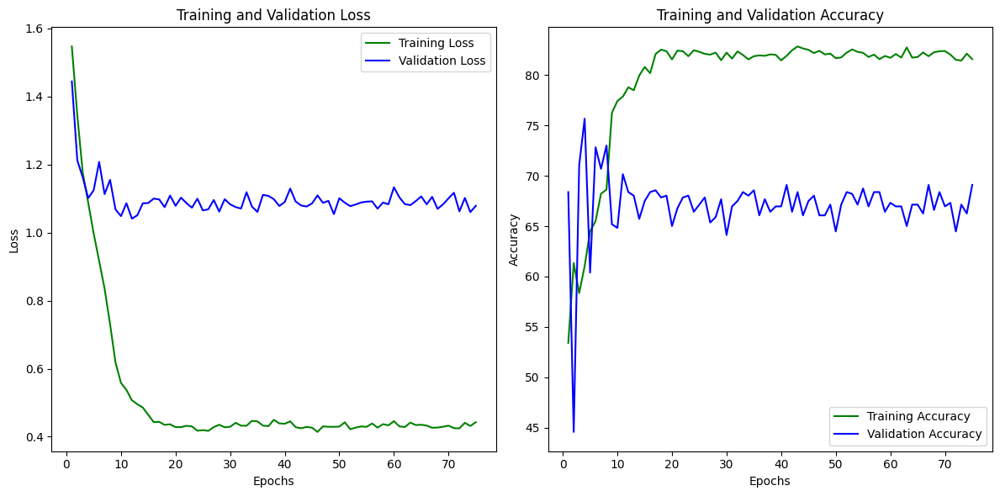


Epoch 76/500
-------------------------------
Epoch: 75, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.276921, correct predictions: 11, total: 16
Batch 70/317 processed, running loss: 30.599870, correct predictions: 928, total: 1136
Batch 140/317 processed, running loss: 61.078724, correct predictions: 1848, total: 2256
Batch 210/317 processed, running loss: 90.501670, correct predictions: 2773, total: 3376
Batch 280/317 processed, running loss: 119.915517, correct predictions: 3696, total: 4496

Training Loss per batch = 0.426294	Accuracy on Training set = 82.378507% [4170/5062]

Validation Loss per batch = 1.093338	Accuracy on Validation set = 68.206039% [384/563]
Train Loss: 0.4263, Train Accuracy: 82.3785
Valid Loss: 1.0933, Valid Accuracy: 68.2060


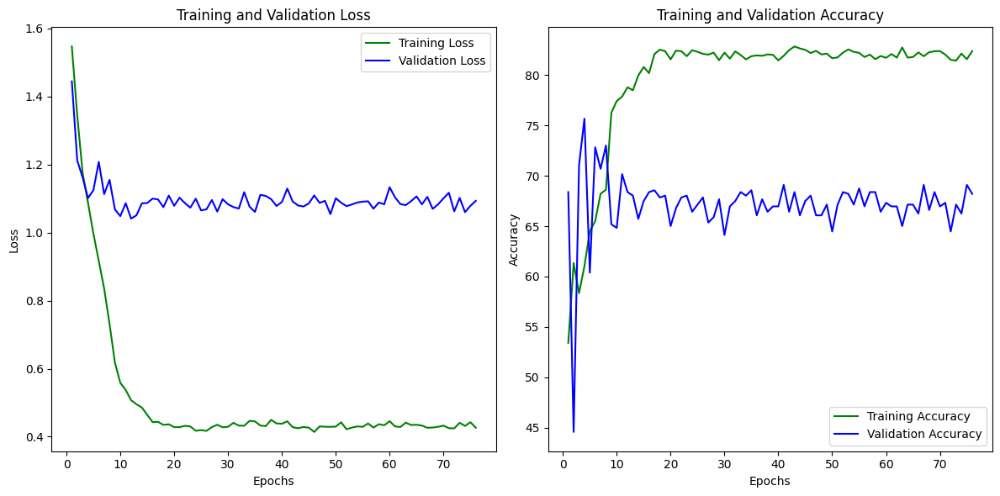


Epoch 77/500
-------------------------------
Epoch: 76, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.329140, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 30.133669, correct predictions: 924, total: 1136
Batch 140/317 processed, running loss: 59.472641, correct predictions: 1850, total: 2256
Batch 210/317 processed, running loss: 90.084092, correct predictions: 2761, total: 3376
Batch 280/317 processed, running loss: 118.148066, correct predictions: 3705, total: 4496

Training Loss per batch = 0.423137	Accuracy on Training set = 82.437772% [4173/5062]

Validation Loss per batch = 1.076494	Accuracy on Validation set = 67.673179% [381/563]
Train Loss: 0.4231, Train Accuracy: 82.4378
Valid Loss: 1.0765, Valid Accuracy: 67.6732


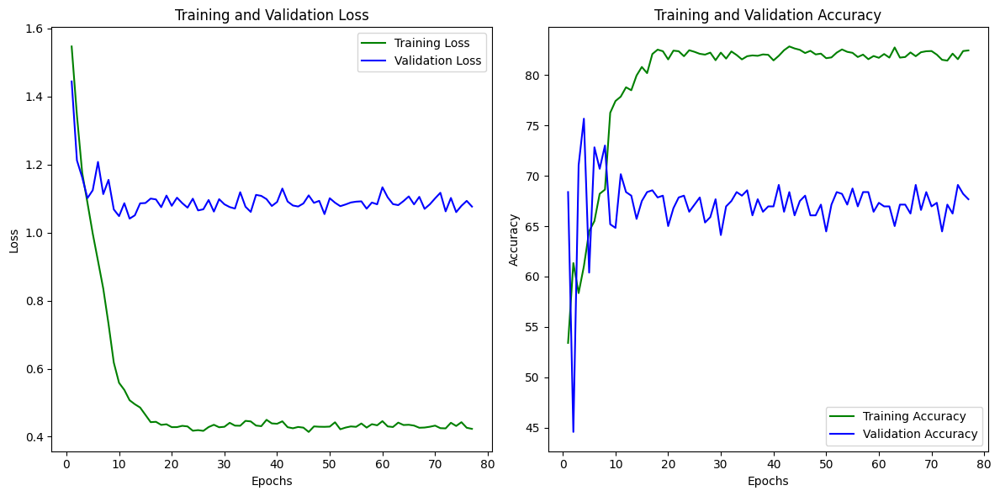


Epoch 78/500
-------------------------------
Epoch: 77, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.254057, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 31.107708, correct predictions: 928, total: 1136
Batch 140/317 processed, running loss: 59.634169, correct predictions: 1859, total: 2256
Batch 210/317 processed, running loss: 89.140044, correct predictions: 2772, total: 3376
Batch 280/317 processed, running loss: 118.837798, correct predictions: 3689, total: 4496

Training Loss per batch = 0.423440	Accuracy on Training set = 81.864876% [4144/5062]

Validation Loss per batch = 1.105877	Accuracy on Validation set = 66.785080% [376/563]
Train Loss: 0.4234, Train Accuracy: 81.8649
Valid Loss: 1.1059, Valid Accuracy: 66.7851


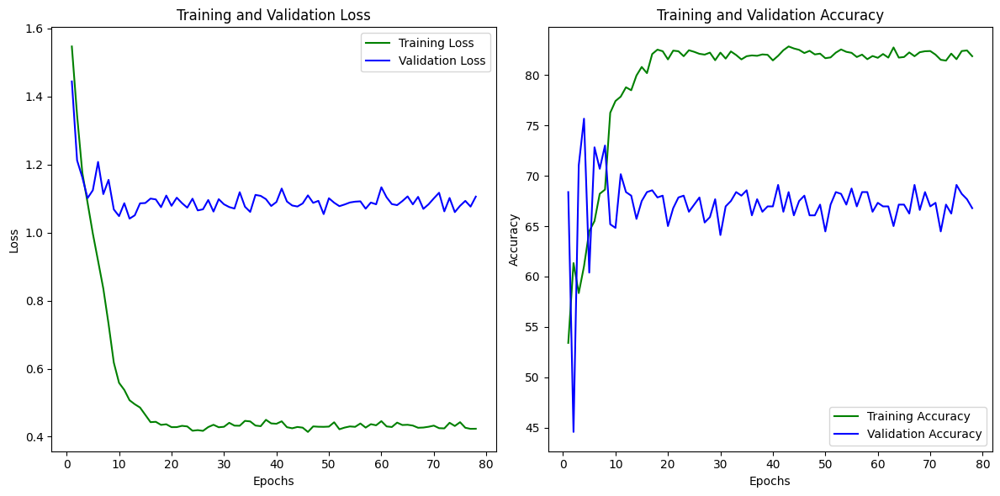


Epoch 79/500
-------------------------------
Epoch: 78, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.302192, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 29.970532, correct predictions: 952, total: 1136
Batch 140/317 processed, running loss: 60.322349, correct predictions: 1878, total: 2256
Batch 210/317 processed, running loss: 90.662591, correct predictions: 2804, total: 3376
Batch 280/317 processed, running loss: 121.673506, correct predictions: 3726, total: 4496

Training Loss per batch = 0.430568	Accuracy on Training set = 82.990913% [4201/5062]

Validation Loss per batch = 1.091944	Accuracy on Validation set = 68.028419% [383/563]
Train Loss: 0.4306, Train Accuracy: 82.9909
Valid Loss: 1.0919, Valid Accuracy: 68.0284


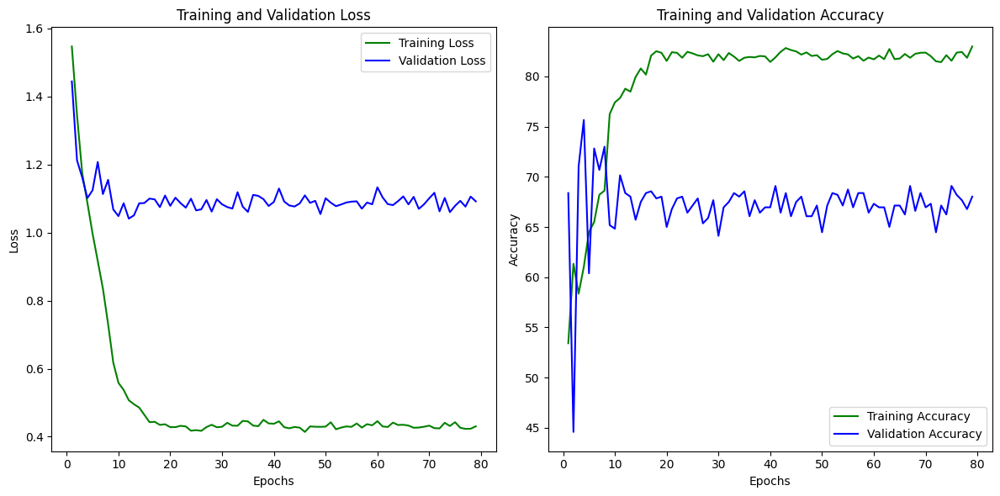


Epoch 80/500
-------------------------------
Epoch: 79, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.628423, correct predictions: 12, total: 16
Batch 70/317 processed, running loss: 31.524094, correct predictions: 938, total: 1136
Batch 140/317 processed, running loss: 62.002289, correct predictions: 1841, total: 2256
Batch 210/317 processed, running loss: 90.615011, correct predictions: 2758, total: 3376
Batch 280/317 processed, running loss: 117.930709, correct predictions: 3685, total: 4496

Training Loss per batch = 0.425121	Accuracy on Training set = 82.042671% [4153/5062]

Validation Loss per batch = 1.107099	Accuracy on Validation set = 66.785080% [376/563]
Train Loss: 0.4251, Train Accuracy: 82.0427
Valid Loss: 1.1071, Valid Accuracy: 66.7851


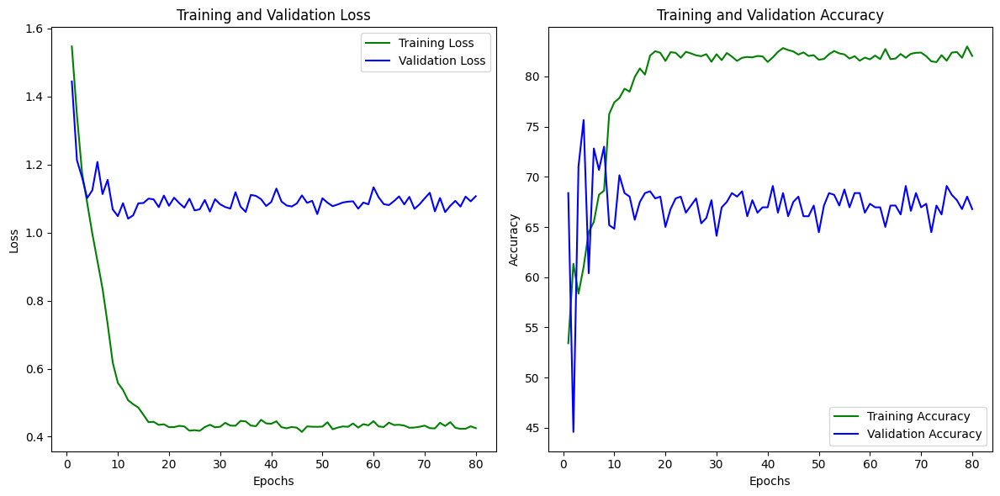


Epoch 81/500
-------------------------------
Epoch: 80, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.451999, correct predictions: 12, total: 16
Batch 70/317 processed, running loss: 29.137656, correct predictions: 916, total: 1136
Batch 140/317 processed, running loss: 56.195688, correct predictions: 1843, total: 2256
Batch 210/317 processed, running loss: 87.186948, correct predictions: 2774, total: 3376
Batch 280/317 processed, running loss: 116.825337, correct predictions: 3698, total: 4496

Training Loss per batch = 0.423112	Accuracy on Training set = 81.805610% [4141/5062]

Validation Loss per batch = 1.101536	Accuracy on Validation set = 64.831261% [365/563]
Train Loss: 0.4231, Train Accuracy: 81.8056
Valid Loss: 1.1015, Valid Accuracy: 64.8313


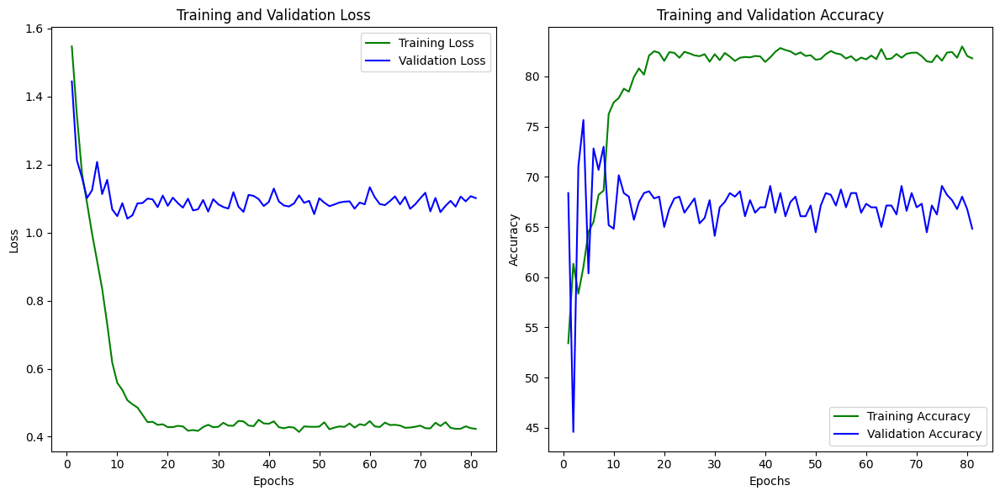


Epoch 82/500
-------------------------------
Epoch: 81, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.582104, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 30.915990, correct predictions: 941, total: 1136
Batch 140/317 processed, running loss: 62.173392, correct predictions: 1855, total: 2256
Batch 210/317 processed, running loss: 92.215687, correct predictions: 2761, total: 3376
Batch 280/317 processed, running loss: 120.648258, correct predictions: 3696, total: 4496

Training Loss per batch = 0.437550	Accuracy on Training set = 81.943896% [4148/5062]

Validation Loss per batch = 1.079350	Accuracy on Validation set = 68.206039% [384/563]
Train Loss: 0.4375, Train Accuracy: 81.9439
Valid Loss: 1.0793, Valid Accuracy: 68.2060


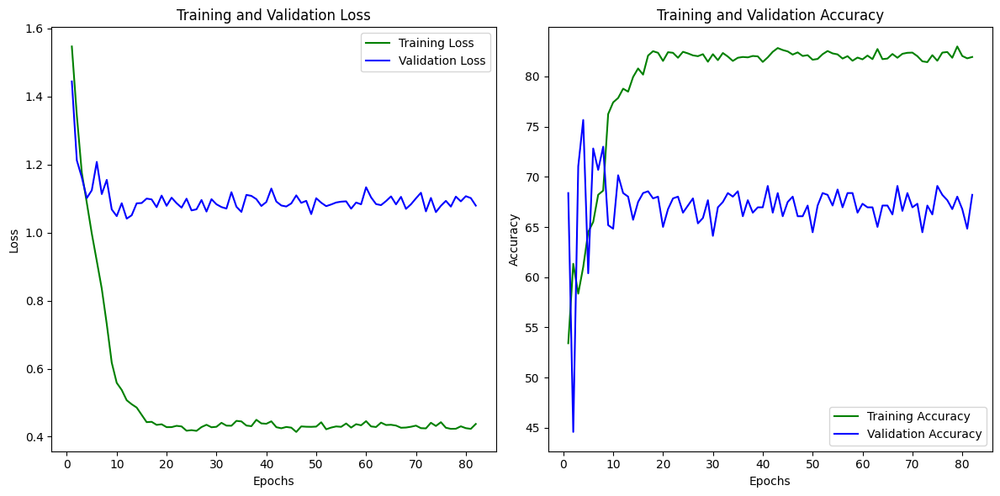


Epoch 83/500
-------------------------------
Epoch: 82, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.185558, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 33.774366, correct predictions: 929, total: 1136
Batch 140/317 processed, running loss: 61.682554, correct predictions: 1846, total: 2256
Batch 210/317 processed, running loss: 90.478985, correct predictions: 2780, total: 3376
Batch 280/317 processed, running loss: 120.777071, correct predictions: 3701, total: 4496

Training Loss per batch = 0.429007	Accuracy on Training set = 82.141446% [4158/5062]

Validation Loss per batch = 1.096818	Accuracy on Validation set = 66.074600% [372/563]
Train Loss: 0.4290, Train Accuracy: 82.1414
Valid Loss: 1.0968, Valid Accuracy: 66.0746


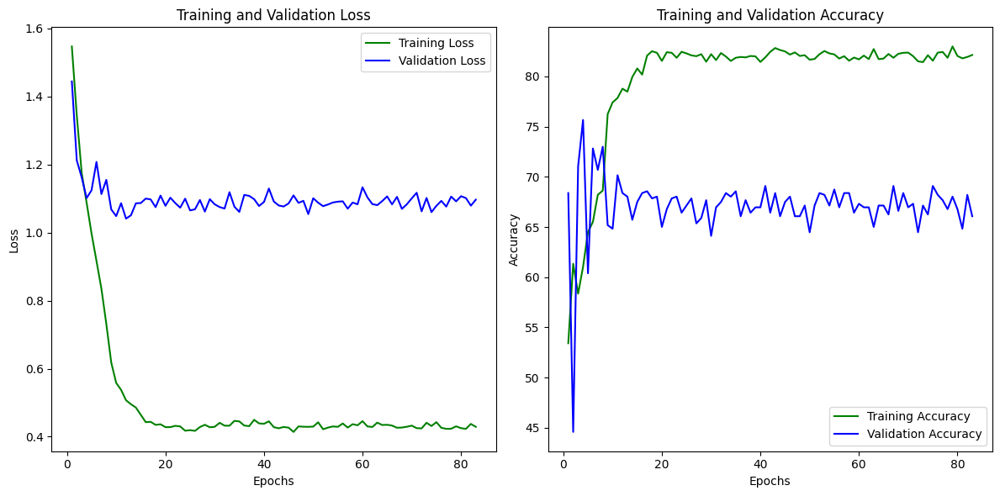


Epoch 84/500
-------------------------------
Epoch: 83, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.560202, correct predictions: 12, total: 16
Batch 70/317 processed, running loss: 31.354055, correct predictions: 924, total: 1136
Batch 140/317 processed, running loss: 62.866234, correct predictions: 1840, total: 2256
Batch 210/317 processed, running loss: 92.923836, correct predictions: 2750, total: 3376
Batch 280/317 processed, running loss: 122.303482, correct predictions: 3661, total: 4496

Training Loss per batch = 0.436201	Accuracy on Training set = 81.212959% [4111/5062]

Validation Loss per batch = 1.085112	Accuracy on Validation set = 66.429840% [374/563]
Train Loss: 0.4362, Train Accuracy: 81.2130
Valid Loss: 1.0851, Valid Accuracy: 66.4298


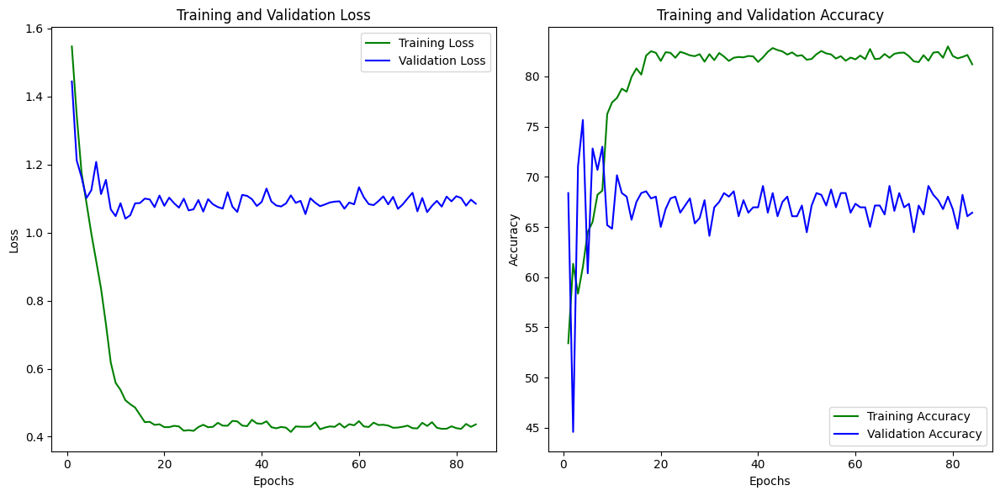


Epoch 85/500
-------------------------------
Epoch: 84, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.572442, correct predictions: 12, total: 16
Batch 70/317 processed, running loss: 31.521999, correct predictions: 931, total: 1136
Batch 140/317 processed, running loss: 58.848206, correct predictions: 1843, total: 2256
Batch 210/317 processed, running loss: 89.479517, correct predictions: 2778, total: 3376
Batch 280/317 processed, running loss: 120.263961, correct predictions: 3699, total: 4496

Training Loss per batch = 0.430647	Accuracy on Training set = 82.101936% [4156/5062]

Validation Loss per batch = 1.085837	Accuracy on Validation set = 66.962700% [377/563]
Train Loss: 0.4306, Train Accuracy: 82.1019
Valid Loss: 1.0858, Valid Accuracy: 66.9627


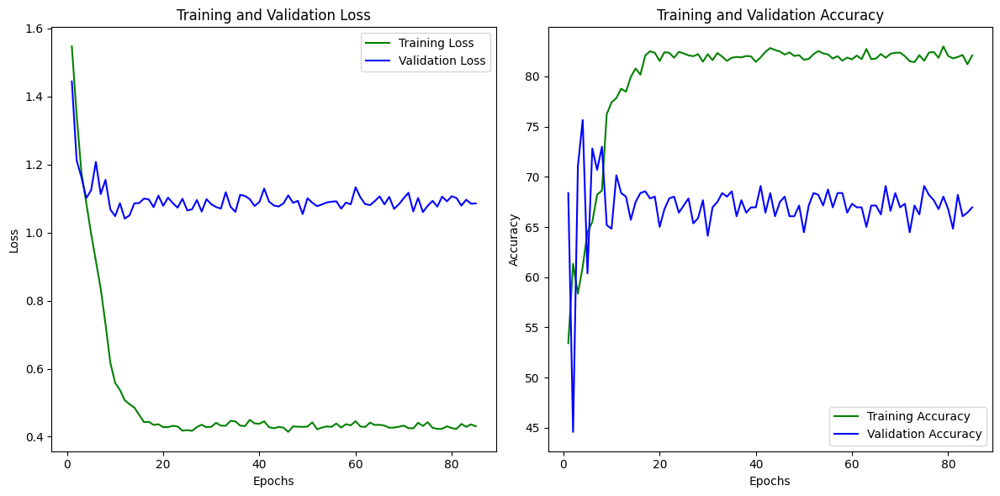


Epoch 86/500
-------------------------------
Epoch: 85, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.185354, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 32.606598, correct predictions: 924, total: 1136
Batch 140/317 processed, running loss: 61.533400, correct predictions: 1872, total: 2256
Batch 210/317 processed, running loss: 92.998805, correct predictions: 2770, total: 3376
Batch 280/317 processed, running loss: 122.260135, correct predictions: 3685, total: 4496

Training Loss per batch = 0.431955	Accuracy on Training set = 82.161201% [4159/5062]

Validation Loss per batch = 1.164809	Accuracy on Validation set = 69.804618% [393/563]
Train Loss: 0.4320, Train Accuracy: 82.1612
Valid Loss: 1.1648, Valid Accuracy: 69.8046


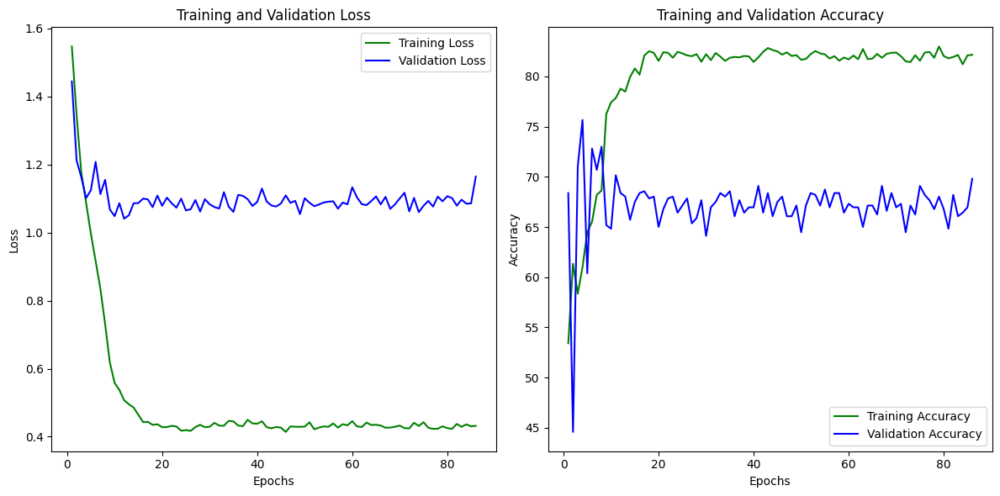


Epoch 87/500
-------------------------------
Epoch: 86, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.400241, correct predictions: 12, total: 16
Batch 70/317 processed, running loss: 31.596698, correct predictions: 945, total: 1136
Batch 140/317 processed, running loss: 61.095374, correct predictions: 1849, total: 2256
Batch 210/317 processed, running loss: 90.908473, correct predictions: 2762, total: 3376
Batch 280/317 processed, running loss: 120.488271, correct predictions: 3697, total: 4496

Training Loss per batch = 0.430501	Accuracy on Training set = 82.062426% [4154/5062]

Validation Loss per batch = 1.127200	Accuracy on Validation set = 67.673179% [381/563]
Train Loss: 0.4305, Train Accuracy: 82.0624
Valid Loss: 1.1272, Valid Accuracy: 67.6732


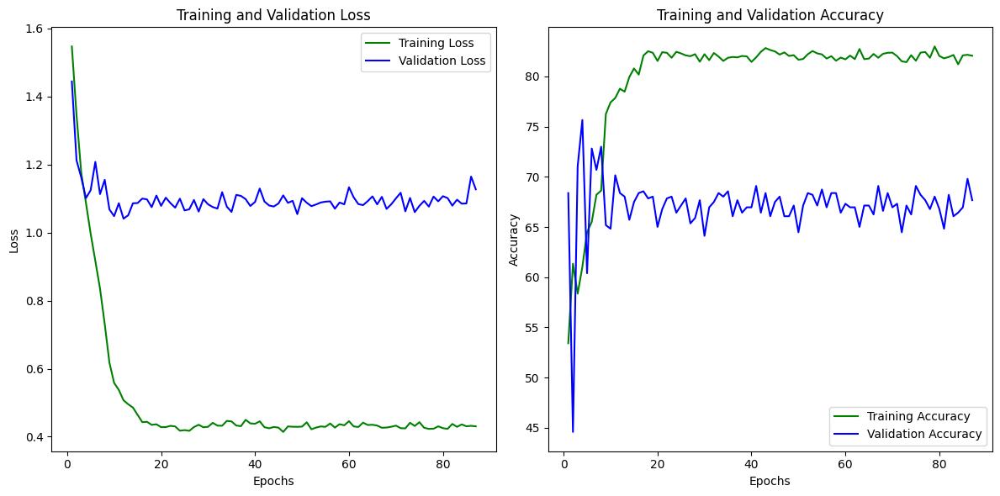


Epoch 88/500
-------------------------------
Epoch: 87, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.288846, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 30.874821, correct predictions: 938, total: 1136
Batch 140/317 processed, running loss: 59.191687, correct predictions: 1858, total: 2256
Batch 210/317 processed, running loss: 89.788724, correct predictions: 2771, total: 3376
Batch 280/317 processed, running loss: 118.255974, correct predictions: 3698, total: 4496

Training Loss per batch = 0.423838	Accuracy on Training set = 82.259976% [4164/5062]

Validation Loss per batch = 1.089327	Accuracy on Validation set = 68.383659% [385/563]
Train Loss: 0.4238, Train Accuracy: 82.2600
Valid Loss: 1.0893, Valid Accuracy: 68.3837


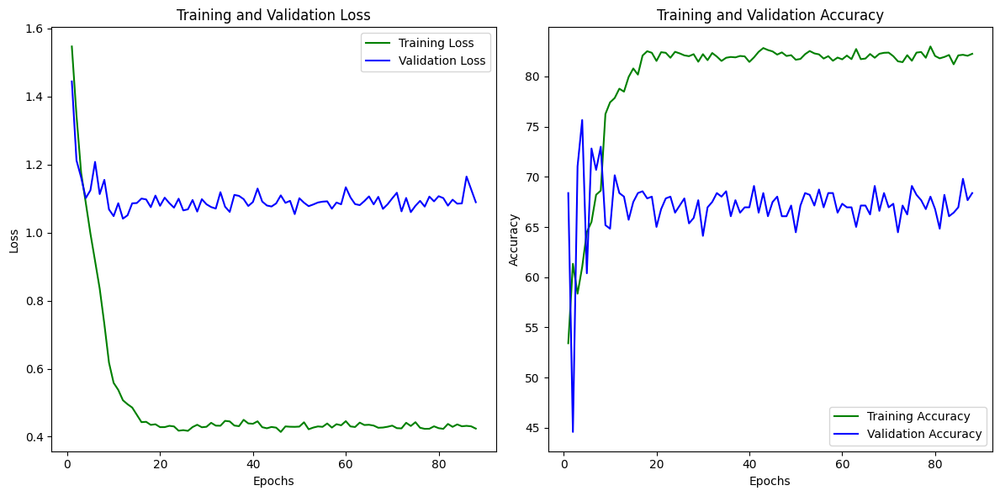


Epoch 89/500
-------------------------------
Epoch: 88, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.267512, correct predictions: 11, total: 16
Batch 70/317 processed, running loss: 32.204168, correct predictions: 940, total: 1136
Batch 140/317 processed, running loss: 61.004269, correct predictions: 1862, total: 2256
Batch 210/317 processed, running loss: 90.032393, correct predictions: 2795, total: 3376
Batch 280/317 processed, running loss: 120.372579, correct predictions: 3700, total: 4496

Training Loss per batch = 0.429179	Accuracy on Training set = 82.457527% [4174/5062]

Validation Loss per batch = 1.079967	Accuracy on Validation set = 65.008881% [366/563]
Train Loss: 0.4292, Train Accuracy: 82.4575
Valid Loss: 1.0800, Valid Accuracy: 65.0089


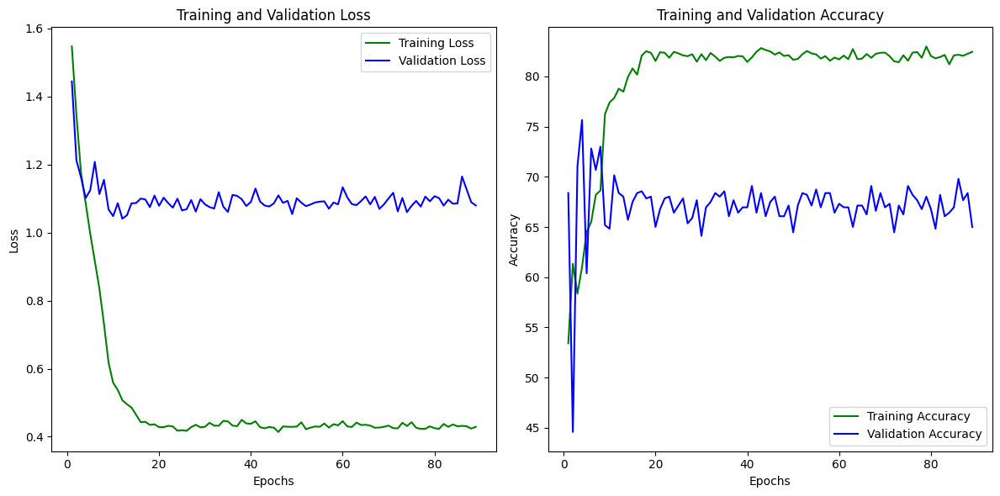


Epoch 90/500
-------------------------------
Epoch: 89, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.223827, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 30.282178, correct predictions: 926, total: 1136
Batch 140/317 processed, running loss: 60.686591, correct predictions: 1848, total: 2256
Batch 210/317 processed, running loss: 91.882514, correct predictions: 2770, total: 3376
Batch 280/317 processed, running loss: 121.777629, correct predictions: 3684, total: 4496

Training Loss per batch = 0.430532	Accuracy on Training set = 82.042671% [4153/5062]

Validation Loss per batch = 1.100157	Accuracy on Validation set = 66.962700% [377/563]
Train Loss: 0.4305, Train Accuracy: 82.0427
Valid Loss: 1.1002, Valid Accuracy: 66.9627


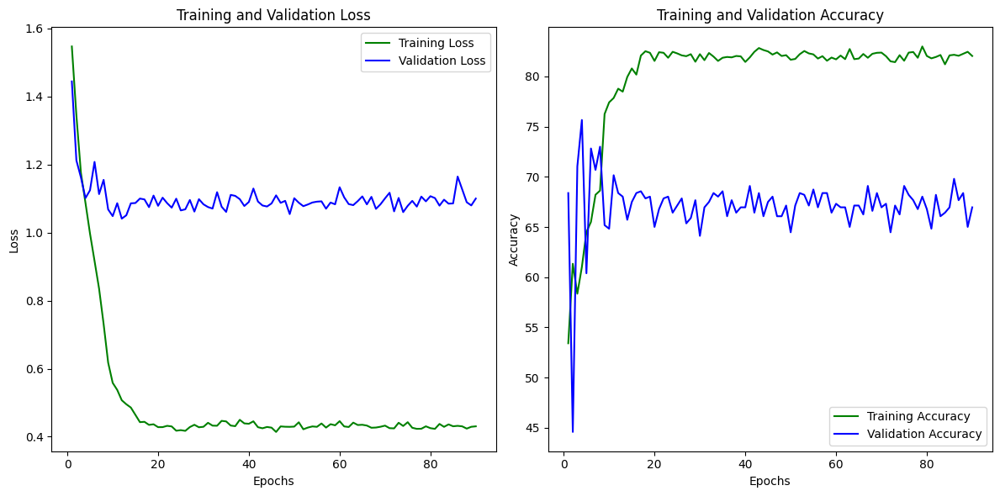


Epoch 91/500
-------------------------------
Epoch: 90, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.534228, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 29.324812, correct predictions: 933, total: 1136
Batch 140/317 processed, running loss: 56.183487, correct predictions: 1867, total: 2256
Batch 210/317 processed, running loss: 86.635058, correct predictions: 2781, total: 3376
Batch 280/317 processed, running loss: 119.323834, correct predictions: 3676, total: 4496

Training Loss per batch = 0.423380	Accuracy on Training set = 81.706835% [4136/5062]

Validation Loss per batch = 1.095202	Accuracy on Validation set = 66.252220% [373/563]
Train Loss: 0.4234, Train Accuracy: 81.7068
Valid Loss: 1.0952, Valid Accuracy: 66.2522


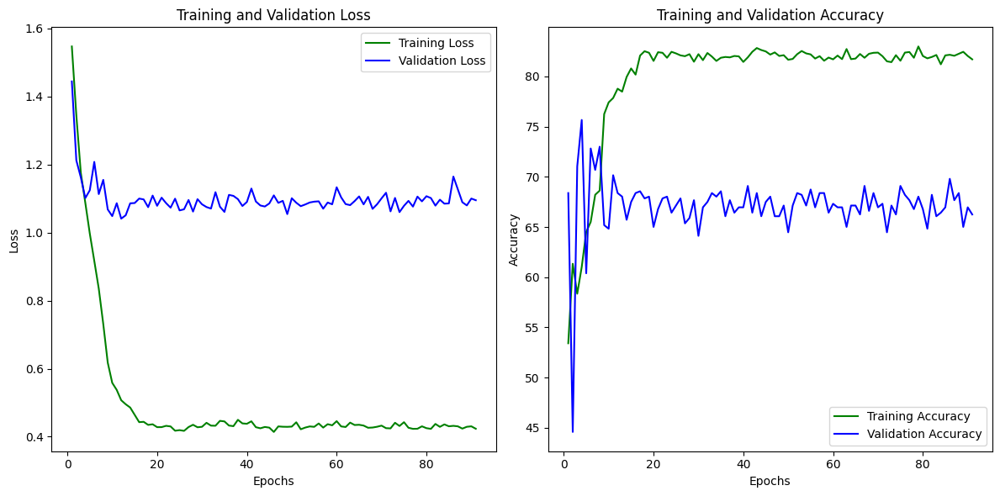


Epoch 92/500
-------------------------------
Epoch: 91, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.247233, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 28.170297, correct predictions: 939, total: 1136
Batch 140/317 processed, running loss: 57.911820, correct predictions: 1846, total: 2256
Batch 210/317 processed, running loss: 91.317789, correct predictions: 2748, total: 3376
Batch 280/317 processed, running loss: 121.515553, correct predictions: 3656, total: 4496

Training Loss per batch = 0.435475	Accuracy on Training set = 81.489530% [4125/5062]

Validation Loss per batch = 1.083176	Accuracy on Validation set = 65.896980% [371/563]
Train Loss: 0.4355, Train Accuracy: 81.4895
Valid Loss: 1.0832, Valid Accuracy: 65.8970


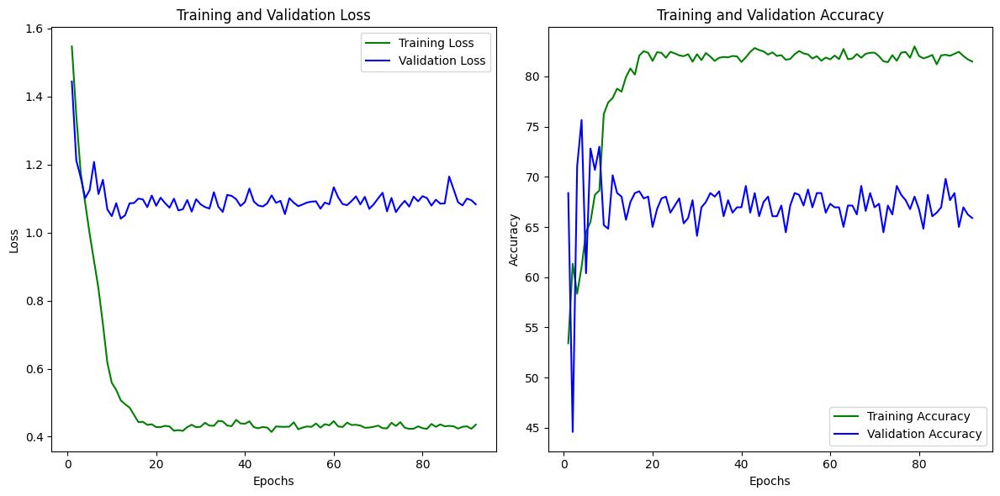


Epoch 93/500
-------------------------------
Epoch: 92, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 1.145756, correct predictions: 11, total: 16
Batch 70/317 processed, running loss: 33.054695, correct predictions: 927, total: 1136
Batch 140/317 processed, running loss: 62.309637, correct predictions: 1839, total: 2256
Batch 210/317 processed, running loss: 94.260094, correct predictions: 2750, total: 3376
Batch 280/317 processed, running loss: 123.457740, correct predictions: 3667, total: 4496

Training Loss per batch = 0.439298	Accuracy on Training set = 81.469775% [4124/5062]

Validation Loss per batch = 1.107969	Accuracy on Validation set = 67.495560% [380/563]
Train Loss: 0.4393, Train Accuracy: 81.4698
Valid Loss: 1.1080, Valid Accuracy: 67.4956


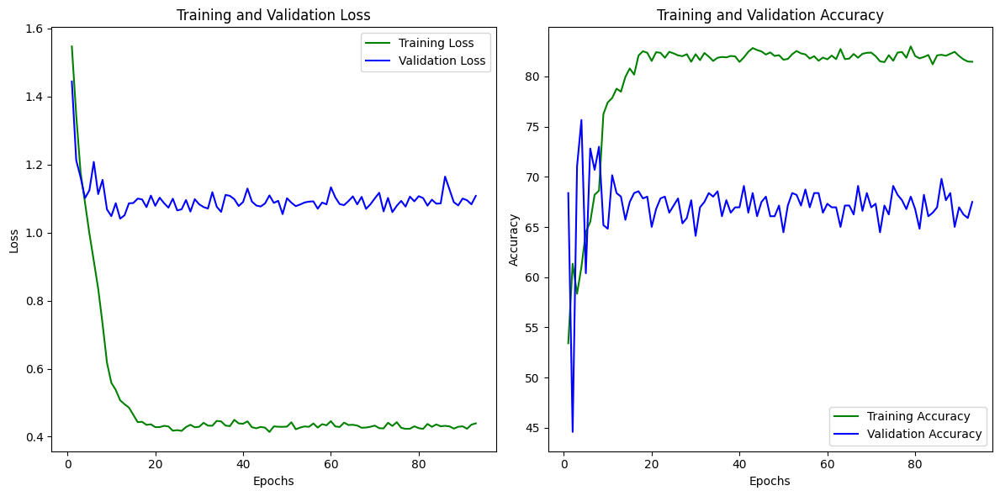


Epoch 94/500
-------------------------------
Epoch: 93, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.314244, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 30.492913, correct predictions: 946, total: 1136
Batch 140/317 processed, running loss: 60.795847, correct predictions: 1867, total: 2256
Batch 210/317 processed, running loss: 91.399551, correct predictions: 2781, total: 3376
Batch 280/317 processed, running loss: 121.850207, correct predictions: 3692, total: 4496

Training Loss per batch = 0.429181	Accuracy on Training set = 82.457527% [4174/5062]

Validation Loss per batch = 1.082430	Accuracy on Validation set = 68.028419% [383/563]
Train Loss: 0.4292, Train Accuracy: 82.4575
Valid Loss: 1.0824, Valid Accuracy: 68.0284


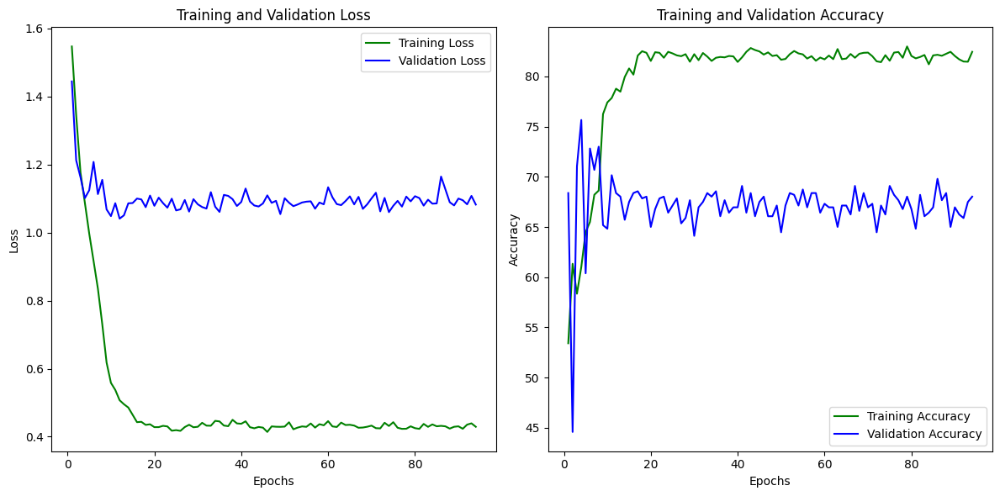


Epoch 95/500
-------------------------------
Epoch: 94, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.258312, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 28.064714, correct predictions: 942, total: 1136
Batch 140/317 processed, running loss: 58.212414, correct predictions: 1863, total: 2256
Batch 210/317 processed, running loss: 90.002011, correct predictions: 2776, total: 3376
Batch 280/317 processed, running loss: 124.647387, correct predictions: 3669, total: 4496

Training Loss per batch = 0.434337	Accuracy on Training set = 81.726590% [4137/5062]

Validation Loss per batch = 1.114033	Accuracy on Validation set = 66.962700% [377/563]
Train Loss: 0.4343, Train Accuracy: 81.7266
Valid Loss: 1.1140, Valid Accuracy: 66.9627


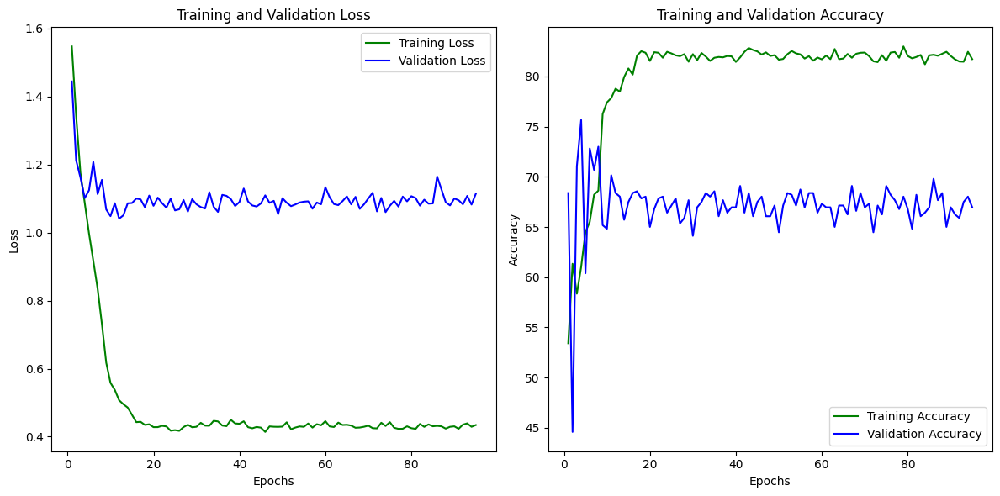


Epoch 96/500
-------------------------------
Epoch: 95, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.266885, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 32.629402, correct predictions: 932, total: 1136
Batch 140/317 processed, running loss: 66.363971, correct predictions: 1821, total: 2256
Batch 210/317 processed, running loss: 95.873973, correct predictions: 2747, total: 3376
Batch 280/317 processed, running loss: 123.625391, correct predictions: 3664, total: 4496

Training Loss per batch = 0.442073	Accuracy on Training set = 81.588305% [4130/5062]

Validation Loss per batch = 1.078712	Accuracy on Validation set = 67.673179% [381/563]
Train Loss: 0.4421, Train Accuracy: 81.5883
Valid Loss: 1.0787, Valid Accuracy: 67.6732


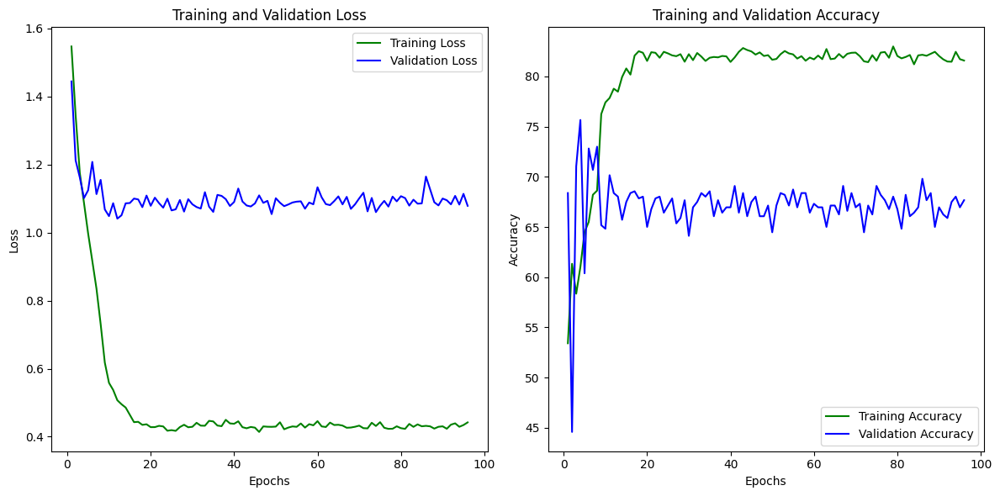


Epoch 97/500
-------------------------------
Epoch: 96, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.419668, correct predictions: 10, total: 16
Batch 70/317 processed, running loss: 30.469148, correct predictions: 935, total: 1136
Batch 140/317 processed, running loss: 60.888565, correct predictions: 1852, total: 2256
Batch 210/317 processed, running loss: 88.627146, correct predictions: 2783, total: 3376
Batch 280/317 processed, running loss: 121.931334, correct predictions: 3693, total: 4496

Training Loss per batch = 0.429909	Accuracy on Training set = 81.904386% [4146/5062]

Validation Loss per batch = 1.121634	Accuracy on Validation set = 66.785080% [376/563]
Train Loss: 0.4299, Train Accuracy: 81.9044
Valid Loss: 1.1216, Valid Accuracy: 66.7851


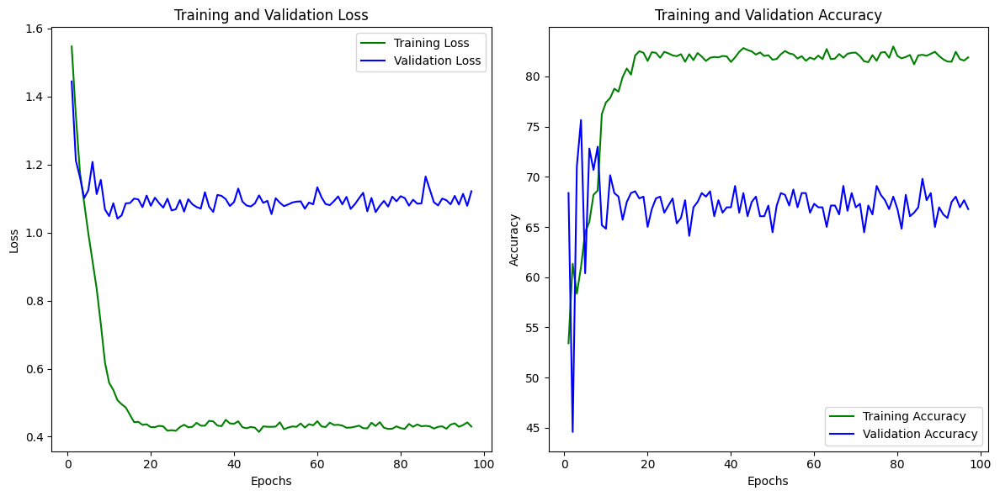


Epoch 98/500
-------------------------------
Epoch: 97, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.611136, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 33.183997, correct predictions: 914, total: 1136
Batch 140/317 processed, running loss: 63.906858, correct predictions: 1827, total: 2256
Batch 210/317 processed, running loss: 93.461285, correct predictions: 2756, total: 3376
Batch 280/317 processed, running loss: 124.800902, correct predictions: 3700, total: 4496

Training Loss per batch = 0.436240	Accuracy on Training set = 82.576057% [4180/5062]

Validation Loss per batch = 1.077562	Accuracy on Validation set = 65.896980% [371/563]
Train Loss: 0.4362, Train Accuracy: 82.5761
Valid Loss: 1.0776, Valid Accuracy: 65.8970


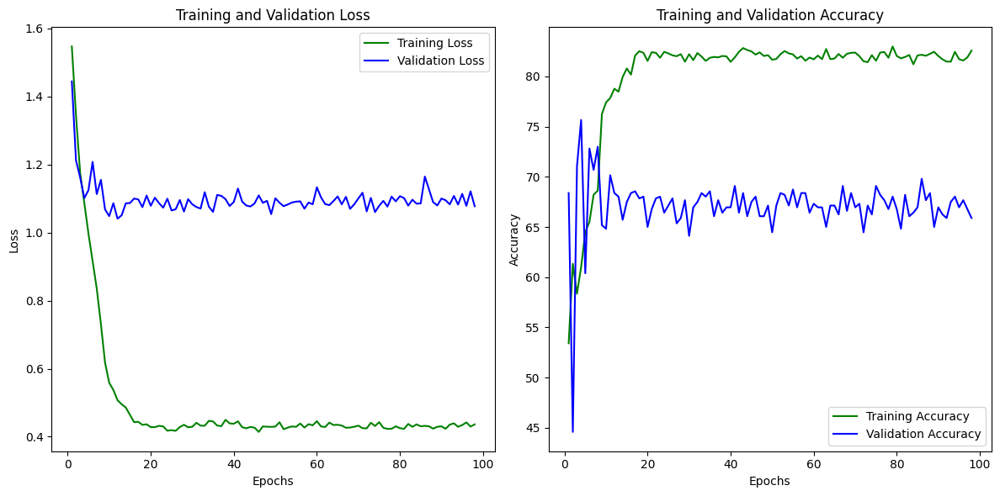


Epoch 99/500
-------------------------------
Epoch: 98, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.306615, correct predictions: 16, total: 16
Batch 70/317 processed, running loss: 30.646254, correct predictions: 932, total: 1136
Batch 140/317 processed, running loss: 61.088315, correct predictions: 1840, total: 2256
Batch 210/317 processed, running loss: 90.671016, correct predictions: 2756, total: 3376
Batch 280/317 processed, running loss: 124.283020, correct predictions: 3663, total: 4496

Training Loss per batch = 0.440448	Accuracy on Training set = 81.766100% [4139/5062]

Validation Loss per batch = 1.072450	Accuracy on Validation set = 67.317940% [379/563]
Train Loss: 0.4404, Train Accuracy: 81.7661
Valid Loss: 1.0725, Valid Accuracy: 67.3179


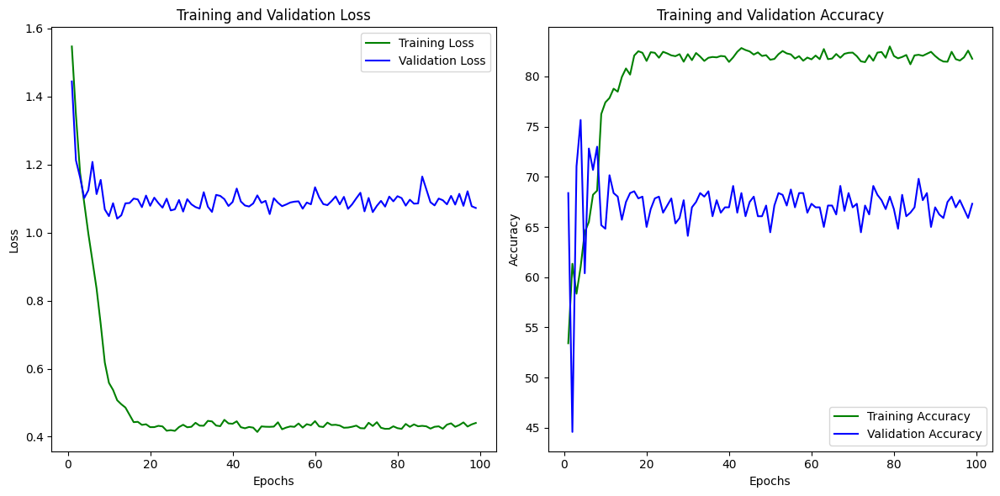


Epoch 100/500
-------------------------------
Epoch: 99, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.518909, correct predictions: 11, total: 16
Batch 70/317 processed, running loss: 33.007831, correct predictions: 931, total: 1136
Batch 140/317 processed, running loss: 60.957944, correct predictions: 1842, total: 2256
Batch 210/317 processed, running loss: 95.669284, correct predictions: 2751, total: 3376
Batch 280/317 processed, running loss: 124.811932, correct predictions: 3681, total: 4496

Training Loss per batch = 0.438388	Accuracy on Training set = 81.983406% [4150/5062]

Validation Loss per batch = 1.120359	Accuracy on Validation set = 67.673179% [381/563]
Train Loss: 0.4384, Train Accuracy: 81.9834
Valid Loss: 1.1204, Valid Accuracy: 67.6732


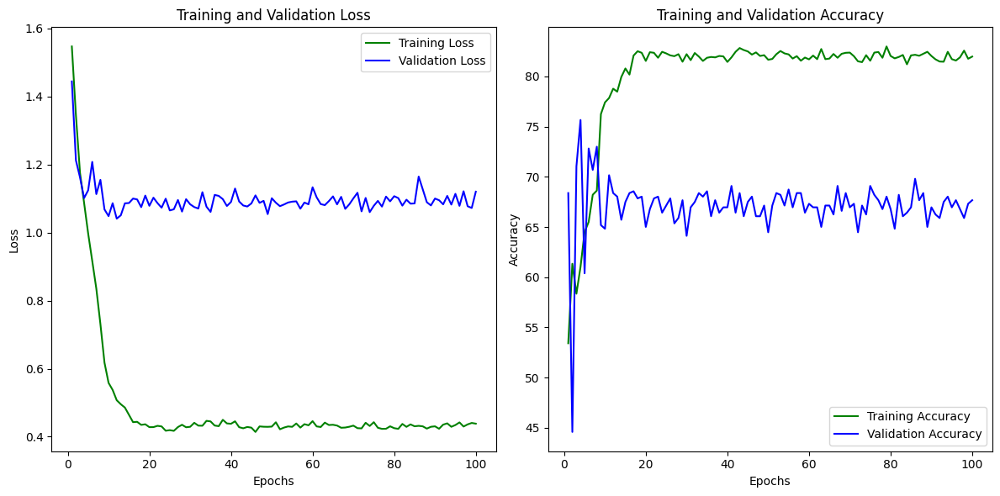


Epoch 101/500
-------------------------------
Epoch: 100, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.733787, correct predictions: 10, total: 16
Batch 70/317 processed, running loss: 33.102802, correct predictions: 919, total: 1136
Batch 140/317 processed, running loss: 63.074890, correct predictions: 1846, total: 2256
Batch 210/317 processed, running loss: 92.918484, correct predictions: 2765, total: 3376
Batch 280/317 processed, running loss: 124.790941, correct predictions: 3680, total: 4496

Training Loss per batch = 0.443714	Accuracy on Training set = 81.706835% [4136/5062]

Validation Loss per batch = 1.092450	Accuracy on Validation set = 66.607460% [375/563]
Train Loss: 0.4437, Train Accuracy: 81.7068
Valid Loss: 1.0924, Valid Accuracy: 66.6075


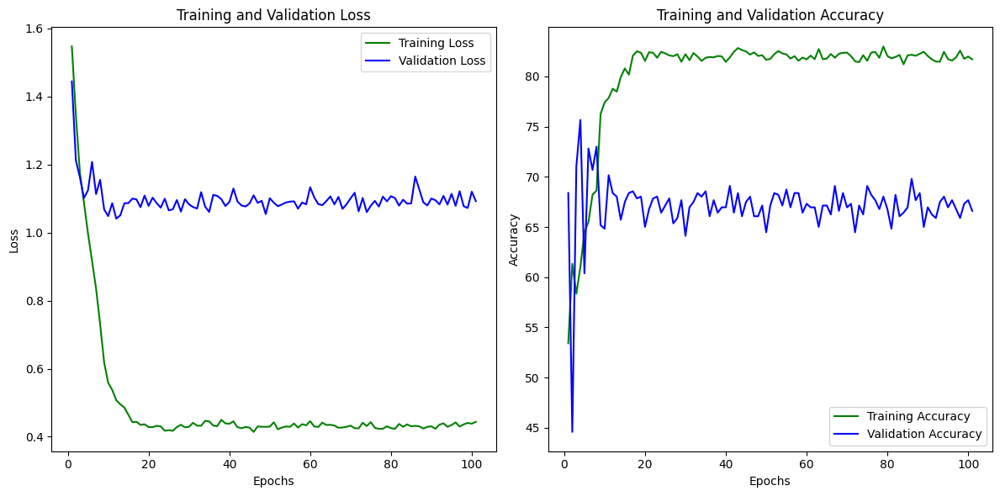


Epoch 102/500
-------------------------------
Epoch: 101, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.197082, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 31.278986, correct predictions: 916, total: 1136
Batch 140/317 processed, running loss: 62.205895, correct predictions: 1829, total: 2256
Batch 210/317 processed, running loss: 90.619595, correct predictions: 2758, total: 3376
Batch 280/317 processed, running loss: 121.406987, correct predictions: 3669, total: 4496

Training Loss per batch = 0.436799	Accuracy on Training set = 81.627815% [4132/5062]

Validation Loss per batch = 1.081568	Accuracy on Validation set = 67.140320% [378/563]
Train Loss: 0.4368, Train Accuracy: 81.6278
Valid Loss: 1.0816, Valid Accuracy: 67.1403


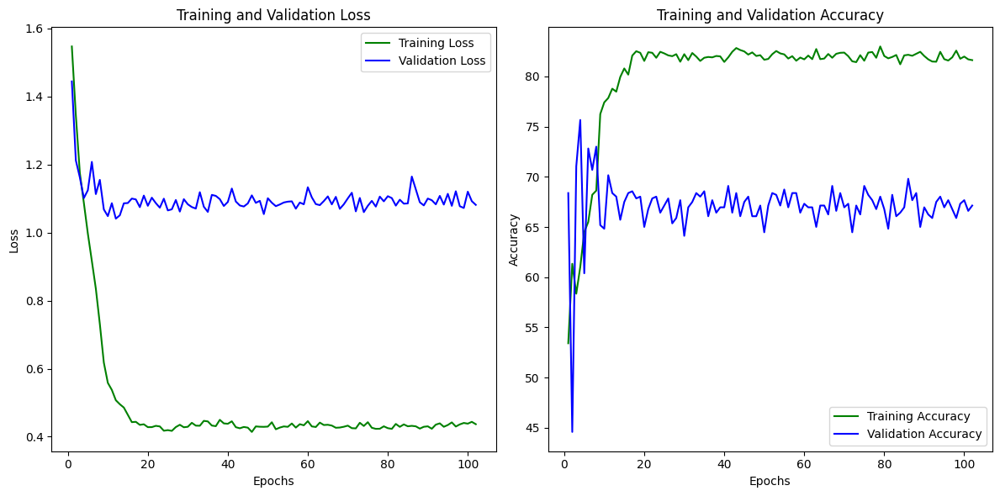


Epoch 103/500
-------------------------------
Epoch: 102, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.646160, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 32.317016, correct predictions: 928, total: 1136
Batch 140/317 processed, running loss: 59.003836, correct predictions: 1868, total: 2256
Batch 210/317 processed, running loss: 90.855411, correct predictions: 2761, total: 3376
Batch 280/317 processed, running loss: 120.450004, correct predictions: 3686, total: 4496

Training Loss per batch = 0.431957	Accuracy on Training set = 81.805610% [4141/5062]

Validation Loss per batch = 1.076788	Accuracy on Validation set = 68.738899% [387/563]
Train Loss: 0.4320, Train Accuracy: 81.8056
Valid Loss: 1.0768, Valid Accuracy: 68.7389


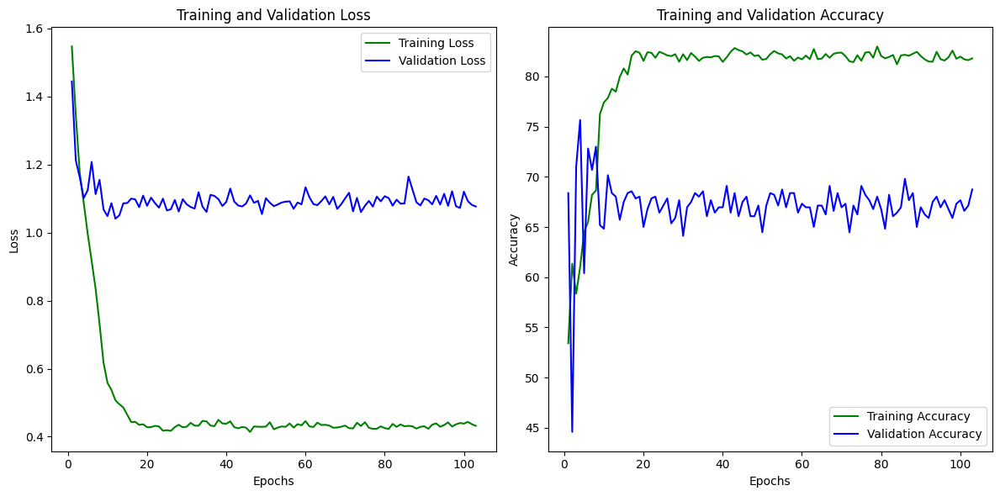


Epoch 104/500
-------------------------------
Epoch: 103, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.257613, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 30.970542, correct predictions: 940, total: 1136
Batch 140/317 processed, running loss: 58.825917, correct predictions: 1890, total: 2256
Batch 210/317 processed, running loss: 91.358802, correct predictions: 2784, total: 3376
Batch 280/317 processed, running loss: 121.315353, correct predictions: 3703, total: 4496

Training Loss per batch = 0.423766	Accuracy on Training set = 82.338996% [4168/5062]

Validation Loss per batch = 1.084545	Accuracy on Validation set = 68.738899% [387/563]
Train Loss: 0.4238, Train Accuracy: 82.3390
Valid Loss: 1.0845, Valid Accuracy: 68.7389


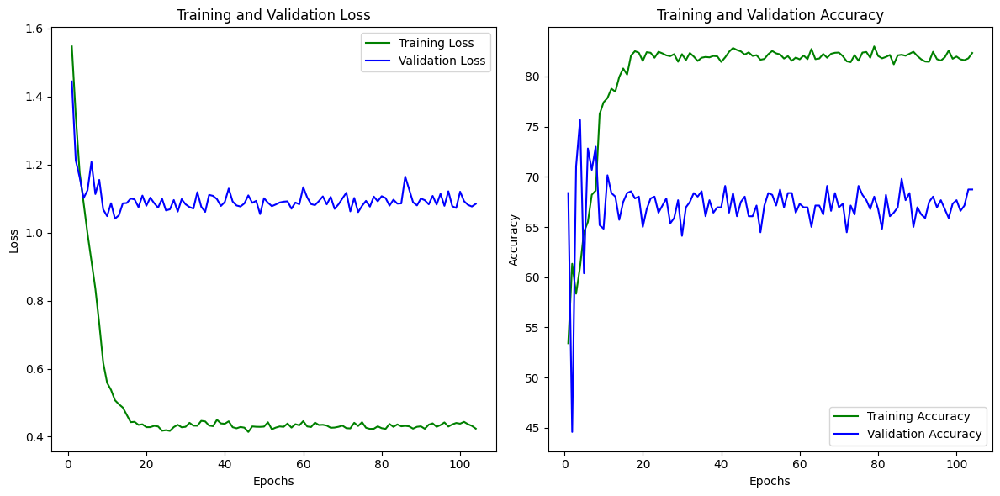


Epoch 105/500
-------------------------------
Epoch: 104, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.389271, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 29.697101, correct predictions: 937, total: 1136
Batch 140/317 processed, running loss: 60.905745, correct predictions: 1836, total: 2256
Batch 210/317 processed, running loss: 91.873887, correct predictions: 2764, total: 3376
Batch 280/317 processed, running loss: 121.970783, correct predictions: 3686, total: 4496

Training Loss per batch = 0.429252	Accuracy on Training set = 81.805610% [4141/5062]

Validation Loss per batch = 1.081529	Accuracy on Validation set = 68.206039% [384/563]
Train Loss: 0.4293, Train Accuracy: 81.8056
Valid Loss: 1.0815, Valid Accuracy: 68.2060


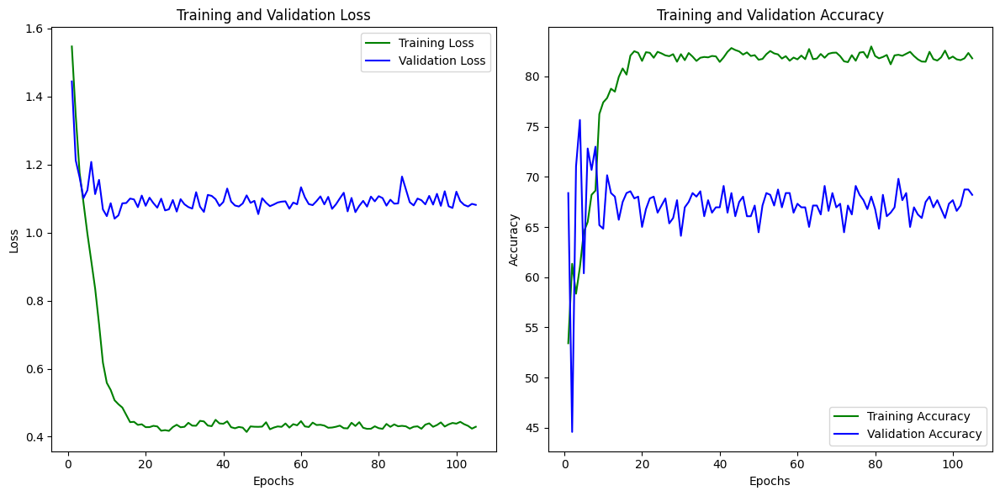


Epoch 106/500
-------------------------------
Epoch: 105, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.386642, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 31.129922, correct predictions: 923, total: 1136
Batch 140/317 processed, running loss: 63.521040, correct predictions: 1836, total: 2256
Batch 210/317 processed, running loss: 92.836563, correct predictions: 2752, total: 3376
Batch 280/317 processed, running loss: 122.451792, correct predictions: 3672, total: 4496

Training Loss per batch = 0.428936	Accuracy on Training set = 81.864876% [4144/5062]

Validation Loss per batch = 1.089293	Accuracy on Validation set = 66.962700% [377/563]
Train Loss: 0.4289, Train Accuracy: 81.8649
Valid Loss: 1.0893, Valid Accuracy: 66.9627


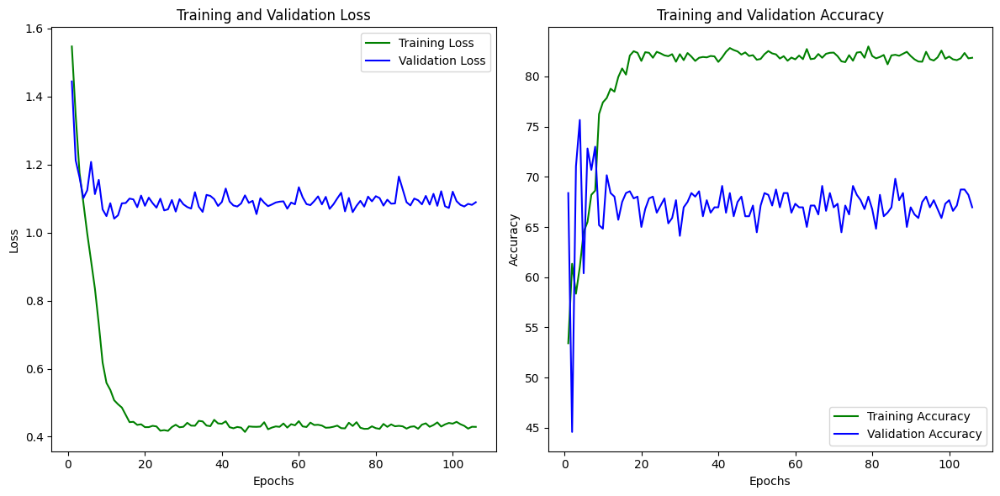


Epoch 107/500
-------------------------------
Epoch: 106, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.874919, correct predictions: 11, total: 16
Batch 70/317 processed, running loss: 32.306151, correct predictions: 925, total: 1136
Batch 140/317 processed, running loss: 63.148294, correct predictions: 1847, total: 2256
Batch 210/317 processed, running loss: 92.545814, correct predictions: 2783, total: 3376
Batch 280/317 processed, running loss: 120.600009, correct predictions: 3714, total: 4496

Training Loss per batch = 0.426426	Accuracy on Training set = 82.516792% [4177/5062]

Validation Loss per batch = 1.079286	Accuracy on Validation set = 67.140320% [378/563]
Train Loss: 0.4264, Train Accuracy: 82.5168
Valid Loss: 1.0793, Valid Accuracy: 67.1403


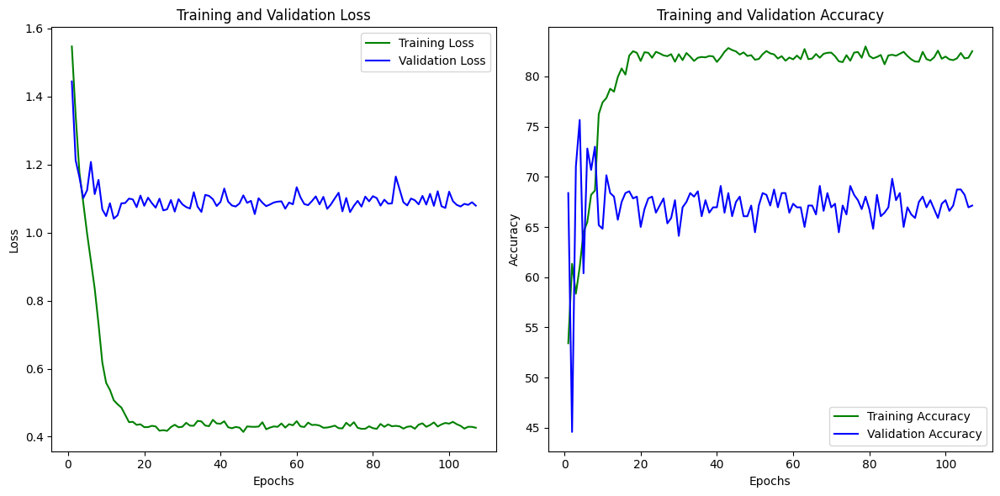


Epoch 108/500
-------------------------------
Epoch: 107, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.147397, correct predictions: 15, total: 16
Batch 70/317 processed, running loss: 31.624451, correct predictions: 937, total: 1136
Batch 140/317 processed, running loss: 59.947950, correct predictions: 1853, total: 2256
Batch 210/317 processed, running loss: 88.630352, correct predictions: 2766, total: 3376
Batch 280/317 processed, running loss: 118.160655, correct predictions: 3701, total: 4496

Training Loss per batch = 0.418177	Accuracy on Training set = 82.556302% [4179/5062]

Validation Loss per batch = 1.070670	Accuracy on Validation set = 65.719361% [370/563]
Train Loss: 0.4182, Train Accuracy: 82.5563
Valid Loss: 1.0707, Valid Accuracy: 65.7194


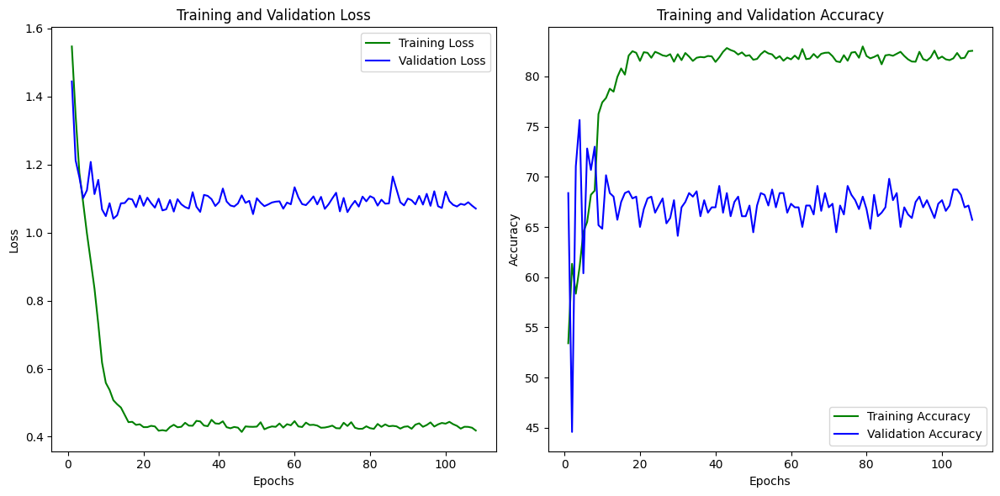


Epoch 109/500
-------------------------------
Epoch: 108, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.691559, correct predictions: 11, total: 16
Batch 70/317 processed, running loss: 31.265206, correct predictions: 934, total: 1136
Batch 140/317 processed, running loss: 62.840566, correct predictions: 1845, total: 2256
Batch 210/317 processed, running loss: 91.782277, correct predictions: 2774, total: 3376
Batch 280/317 processed, running loss: 121.294767, correct predictions: 3702, total: 4496

Training Loss per batch = 0.440522	Accuracy on Training set = 81.825365% [4142/5062]

Validation Loss per batch = 1.155888	Accuracy on Validation set = 68.738899% [387/563]
Train Loss: 0.4405, Train Accuracy: 81.8254
Valid Loss: 1.1559, Valid Accuracy: 68.7389


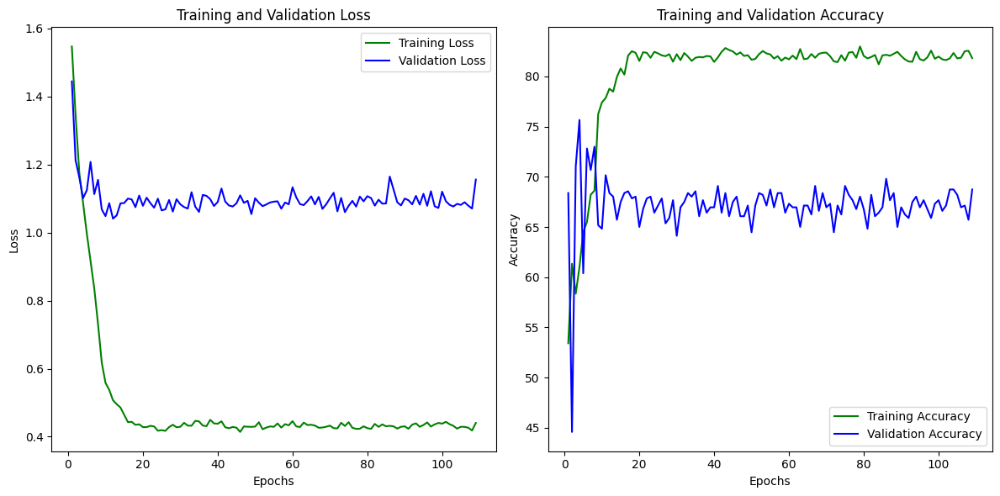


Epoch 110/500
-------------------------------
Epoch: 109, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.279688, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 28.206098, correct predictions: 951, total: 1136
Batch 140/317 processed, running loss: 57.637676, correct predictions: 1891, total: 2256
Batch 210/317 processed, running loss: 90.348813, correct predictions: 2795, total: 3376
Batch 280/317 processed, running loss: 120.335456, correct predictions: 3718, total: 4496

Training Loss per batch = 0.425222	Accuracy on Training set = 82.595812% [4181/5062]

Validation Loss per batch = 1.097849	Accuracy on Validation set = 66.252220% [373/563]
Train Loss: 0.4252, Train Accuracy: 82.5958
Valid Loss: 1.0978, Valid Accuracy: 66.2522


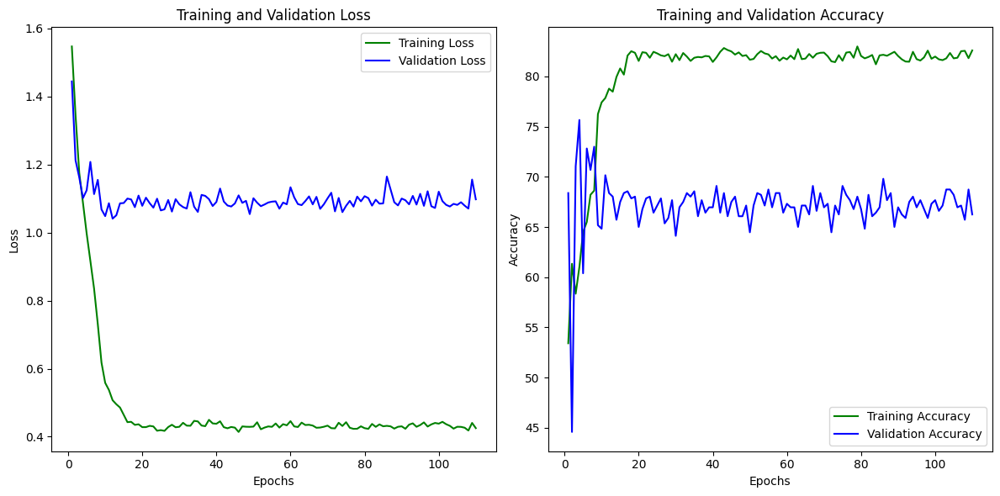


Epoch 111/500
-------------------------------
Epoch: 110, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.482525, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 31.538529, correct predictions: 905, total: 1136
Batch 140/317 processed, running loss: 60.367267, correct predictions: 1852, total: 2256
Batch 210/317 processed, running loss: 90.903591, correct predictions: 2750, total: 3376
Batch 280/317 processed, running loss: 121.371848, correct predictions: 3651, total: 4496

Training Loss per batch = 0.430357	Accuracy on Training set = 81.351245% [4118/5062]

Validation Loss per batch = 1.098100	Accuracy on Validation set = 69.271758% [390/563]
Train Loss: 0.4304, Train Accuracy: 81.3512
Valid Loss: 1.0981, Valid Accuracy: 69.2718


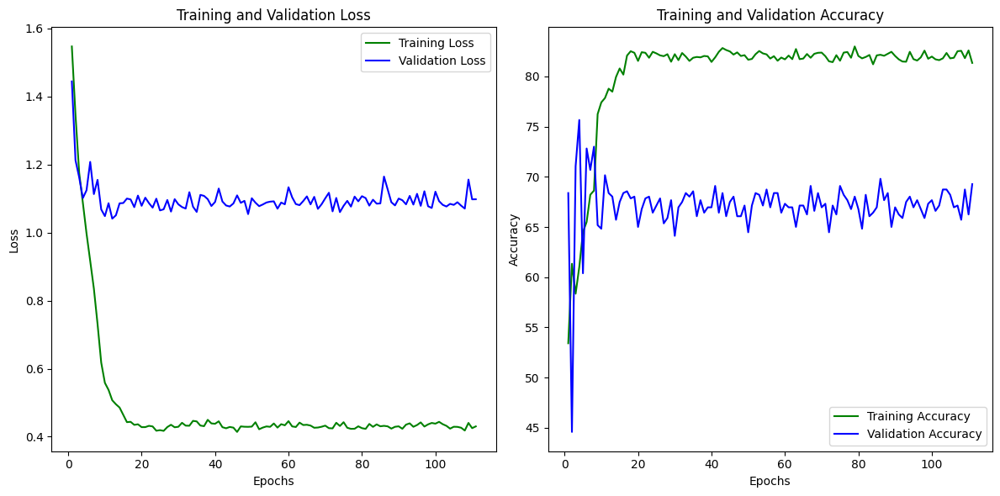


Epoch 112/500
-------------------------------
Epoch: 111, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.409806, correct predictions: 13, total: 16
Batch 70/317 processed, running loss: 29.910323, correct predictions: 927, total: 1136
Batch 140/317 processed, running loss: 62.091790, correct predictions: 1855, total: 2256
Batch 210/317 processed, running loss: 91.789719, correct predictions: 2767, total: 3376
Batch 280/317 processed, running loss: 121.737558, correct predictions: 3673, total: 4496

Training Loss per batch = 0.430186	Accuracy on Training set = 81.766100% [4139/5062]

Validation Loss per batch = 1.081235	Accuracy on Validation set = 67.495560% [380/563]
Train Loss: 0.4302, Train Accuracy: 81.7661
Valid Loss: 1.0812, Valid Accuracy: 67.4956


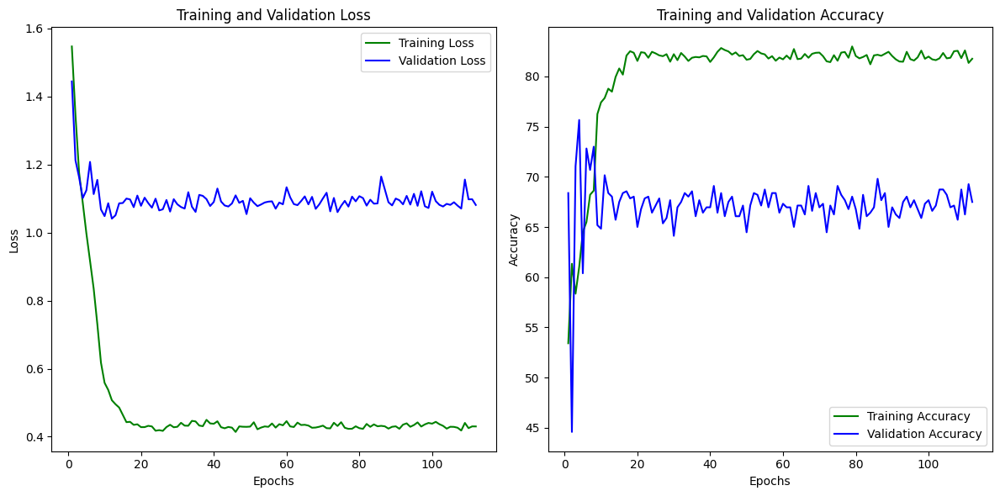


Epoch 113/500
-------------------------------
Epoch: 112, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.367928, correct predictions: 14, total: 16
Batch 70/317 processed, running loss: 31.518374, correct predictions: 922, total: 1136
Batch 140/317 processed, running loss: 60.802240, correct predictions: 1847, total: 2256
Batch 210/317 processed, running loss: 92.536334, correct predictions: 2771, total: 3376
Batch 280/317 processed, running loss: 123.782737, correct predictions: 3686, total: 4496

Training Loss per batch = 0.432386	Accuracy on Training set = 82.042671% [4153/5062]

Validation Loss per batch = 1.130852	Accuracy on Validation set = 68.561279% [386/563]
Train Loss: 0.4324, Train Accuracy: 82.0427
Valid Loss: 1.1309, Valid Accuracy: 68.5613


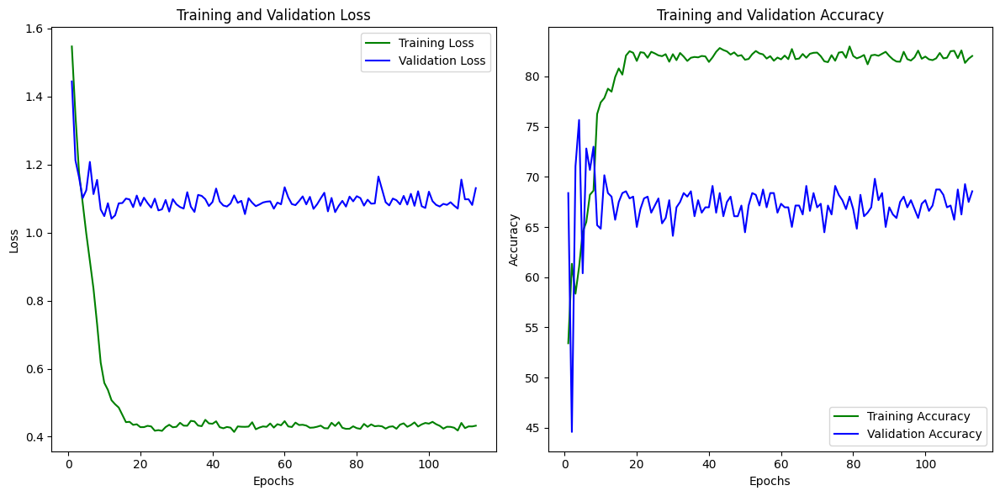


Epoch 114/500
-------------------------------
Epoch: 113, Learning Rate: 0.000000 


<ipython-input-18-a06ff52dd9fb>:72: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'epoch': epoch+1, 'train_loss': train_loss, 'train_accuracy': train_accuracy, 'valid_loss': valid_loss, 'valid_accuracy': valid_accuracy}, ignore_index=True)


Batch 0/317 processed, running loss: 0.459757, correct predictions: 11, total: 16
Batch 70/317 processed, running loss: 28.513724, correct predictions: 930, total: 1136


KeyboardInterrupt: 

In [ ]:
loss_fn   = nn.CrossEntropyLoss(weight=class_weights) #CrossEntropyLoss with class_weights.
optimizer = torch.optim.SGD(model.parameters(),lr=0.005, weight_decay=1e-5)
nb_epochs = 500
patience = 500

#Call the optimize function.
train_losses, valid_losses = optimize(train_dataloader,valid_dataloader,model,loss_fn,optimizer,nb_epochs, patience)

In [ ]:
%cd /content/gdrive/MyDrive/Kaggle/unzip

In [ ]:
model = torch.load("DR_ResNet50_test.pt")
model.eval()  # Set the model to evaluation mode

# Store all the model predictions for the test set
all_preds = []
all_labels = []

# No need to track gradients for evaluation, saves memory and computations
with torch.no_grad():
    for batch in test_dataloader:
        inputs, labels = batch
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)  # Get the index of the max log-probability

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')
plt.show()

from sklearn.metrics import confusion_matrix, classification_report

cm = confusion_matrix(all_labels, all_preds)
print(classification_report(all_labels, all_preds))

# For multiclass case:
num_classes = cm.shape[0]  # assuming cm is a square matrix

for i in range(num_classes):
    tp = cm[i, i]
    fn = cm[i, :].sum() - tp  # sum across the row, excluding the diagonal element
    fp = cm[:, i].sum() - tp  # sum down the column, excluding the diagonal element
    tn = cm.sum() - fn - fp - tp

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    print(f"For class {i}, Sensitivity: {sensitivity}, Specificity: {specificity}")


In [ ]:
!nvidia-smi

In [ ]:
!pwd

In [ ]:
!zip -r data.zip test train